In [4]:
#@title
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/MyDrive/YTP 5th"
!pip install -q transformers
!pip install -q keras-bert==0.81.1
import json
import transformers
import numpy as np
import keras
import os
import re
import tensorflow as tf
from tqdm import tqdm
from keras.utils import plot_model
import matplotlib.pyplot as plt

DATA_PATH = '/content/drive/MyDrive/YTP 5th/data/clean.json'
record=dict()

Mounted at /content/drive
/content/drive/MyDrive/YTP 5th
     |████████████████████████████████| 2.0MB 8.7MB/s 
     |████████████████████████████████| 890kB 1.3MB/s 
     |████████████████████████████████| 3.2MB 57.2MB/s 


# `DataGen`

In [5]:
BATCH_SIZE=32
rank = '2330 3037 2303 6488 8046 2603 3481 2458 2327 2454 2609 3006 2409 2317 2344 3443 2492 3260 2337 6533 3034 4976 3008 5483 4743 2408 2308 6116 3189 2354 2357 6531 3711 2014 4142 2377 3105 3228 5269 2375 8070 3661 4968 3545 3078 3406 5471 8299 1301 6271 2331 1305 2338 2881 3540 2882 3019 6202 4967 3042 4128 4938 2610 2618 0050 2328 2379 3413 2376 2368 3374 2371 2002 2891 8086 3293 2356 6138 2615 4966 2027 6150 2353 3707 6121 1590 2886 6415 6203 3576 2049 1326 4958 4162 8358 5223 6237 8936 2412 2383 6525 6269 2382 2449 2201 3680 3178 3014 8069 5347 3714 8081 2481 1101 1513 6213 2472 6443 6477 6182 5425 2345 2009 1314 2301 5371 3691 1303 4915 5274 2312 1909 3141 3529 8383 2884 6188 6669 6541 3552 2467 6679 3015 2038 6505 8454 2108 5871 3533 2342 3665 3264 5243 3317 6510 1216 1476 2401 6224 3231 6104 1309 8016 8464 2888 6278 2456 0056 1477 5386 2474 3419 4576 2912 2436 6223 2883 6239 1312 6274 3483 5299 6414 8255 9958 6285 5469 8171 2352 2885 2476 1785 2441 6147 2406'.split(' ')

In [6]:
#@title `DataGen`
class DataGen(keras.utils.Sequence):
    def __init__(self, stock_id, batch_size=32, shuffle=True, context='title', concat=False, max_length=40, to01=True, encoder=None, idx_type=0):
        if type(stock_id) in [np.ndarray,list]:
            self.stock_id = list(map(str, stock_id))
        else:
            self.stock_id = [stock_id]
        self.shuffle = shuffle
        self.batch_size = batch_size
        assert context in ['title', 'content']
        self.context = context
        self.concat = concat
        self.max_length = max_length
        self.to01 = bool(to01)
        self.encoder = encoder
        self.tokenizer = transformers.BertTokenizer.from_pretrained("bert-base-chinese",)
        with open(DATA_PATH, 'r', encoding='utf-8') as f:
            tmp = json.load(f)
        self.data = dict()
        for i in tmp:
            if i['stock_id'] in self.stock_id:
                self.data[i['stock_id']] = i
        if len(self.data) != len(self.stock_id):
            raise ValueError(f'stock id ({set(self.stock_id) - set(self.data.keys())}) out of data collection')
        self.x=[]
        self.y=[]
        for [id,d] in self.data.items():
            for i in d['news']:
                if i['index'][idx_type] is None:
                    continue
                if concat:
                    self.x.append(' [SEP] '.join(map(lambda x: x[self.context], i['news'])))
                    self.y.append(i['index'][idx_type])
                else:
                    for j in i['news']:
                        self.x.append(j[self.context])
                        self.y.append(i['index'][idx_type])
        self.x = np.array(self.x)
        self.y = np.array(self.y, dtype="float32")
        self.y = (100 + self.y) / 200
        if self.to01:
            self.y = np.where(self.y > 0.5, 1, 0)
        self.n = len(self.x)
        self.indices = np.arange(self.n)
        self.on_epoch_end()

    def __len__(self):
        return self.n // self.batch_size

    def get_data(self, indices):
        encoded = self.tokenizer(
            self.x[indices].tolist(),
            add_special_tokens=True,
            max_length=self.max_length,
            return_attention_mask=True,
            return_token_type_ids=True,
            padding='max_length',
            truncation=True,
            return_tensors="tf",
        )

        input_ids = np.array(encoded["input_ids"], dtype="int32")
        attention_masks = np.array(encoded["attention_mask"], dtype="int32")
        token_type_ids = np.array(encoded["token_type_ids"], dtype="int32")
        if self.encoder is None:
            return ([input_ids, attention_masks], self.y[indices])
        else:
            return (self.encoder.predict([input_ids, attention_masks]), self.y[indices])

    def __getitem__(self, idx):
        indices = self.indices[idx*self.batch_size : (idx+1)*self.batch_size]
        return self.get_data(indices)

    def all(self):
        return self.get_data(self.indices)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

In [7]:
#@title DataGenRNN
separator = ['。','！','!','？','?',';','；', '...看原文','more...','...more','■']
brackets = ['「」']# + ['()','（）','[]','【】','〈〉','『』']
def non_empty(a):
    return list(filter(lambda x: len(x)!=0, a))
def split_all(string, sep=separator, bra=brackets):
    bra = ''.join(map(lambda x: f'(?![^{re.escape(x[0])}]*{re.escape(x[1])})', bra))
    sep = '('+'|'.join(map(lambda x: re.escape(x), sep))+')'
    res = non_empty(map(lambda x: x.strip(), re.split(sep + bra, string)))
    # return res
    ans = []
    for i in res:
        if re.fullmatch(sep,i) is not None:
            if len(ans) != 0:
                ans[-1] += i
        else:
            ans.append(i)
    return ans
def art2sent(art):
    return split_all(''.join(art.strip().split('\n')))
class DataGenRNN(keras.utils.Sequence):
    def __init__(self, stock_id, encoder, batch_size=32, shuffle=True, concat=False, max_length=200, max_sentences=30, to01=True, idx_type=0):
        if type(stock_id) in [np.ndarray, list]:
            self.stock_id = list(map(str, stock_id))
        else:
            self.stock_id = [stock_id]
        self.shuffle = shuffle
        self.batch_size = batch_size
        self.concat = concat
        self.max_length = max_length
        self.max_sentences = max_sentences
        self.to01 = bool(to01)
        self.encoder = encoder
        self.tokenizer = transformers.BertTokenizer.from_pretrained("bert-base-chinese",)
        with open(DATA_PATH, 'r', encoding='utf-8') as f:
            tmp = json.load(f)
        self.data = dict()
        for i in tmp:
            if i['stock_id'] in self.stock_id:
                self.data[i['stock_id']] = i
        if len(self.data) != len(self.stock_id):
            raise ValueError(f'stock id ({set(self.stock_id) - set(self.data.keys())}) out of data collection')
        self.x = []
        self.y = []
        for [id,d] in self.data.items():
            for i in d['news']:
                if i['index'][idx_type] is None:
                    continue
                if concat:
                    self.x.append([])
                    self.y.append(i['index'][idx_type])
                    for j in i['news']:
                        self.x[-1] += art2sent(j['content'])
                else:
                    for j in i['news']:
                        self.x.append(art2sent(j['content']))
                        self.y.append(i['index'][idx_type])
        self.x = np.array(self.x, dtype=object)
        self.y = np.array(self.y, dtype="float32")
        self.y = (100 + self.y) / 200
        if self.to01:
            self.y = np.where(self.y > 0.5, 1, 0)
        self.n = len(self.x)
        self.indices = np.arange(self.n)
        self.on_epoch_end()

    def __len__(self):
        return self.n // self.batch_size

    def get_data(self, indices):
        def process(x):
            encoded = self.tokenizer(
                x if type(x) == list else x.tolist(),
                add_special_tokens=True,
                max_length=self.max_length,
                return_attention_mask=True,
                return_token_type_ids=True,
                padding='max_length',
                truncation=True,
                return_tensors="tf",
            )
            input_ids = np.array(encoded["input_ids"], dtype="int32")
            attention_masks = np.array(encoded["attention_mask"], dtype="int32")
            token_type_ids = np.array(encoded["token_type_ids"], dtype="int32")
            x = self.encoder.predict([input_ids, attention_masks])
            if len(x) > self.max_sentences:
                x = x[:self.max_sentences]
            elif len(x) < self.max_sentences:
                x = np.append(x, np.zeros((self.max_sentences - len(x),) + x.shape[1:]), axis=0)
            return x
        return (np.array(list(map(process, tqdm(self.x[indices])))), self.y[indices])

    def __getitem__(self, idx):
        indices = self.indices[idx*self.batch_size : (idx+1)*self.batch_size]
        return self.get_data(indices)

    def all(self):
        return self.get_data(self.indices)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

# `split`

In [8]:
def split(data,ratio=[1]):
    n=len(data[0])
    ret=[]
    for i in range(1,len(ratio)):
        ratio[i]+=ratio[i-1]
    if ratio[-1]!=1:
        ratio.append(1)
    for i in range(len(ratio)):
        ratio[i]=int(ratio[i]*n)
    ratio=[0]+ratio
    for d in data:
        ret.append([])
        for i in range(len(ratio)-1):
            ret[-1].append(d[ratio[i]:ratio[i+1]])
    return ret

# `getBERT`

In [9]:
from keras_bert import load_trained_model_from_checkpoint
pretrained_path = 'chinese_L-12_H-768_A-12'
config_path = os.path.join(pretrained_path, 'bert_config.json')
checkpoint_path = os.path.join(pretrained_path, 'bert_model.ckpt')

def getBERT(SEQ_LEN):
    layer_num = 12
    bert = load_trained_model_from_checkpoint(
        config_path,
        checkpoint_path,
        training=True,
        use_adapter=True,
        trainable=['Encoder-{}-MultiHeadSelfAttention-Adapter'.format(i + 1) for i in range(layer_num)] +
        ['Encoder-{}-FeedForward-Adapter'.format(i + 1) for i in range(layer_num)] +
        ['Encoder-{}-MultiHeadSelfAttention-Norm'.format(i + 1) for i in range(layer_num)] +
        ['Encoder-{}-FeedForward-Norm'.format(i + 1) for i in range(layer_num)],
        seq_len=SEQ_LEN
    )
    inputs = bert.inputs[:2]
    outputs = bert.get_layer('NSP-Dense').output
    return keras.models.Model(inputs, outputs, name='bert_w2v')

# `Record`

In [10]:
class Record(keras.callbacks.Callback):
    def __init__(self):
        self.history=dict()
    
    def plot(self):
        title=['loss', 'acc', 'mae']
        title=[[s, 'val_' + s] for s in title]
        fig, ax = plt.subplots(3, figsize=(10, 15))
        for i, [a, b] in enumerate(title):
            ha, hb = self.history[a], self.history[b]
            ax[i].plot(ha, label=a)
            ax[i].plot(hb, label=b)
            ax[i].set_xlabel('epochs')
            ax[i].set_ylabel(a)
            ax[i].legend()
            ax[i].grid()
        plt.show()

    def on_epoch_end(self, epoch, logs=None):
        for i in logs:
            if i not in self.history:
                self.history[i]=[]
            self.history[i].append(logs[i])
        self.plot()

# sol.3 BERT + RNN

In [ ]:
SEQ_LEN = 256
SENT_LEN = 30
BATCH_SIZE = 32

In [ ]:
import keras

dor = 0
bert_w2v = getBERT(SEQ_LEN)

inputs = keras.layers.Input((SENT_LEN,) + bert_w2v.output_shape[1:])
outputs = keras.layers.Masking(mask_value=0.0)(inputs)
outputs = keras.layers.Dropout(dor)(outputs)
outputs = keras.layers.Bidirectional(keras.layers.LSTM(128, return_sequences=True, activation='relu'))(outputs)
outputs = keras.layers.Dropout(dor)(outputs)
outputs = keras.layers.Bidirectional(keras.layers.LSTM(16))(outputs)
outputs = keras.layers.Dense(1, activation='sigmoid')(outputs)
decision = keras.models.Model(inputs, outputs, name='decision')

# inputs = [keras.layers.Input((SENT_LEN, SEQ_LEN)), keras.layers.Input((SENT_LEN, SEQ_LEN))]
# outputs = keras.layers.TimeDistributed(bert_w2v)(inputs)
# outputs = decision(outputs)
# model = keras.models.Model(inputs, outputs)

In [ ]:
decision.summary()
# model.summary()

Model: "decision"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 30, 768)]         0         
_________________________________________________________________
masking (Masking)            (None, 30, 768)           0         
_________________________________________________________________
dropout (Dropout)            (None, 30, 768)           0         
_________________________________________________________________
bidirectional (Bidirectional (None, 30, 256)           918528    
_________________________________________________________________
dropout_1 (Dropout)          (None, 30, 256)           0         
_________________________________________________________________
bidirectional_1 (Bidirection (None, 32)                34944     
_________________________________________________________________
dense (Dense)                (None, 1)                 33 

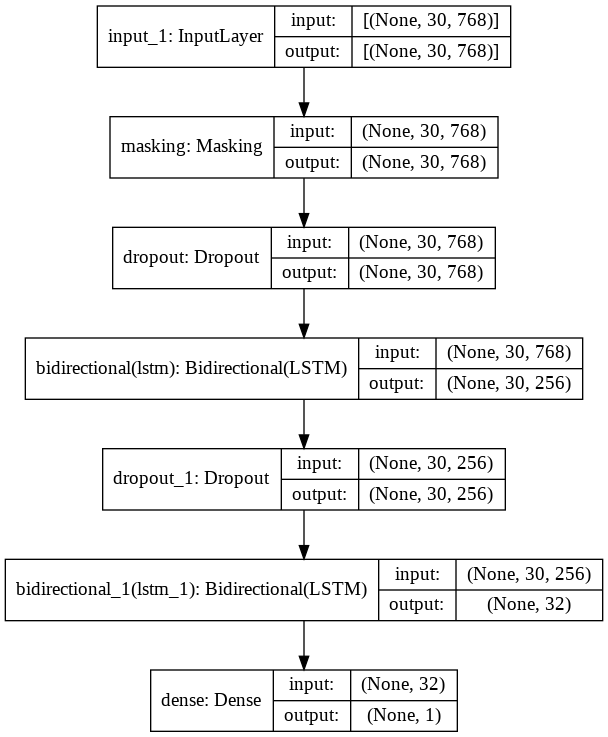

In [ ]:
plot_model(decision, show_shapes=True)

In [ ]:
def custom_loss(y_true, y_pred):
    bc = keras.losses.binary_crossentropy(y_true, y_pred)
    mae = keras.losses.mean_absolute_error(y_true, y_pred)
    mse = keras.losses.mean_squared_error(y_true, y_pred)
    return bc
    return (bc + mae) / 2
# bert_w2v.trainable=True
# model.compile(
#     # loss='binary_crossentropy',
#     loss='mae',
#     optimizer=keras.optimizers.Adam(0.0001),
#     metrics=[keras.metrics.BinaryAccuracy(name='acc'),keras.metrics.MeanAbsoluteError(name='mae')]
# )
decision.compile(
    loss=custom_loss,
    optimizer=keras.optimizers.Adam(0.001),
    metrics=[keras.metrics.BinaryAccuracy(name='acc'),keras.metrics.MeanAbsoluteError(name='mae')]
)

In [ ]:
# data = DataGenRNN(rank[:30], encoder=bert_w2v, concat=False, to01=True, max_length=SEQ_LEN, max_sentences=SENT_LEN, idx_type=2)
# x, y = data.all()
# np.savez('./data/training-RNN-rk30-idx2.npz', x=x, y=y)

In [ ]:
t = np.load('./data/training-RNN-rk10.npz')
x, y = t['x'], t['y']

In [ ]:
[[training_x, val_x, testing_x], [training_y, val_y, testing_y]] = split([x, y], [0.75, 0.15])

In [ ]:
#@title
# data.x
# all=[]
# for i in data.x:
#     all+=i
# def process(x):
#     encoded = data.tokenizer(
#         x if type(x) == list else x.tolist(),
#         add_special_tokens=True,
#         max_length=data.max_length,
#         return_attention_mask=True,
#         return_token_type_ids=True,
#         padding='max_length',
#         truncation=True,
#         return_tensors="tf",
#     )
#     input_ids = np.array(encoded["input_ids"], dtype="int32")
#     attention_masks = np.array(encoded["attention_mask"], dtype="int32")
#     token_type_ids = np.array(encoded["token_type_ids"], dtype="int32")
#     x = data.encoder.predict([input_ids, attention_masks])
#     return x
# import time
# now=time.time()
# process(all)
# print(time.time()-now)

Epoch 1/150
223/223 [==============================] - 72s 150ms/step - loss: 0.7165 - acc: 0.5061 - mae: 0.4992 - val_loss: 0.6971 - val_acc: 0.5004 - val_mae: 0.5000


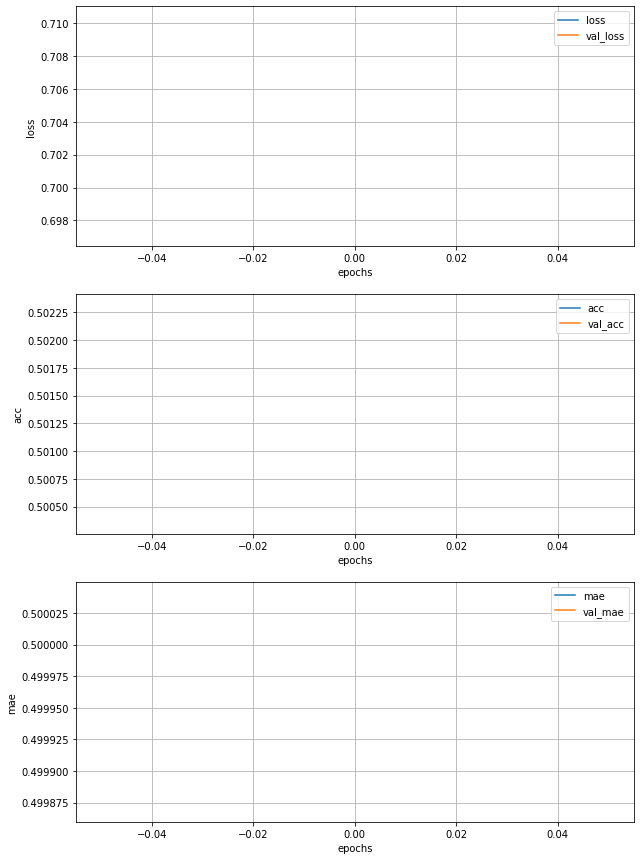

Epoch 2/150
223/223 [==============================] - 31s 138ms/step - loss: 0.6996 - acc: 0.5107 - mae: 0.5003 - val_loss: 0.6984 - val_acc: 0.4849 - val_mae: 0.5014


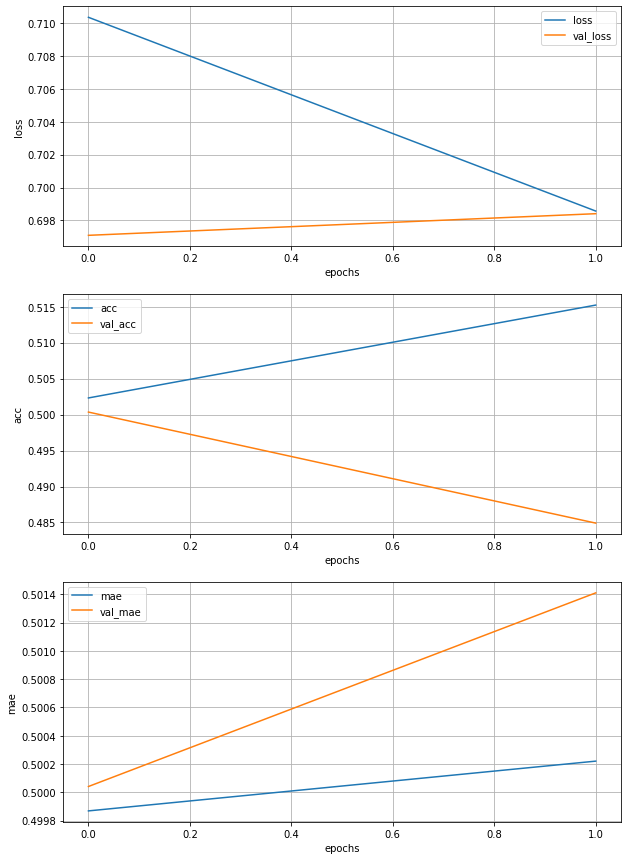

Epoch 3/150
223/223 [==============================] - 30s 136ms/step - loss: 0.6950 - acc: 0.5124 - mae: 0.4996 - val_loss: 0.6978 - val_acc: 0.4975 - val_mae: 0.5004


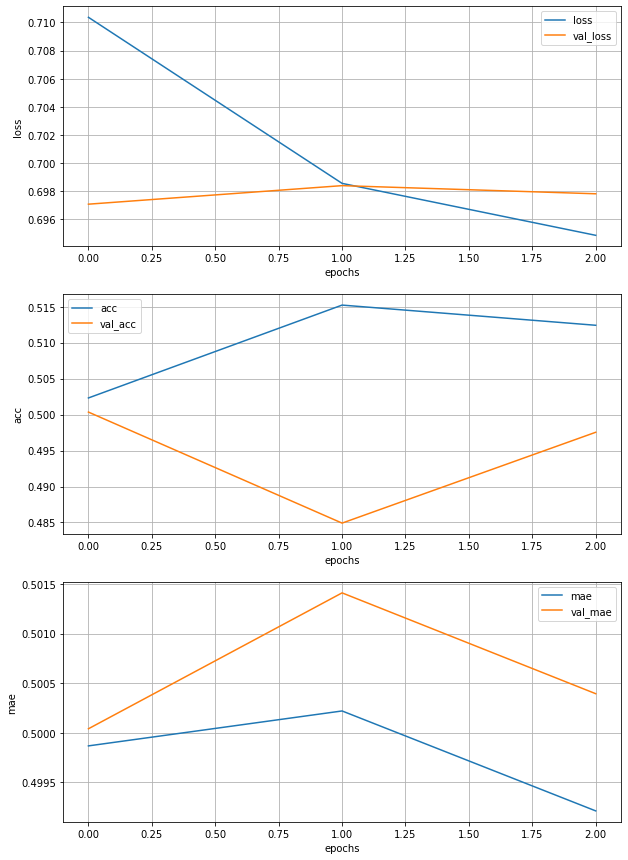

Epoch 4/150
223/223 [==============================] - 31s 140ms/step - loss: 0.6943 - acc: 0.5099 - mae: 0.4990 - val_loss: 0.6995 - val_acc: 0.4688 - val_mae: 0.5014


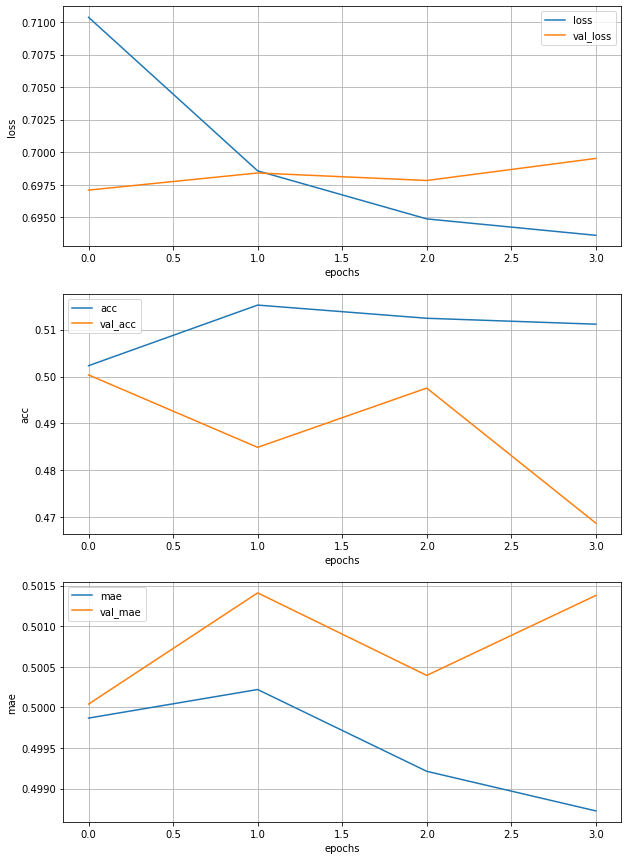

Epoch 5/150
223/223 [==============================] - 30s 135ms/step - loss: 0.6950 - acc: 0.4949 - mae: 0.4995 - val_loss: 0.6978 - val_acc: 0.4919 - val_mae: 0.4997


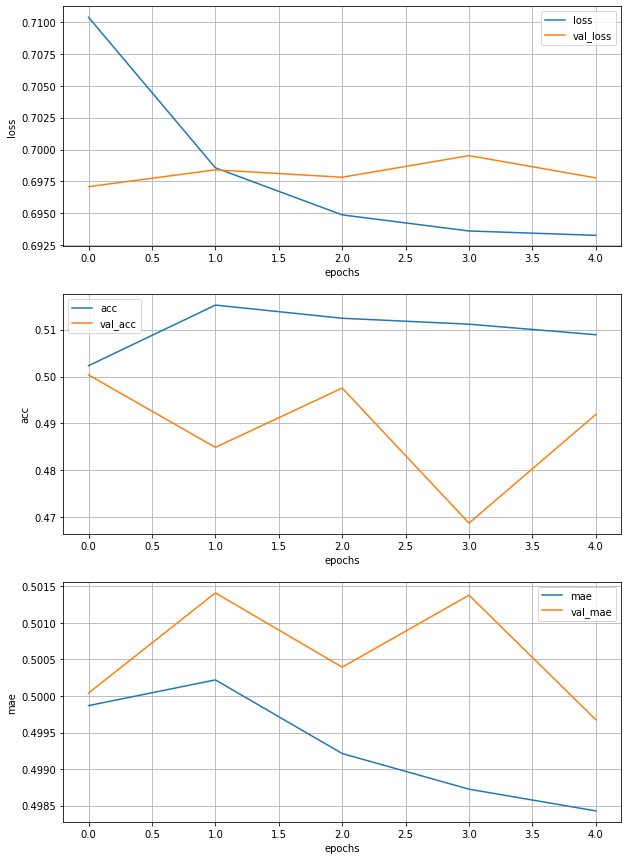

Epoch 6/150
223/223 [==============================] - 32s 142ms/step - loss: 0.6939 - acc: 0.5081 - mae: 0.4979 - val_loss: 0.6966 - val_acc: 0.4870 - val_mae: 0.5001


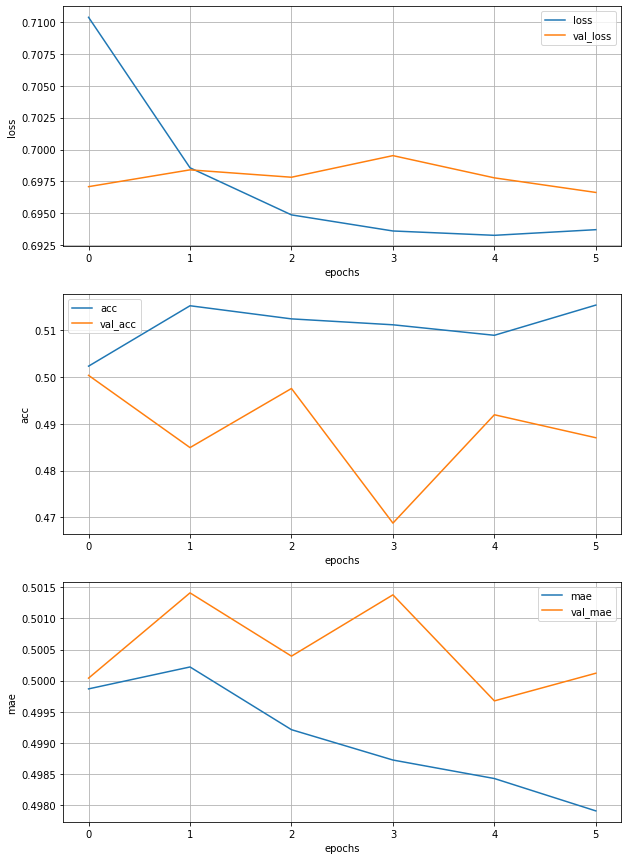

Epoch 7/150
223/223 [==============================] - 31s 140ms/step - loss: 0.6924 - acc: 0.5230 - mae: 0.4978 - val_loss: 0.6949 - val_acc: 0.4919 - val_mae: 0.4998


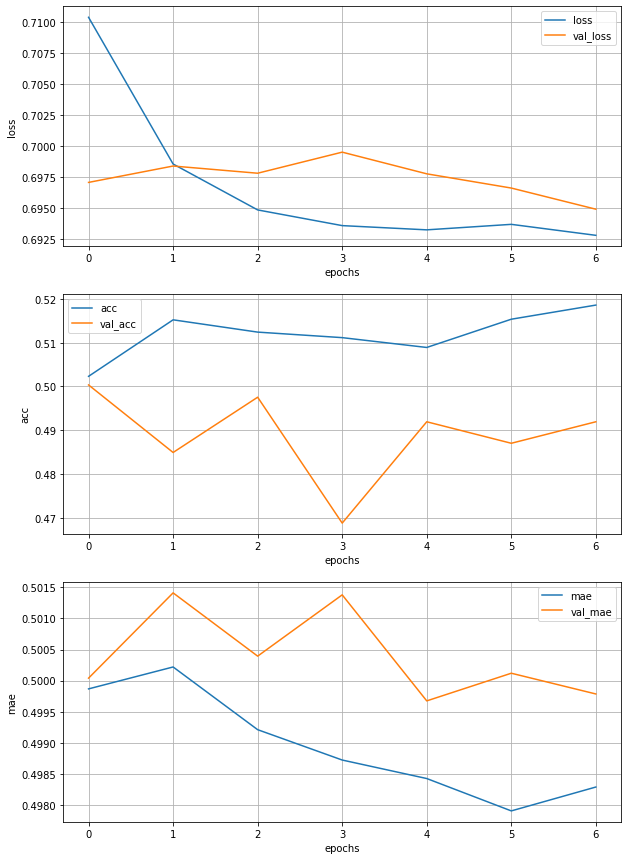

Epoch 8/150
223/223 [==============================] - 31s 141ms/step - loss: 0.6920 - acc: 0.5173 - mae: 0.4984 - val_loss: 0.6963 - val_acc: 0.5032 - val_mae: 0.4996


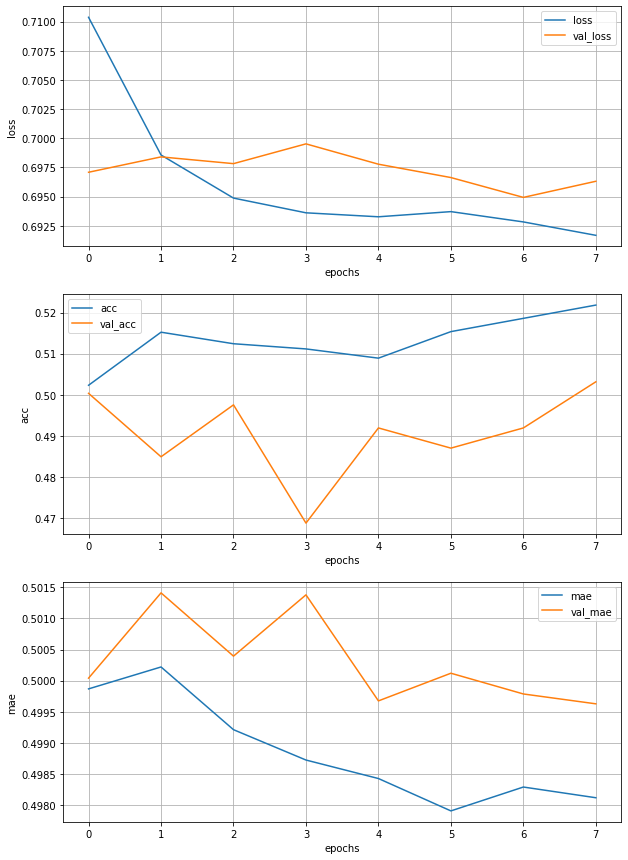

Epoch 9/150
223/223 [==============================] - 32s 143ms/step - loss: 0.6919 - acc: 0.5321 - mae: 0.4977 - val_loss: 0.6920 - val_acc: 0.5298 - val_mae: 0.4981


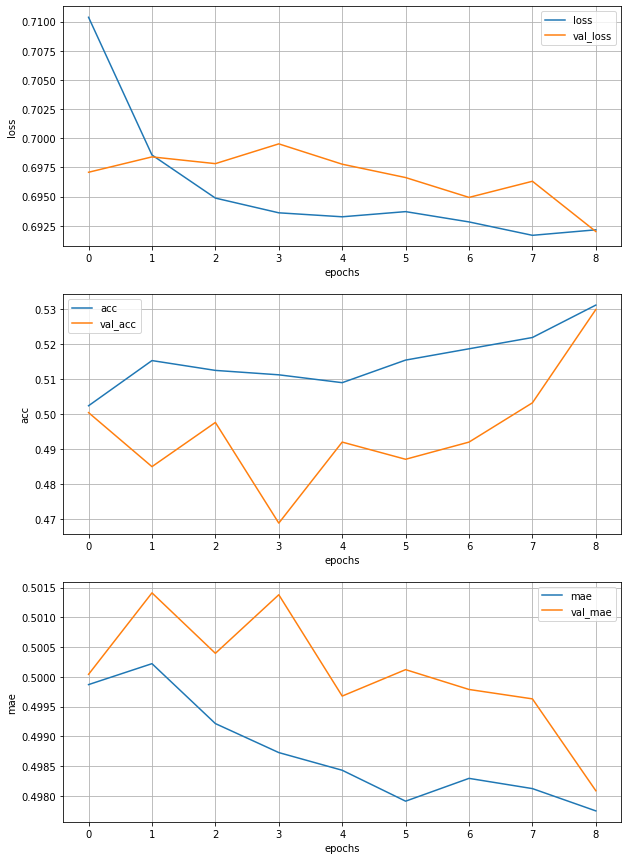

Epoch 10/150
223/223 [==============================] - 33s 147ms/step - loss: 0.6911 - acc: 0.5313 - mae: 0.4975 - val_loss: 0.6974 - val_acc: 0.4877 - val_mae: 0.5005


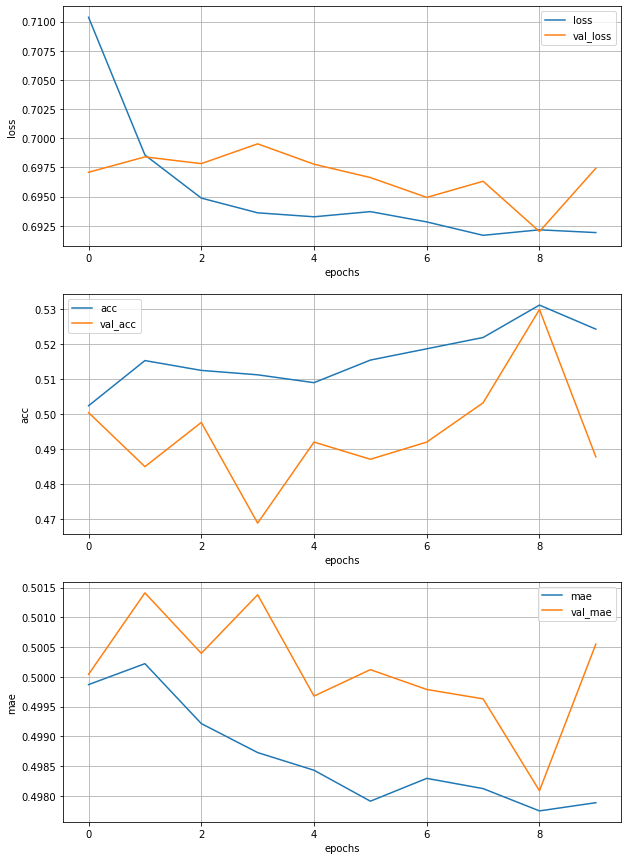

Epoch 11/150
223/223 [==============================] - 33s 147ms/step - loss: 0.6922 - acc: 0.5189 - mae: 0.4982 - val_loss: 0.6938 - val_acc: 0.4870 - val_mae: 0.4994


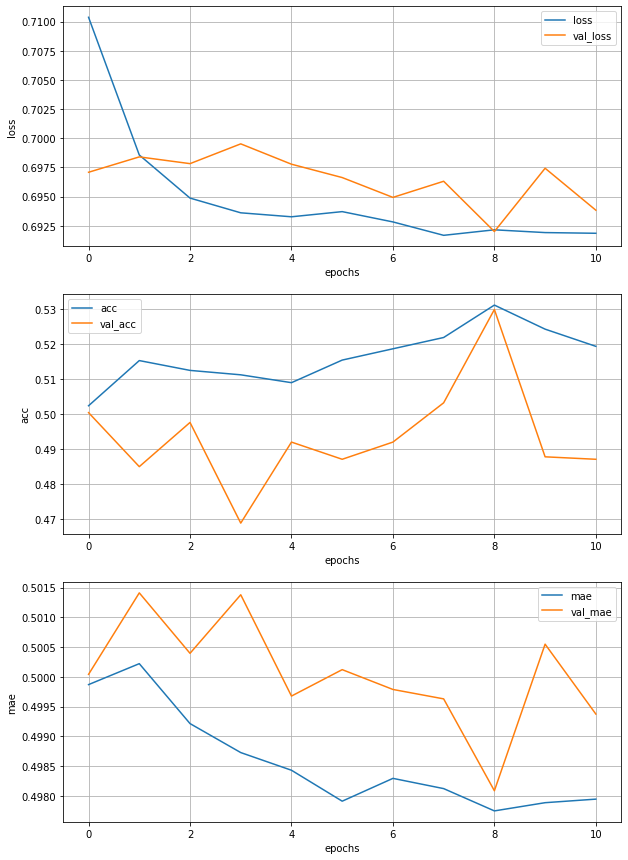

Epoch 12/150
223/223 [==============================] - 33s 148ms/step - loss: 0.6924 - acc: 0.5156 - mae: 0.4983 - val_loss: 0.6965 - val_acc: 0.4961 - val_mae: 0.4999


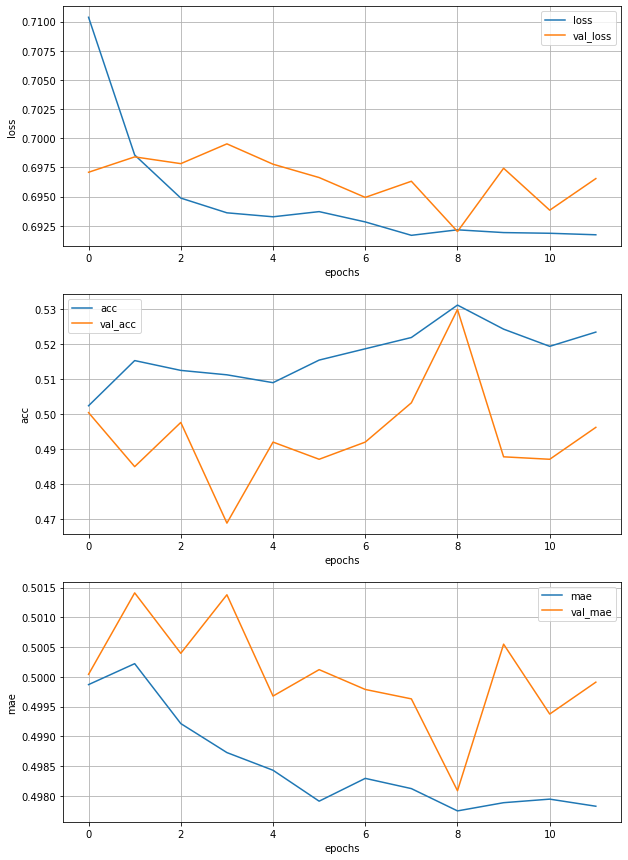

Epoch 13/150
223/223 [==============================] - 34s 150ms/step - loss: 0.6913 - acc: 0.5267 - mae: 0.4970 - val_loss: 0.6957 - val_acc: 0.5165 - val_mae: 0.4968


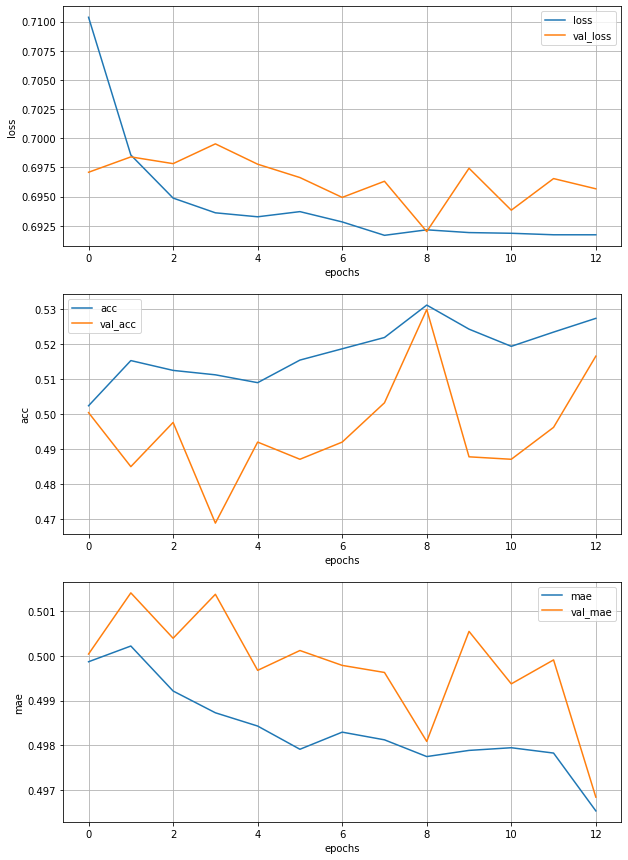

Epoch 14/150
223/223 [==============================] - 34s 151ms/step - loss: 0.6935 - acc: 0.5252 - mae: 0.4983 - val_loss: 0.6919 - val_acc: 0.5256 - val_mae: 0.4986


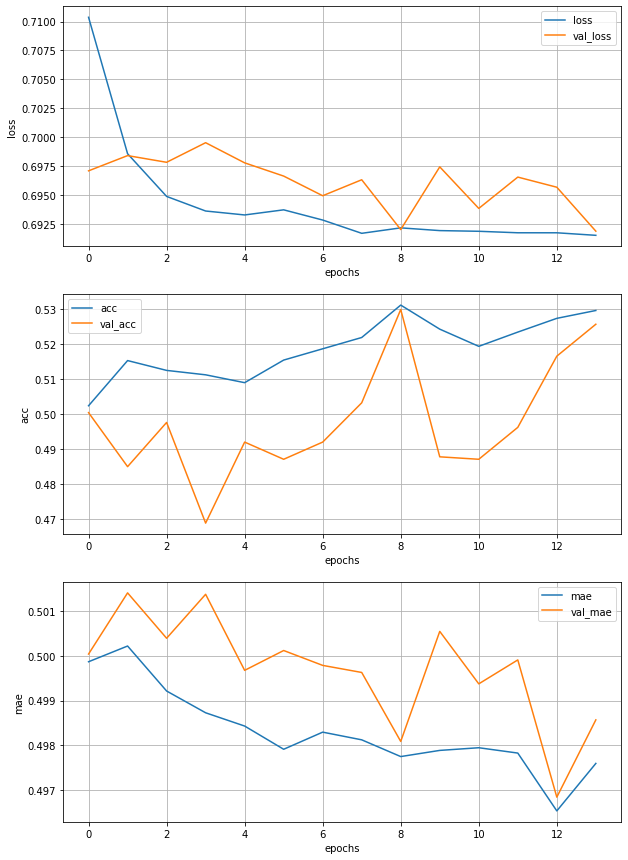

Epoch 15/150
223/223 [==============================] - 33s 150ms/step - loss: 0.6911 - acc: 0.5307 - mae: 0.4979 - val_loss: 0.6951 - val_acc: 0.4982 - val_mae: 0.4999


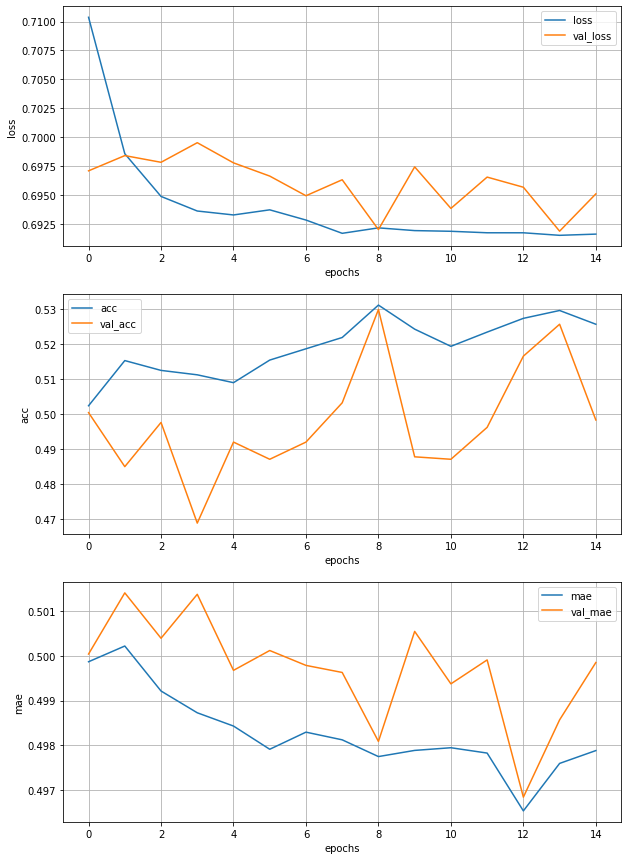

Epoch 16/150
223/223 [==============================] - 33s 150ms/step - loss: 0.6912 - acc: 0.5229 - mae: 0.4979 - val_loss: 0.6927 - val_acc: 0.5200 - val_mae: 0.4985


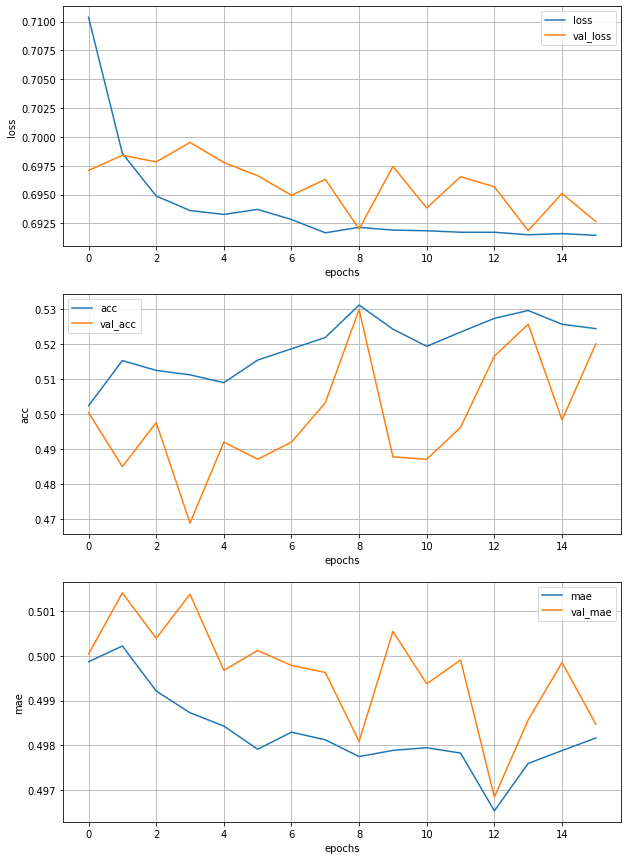

Epoch 17/150
223/223 [==============================] - 34s 151ms/step - loss: 0.6899 - acc: 0.5272 - mae: 0.4971 - val_loss: 0.6974 - val_acc: 0.4758 - val_mae: 0.5008


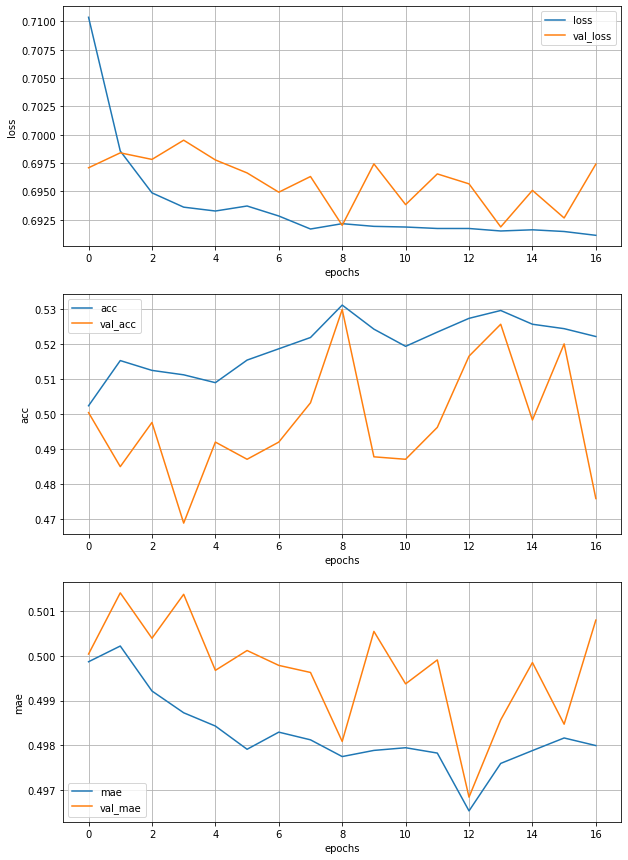

Epoch 18/150
223/223 [==============================] - 33s 150ms/step - loss: 0.6907 - acc: 0.5325 - mae: 0.4963 - val_loss: 0.6927 - val_acc: 0.5256 - val_mae: 0.4986


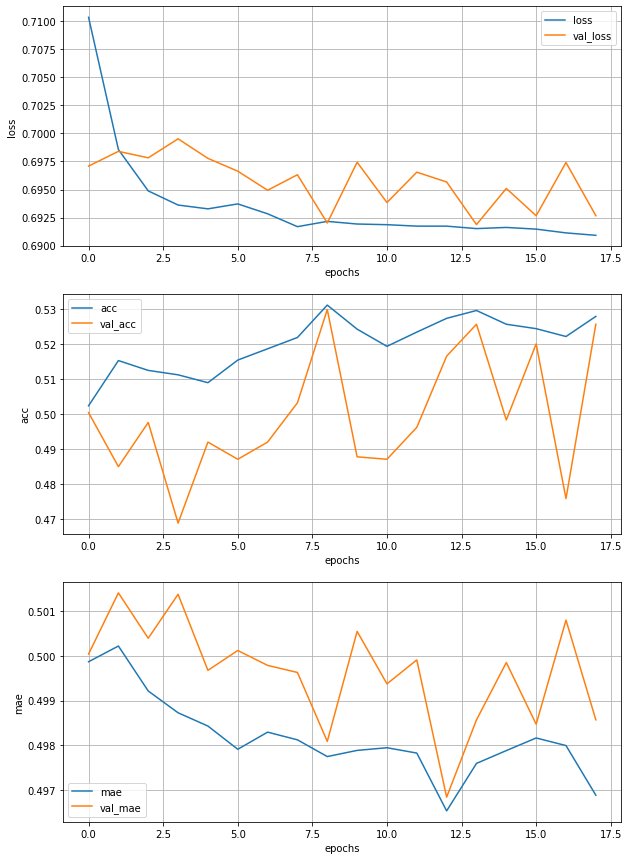

Epoch 19/150
223/223 [==============================] - 34s 154ms/step - loss: 0.6920 - acc: 0.5129 - mae: 0.4978 - val_loss: 0.6917 - val_acc: 0.5200 - val_mae: 0.4984


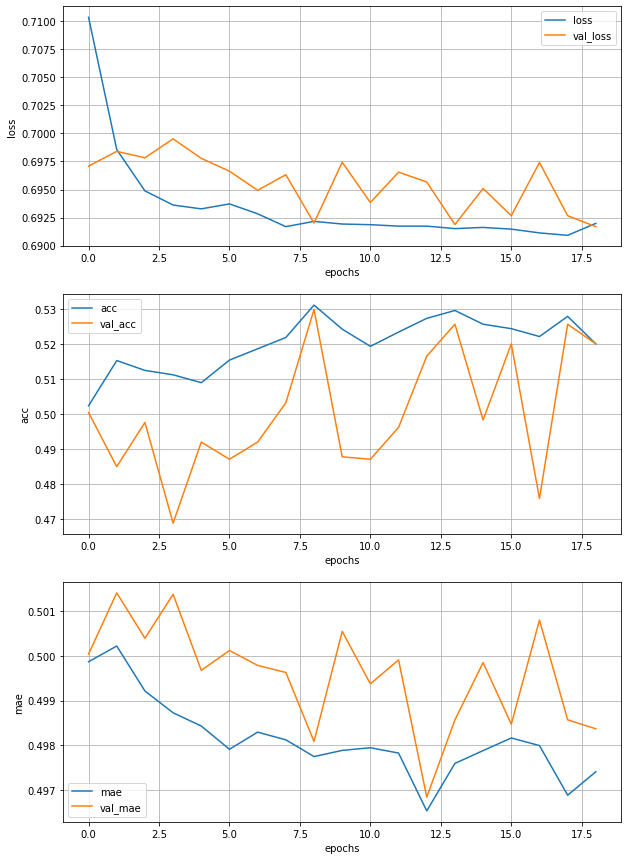

Epoch 20/150
223/223 [==============================] - 35s 158ms/step - loss: 0.6919 - acc: 0.5174 - mae: 0.4984 - val_loss: 0.6926 - val_acc: 0.4947 - val_mae: 0.4983


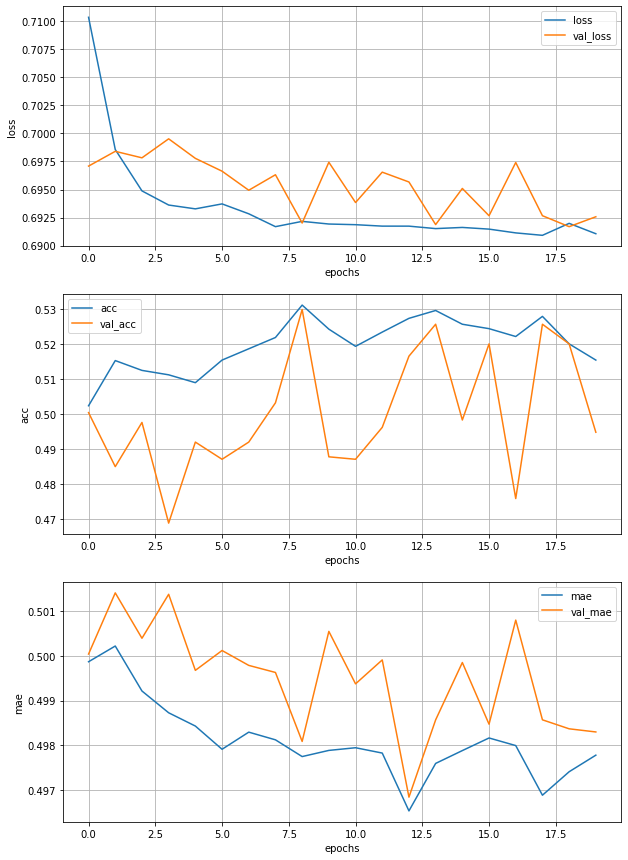

Epoch 21/150
223/223 [==============================] - 35s 156ms/step - loss: 0.6899 - acc: 0.5181 - mae: 0.4970 - val_loss: 0.6907 - val_acc: 0.5375 - val_mae: 0.4979


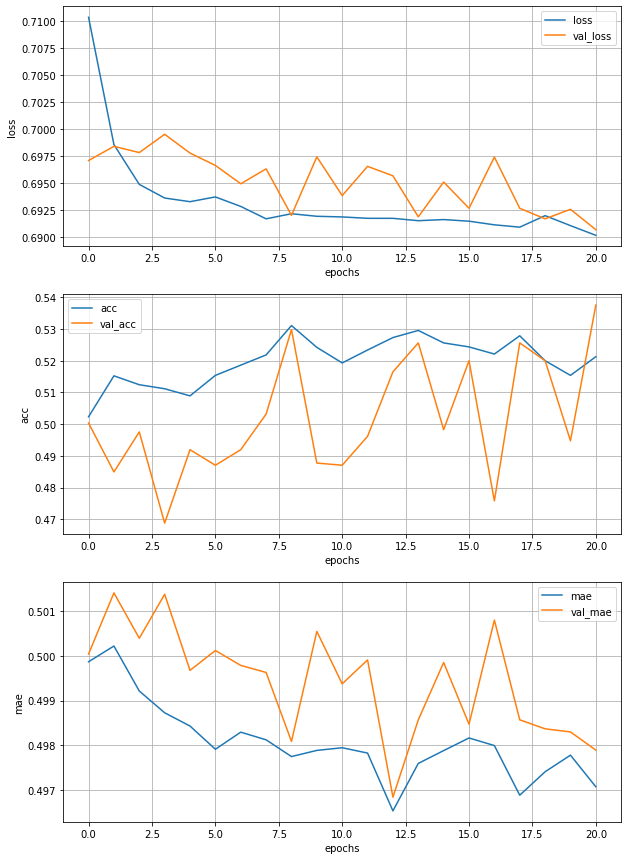

Epoch 22/150
223/223 [==============================] - 35s 156ms/step - loss: 0.6899 - acc: 0.5285 - mae: 0.4973 - val_loss: 0.6929 - val_acc: 0.5102 - val_mae: 0.4985


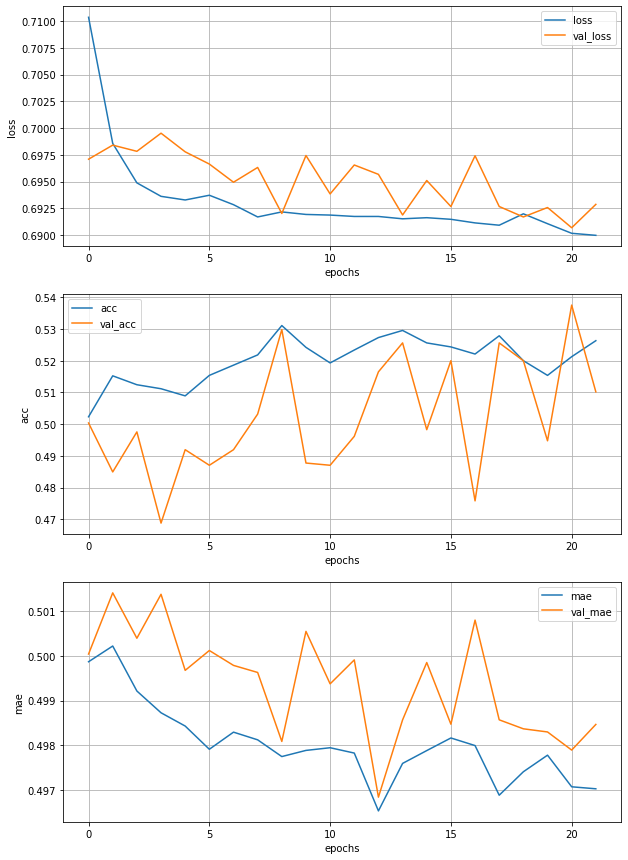

Epoch 23/150
223/223 [==============================] - 36s 159ms/step - loss: 0.6897 - acc: 0.5175 - mae: 0.4969 - val_loss: 0.6920 - val_acc: 0.4947 - val_mae: 0.4986


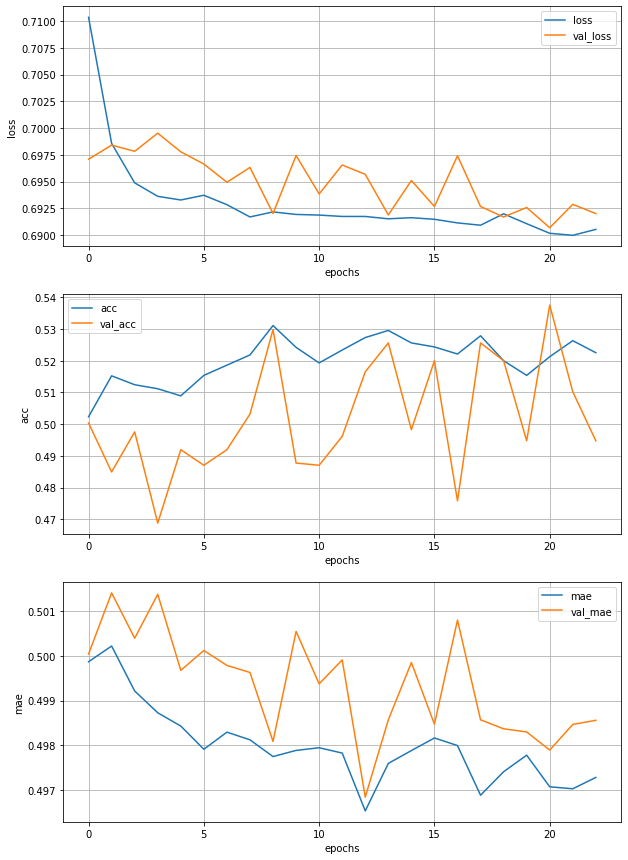

Epoch 24/150
223/223 [==============================] - 36s 160ms/step - loss: 0.6900 - acc: 0.5244 - mae: 0.4970 - val_loss: 0.6950 - val_acc: 0.4947 - val_mae: 0.4990


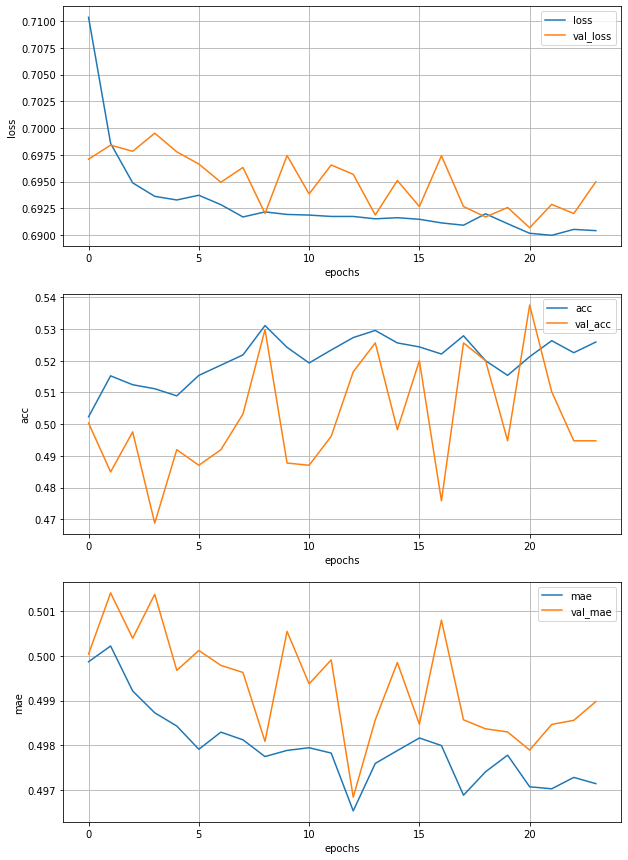

Epoch 25/150
223/223 [==============================] - 37s 164ms/step - loss: 0.6913 - acc: 0.5293 - mae: 0.4974 - val_loss: 0.6920 - val_acc: 0.5179 - val_mae: 0.4984


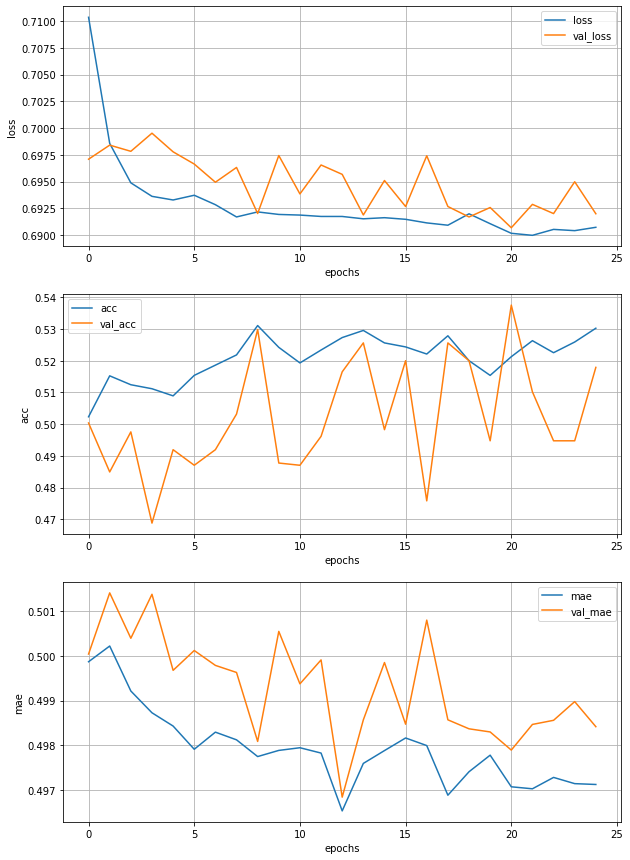

Epoch 26/150
223/223 [==============================] - 37s 164ms/step - loss: 0.6899 - acc: 0.5341 - mae: 0.4970 - val_loss: 0.6950 - val_acc: 0.4947 - val_mae: 0.4991


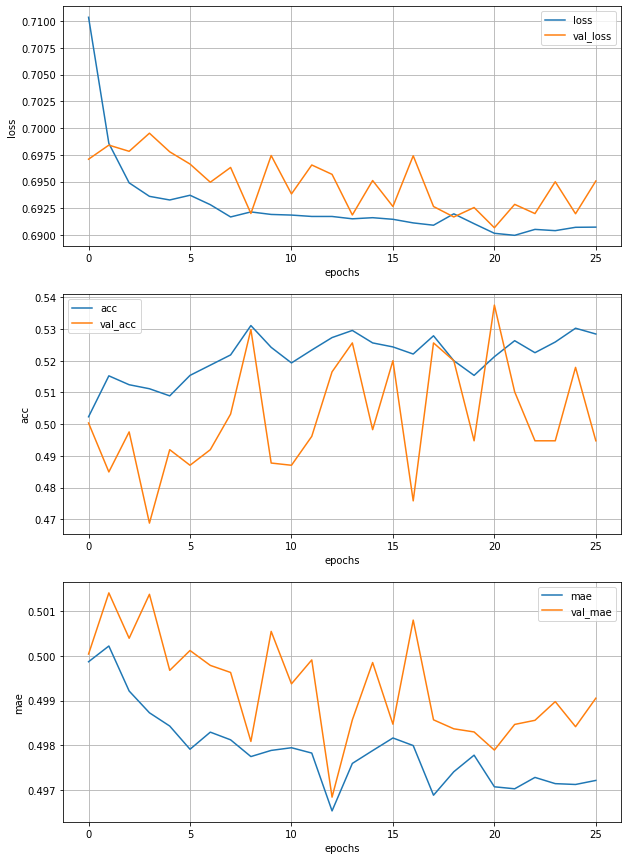

Epoch 27/150
223/223 [==============================] - 36s 164ms/step - loss: 0.6893 - acc: 0.5319 - mae: 0.4966 - val_loss: 0.6921 - val_acc: 0.4954 - val_mae: 0.4986


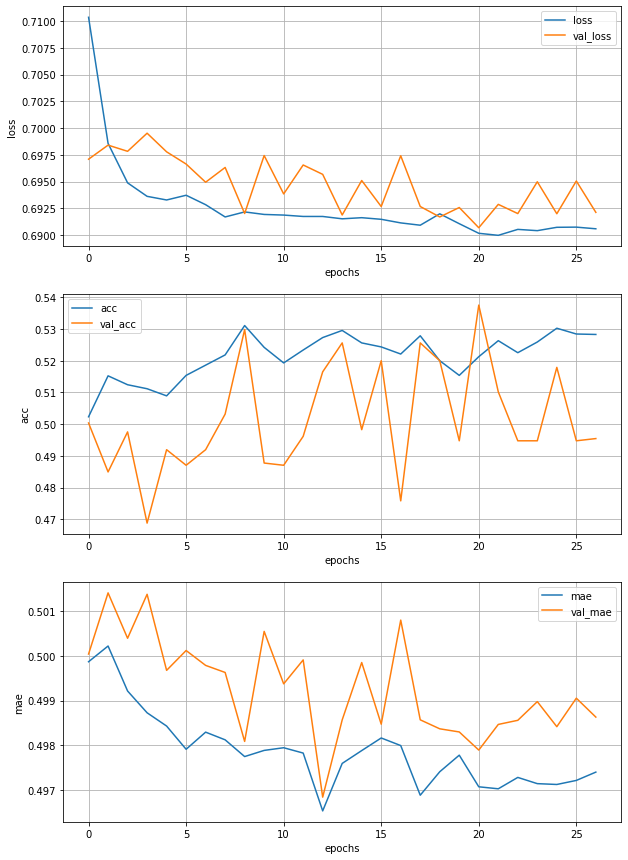

Epoch 28/150
223/223 [==============================] - 37s 166ms/step - loss: 0.6903 - acc: 0.5257 - mae: 0.4975 - val_loss: 0.6965 - val_acc: 0.4947 - val_mae: 0.4989


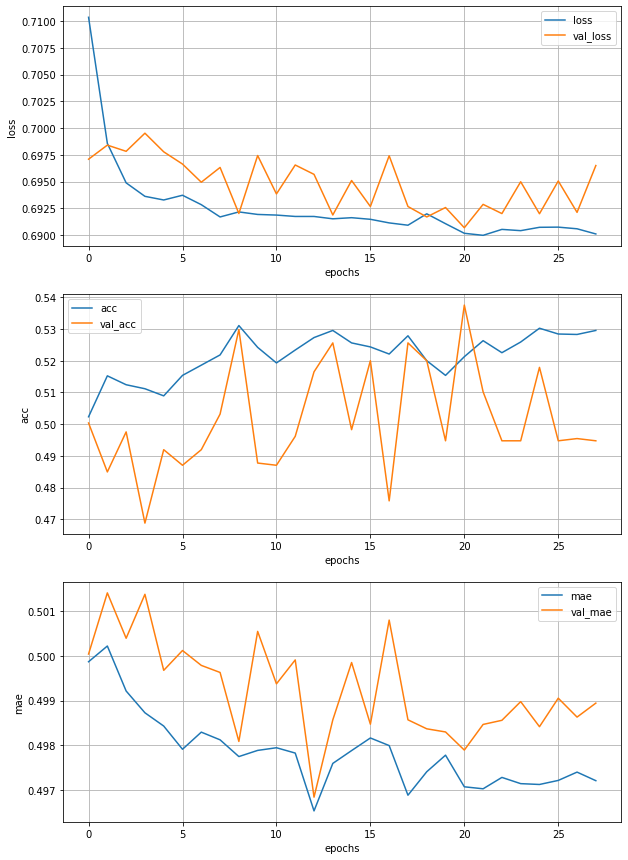

Epoch 29/150
223/223 [==============================] - 36s 163ms/step - loss: 0.6894 - acc: 0.5339 - mae: 0.4956 - val_loss: 0.6901 - val_acc: 0.5256 - val_mae: 0.4969


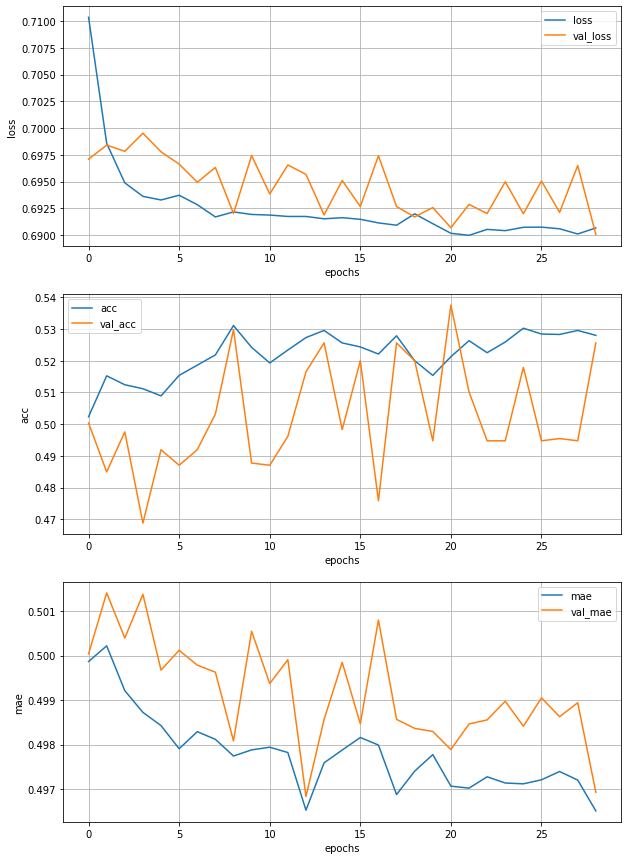

Epoch 30/150
223/223 [==============================] - 37s 166ms/step - loss: 0.6909 - acc: 0.5232 - mae: 0.4974 - val_loss: 0.6950 - val_acc: 0.5039 - val_mae: 0.4983


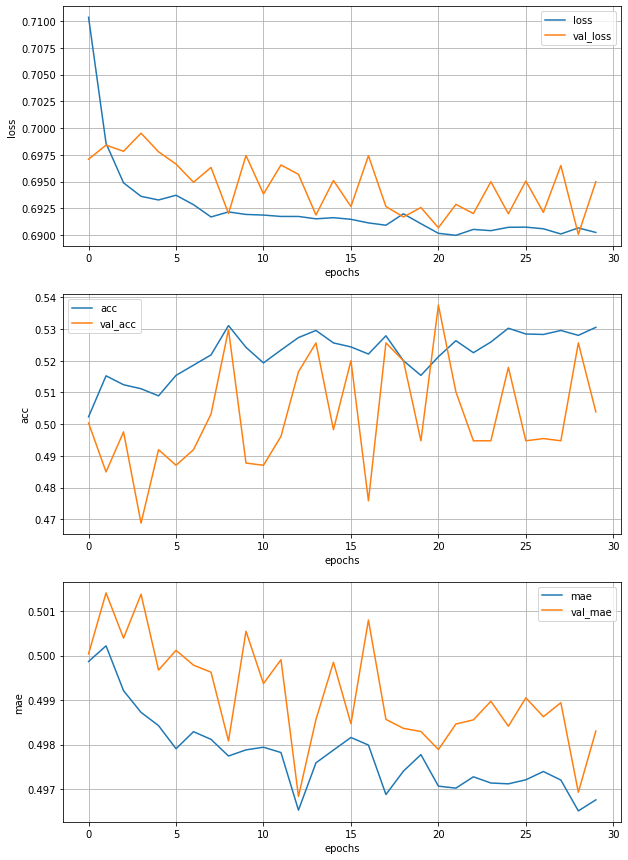

Epoch 31/150
223/223 [==============================] - 38s 169ms/step - loss: 0.6915 - acc: 0.5256 - mae: 0.4966 - val_loss: 0.6930 - val_acc: 0.5242 - val_mae: 0.4990


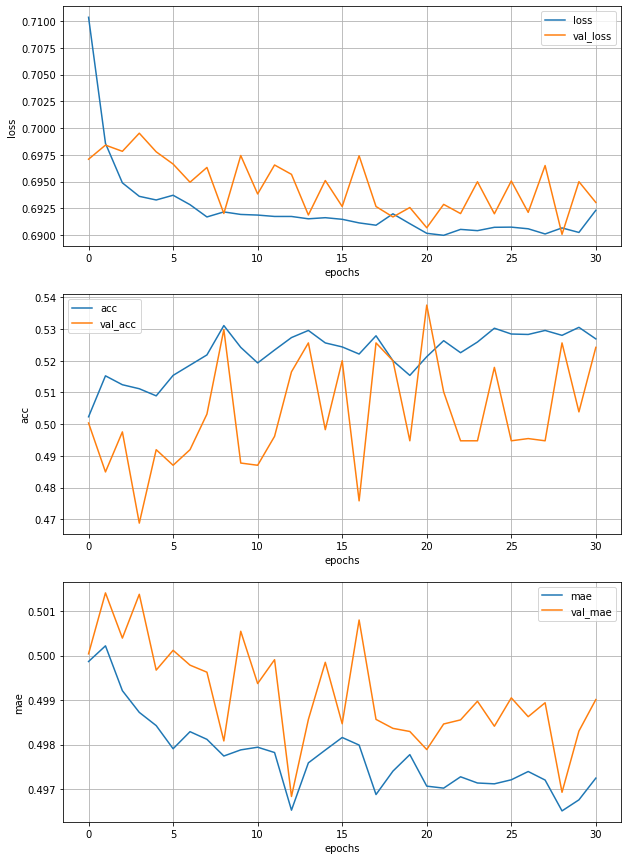

Epoch 32/150
223/223 [==============================] - 37s 167ms/step - loss: 0.6912 - acc: 0.5297 - mae: 0.4976 - val_loss: 0.6953 - val_acc: 0.4947 - val_mae: 0.4995


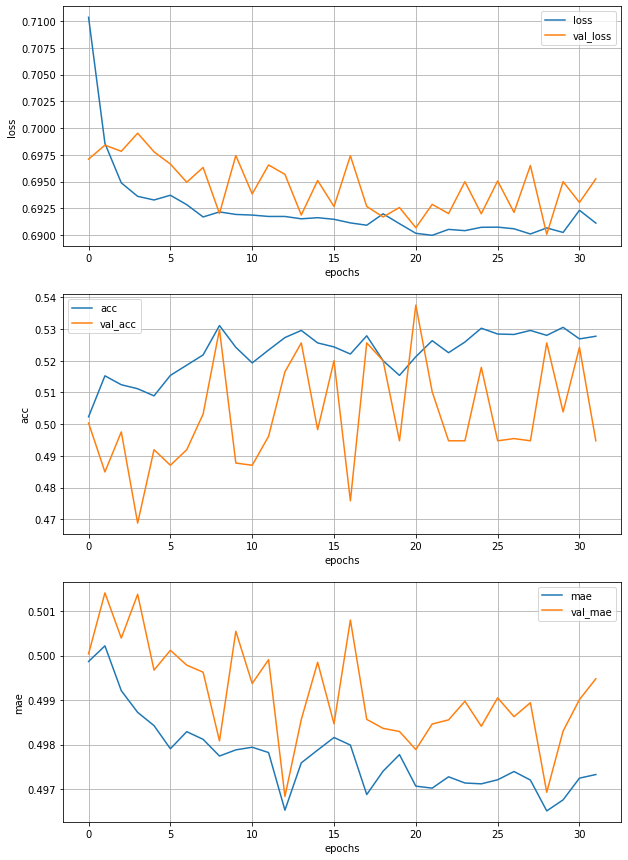

Epoch 33/150
223/223 [==============================] - 37s 168ms/step - loss: 0.6927 - acc: 0.5068 - mae: 0.4991 - val_loss: 0.6994 - val_acc: 0.4954 - val_mae: 0.4996


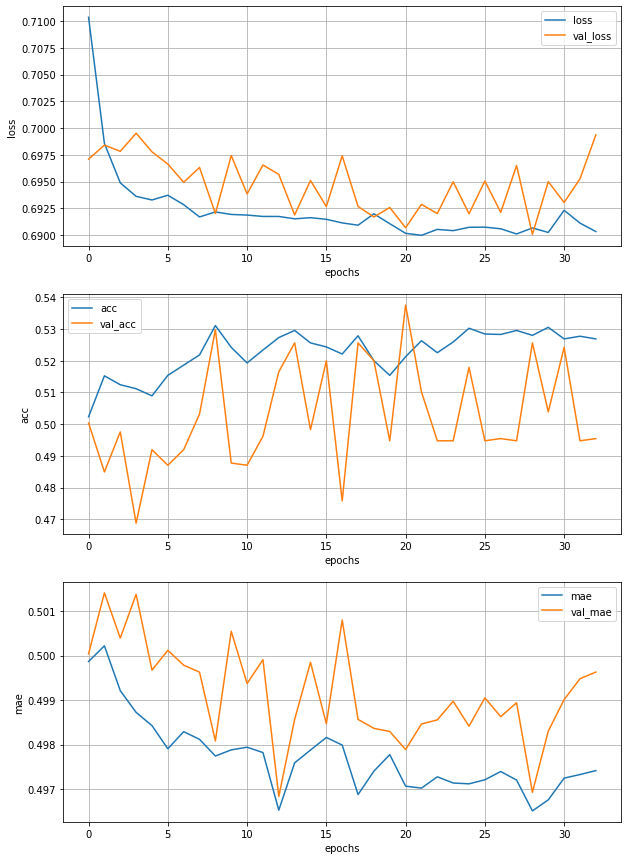

Epoch 34/150
223/223 [==============================] - 37s 167ms/step - loss: 0.6893 - acc: 0.5345 - mae: 0.4959 - val_loss: 0.6931 - val_acc: 0.5095 - val_mae: 0.4988


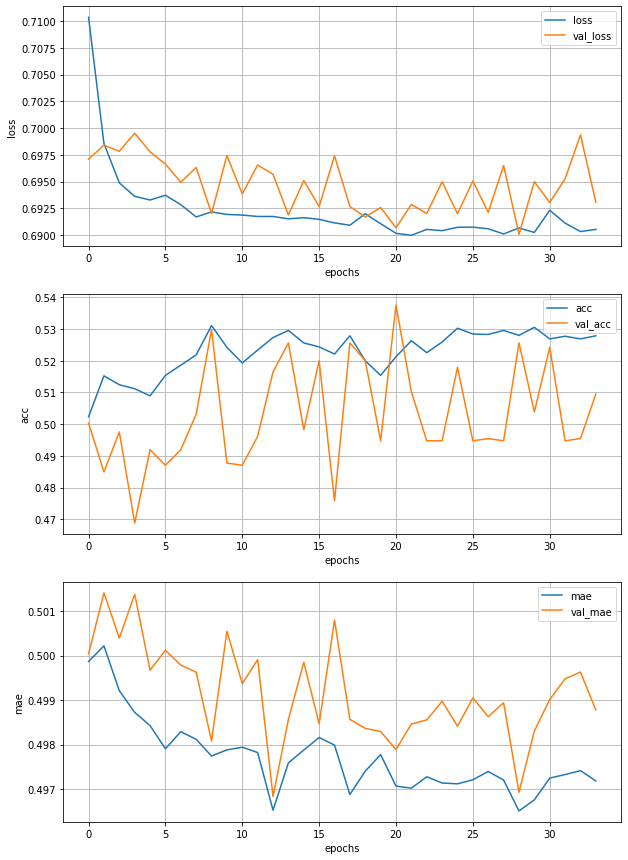

Epoch 35/150
223/223 [==============================] - 37s 164ms/step - loss: 0.6887 - acc: 0.5347 - mae: 0.4963 - val_loss: 0.6916 - val_acc: 0.5214 - val_mae: 0.4987


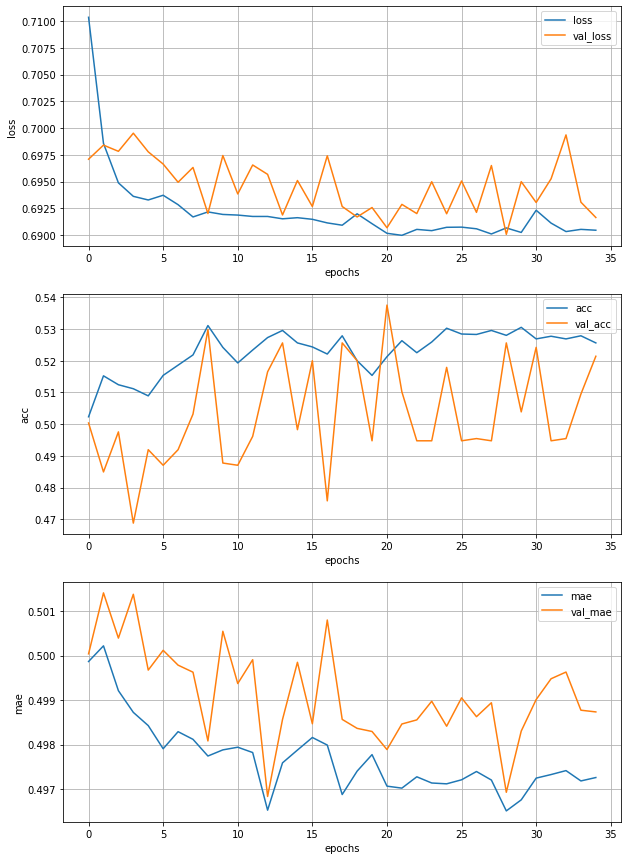

Epoch 36/150
223/223 [==============================] - 37s 166ms/step - loss: 0.6898 - acc: 0.5309 - mae: 0.4971 - val_loss: 0.6915 - val_acc: 0.5256 - val_mae: 0.4981


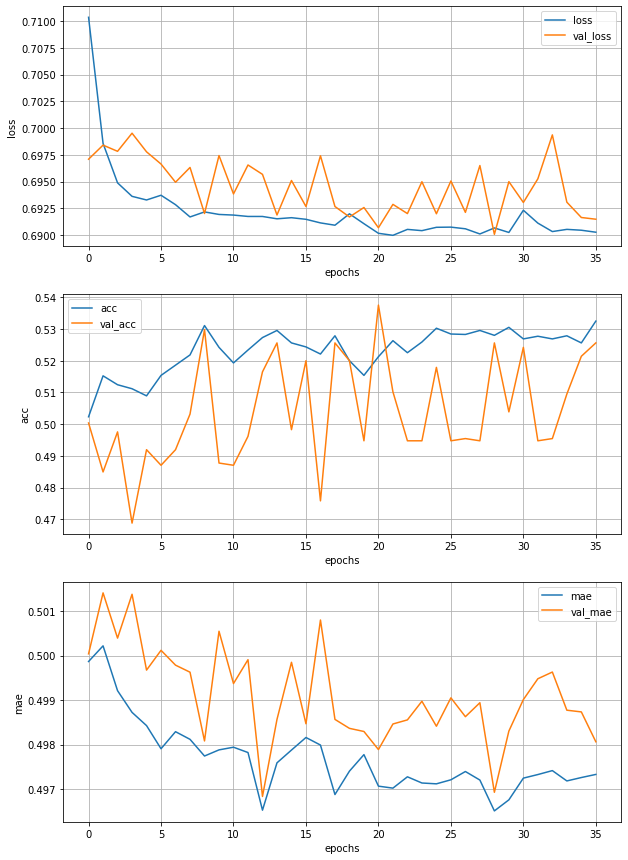

Epoch 37/150
223/223 [==============================] - 37s 167ms/step - loss: 0.6908 - acc: 0.5232 - mae: 0.4971 - val_loss: 0.6923 - val_acc: 0.4989 - val_mae: 0.4980


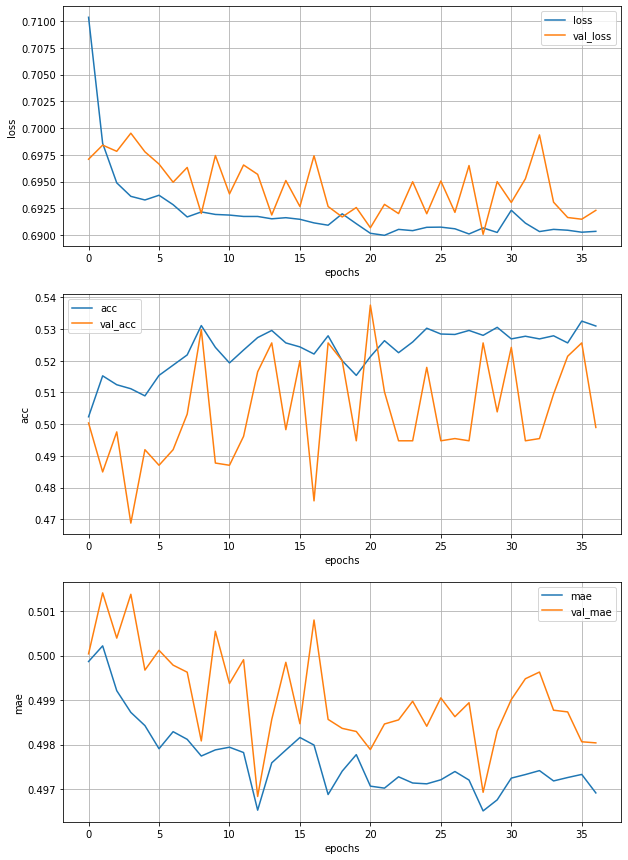

Epoch 38/150
223/223 [==============================] - 37s 167ms/step - loss: 0.6894 - acc: 0.5268 - mae: 0.4966 - val_loss: 0.6918 - val_acc: 0.5200 - val_mae: 0.4981


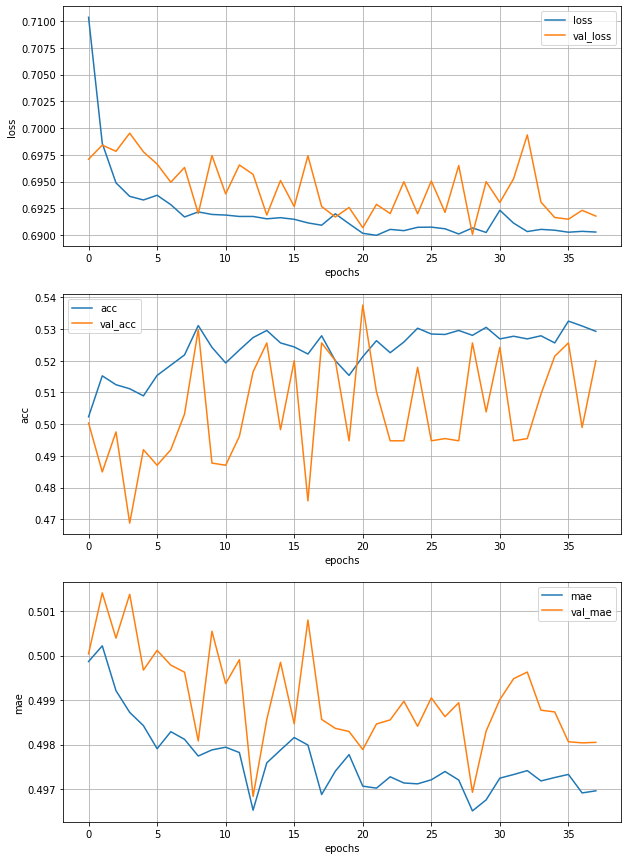

Epoch 39/150
223/223 [==============================] - 38s 172ms/step - loss: 0.6883 - acc: 0.5462 - mae: 0.4961 - val_loss: 0.6916 - val_acc: 0.5046 - val_mae: 0.4978


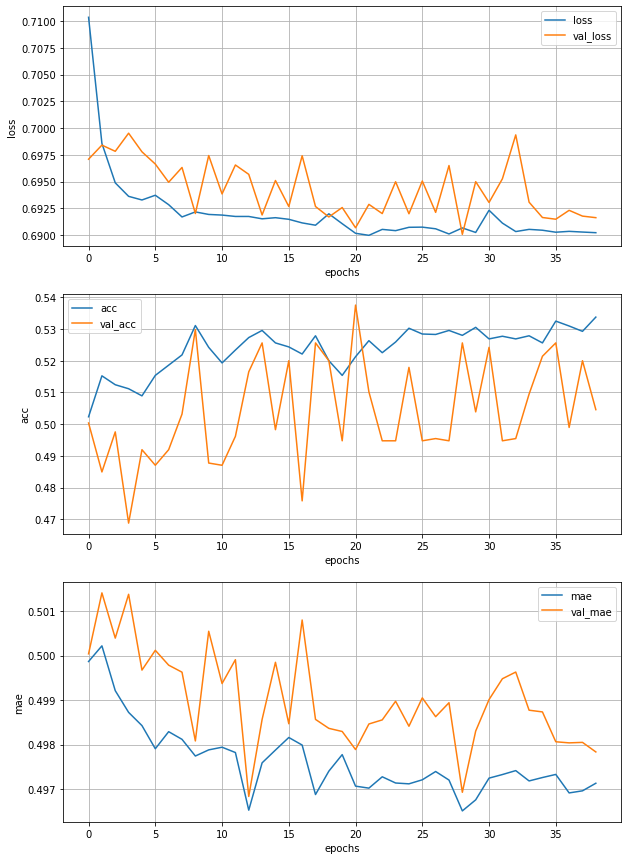

Epoch 40/150
223/223 [==============================] - 38s 170ms/step - loss: 0.6899 - acc: 0.5373 - mae: 0.4969 - val_loss: 0.6917 - val_acc: 0.4996 - val_mae: 0.4979


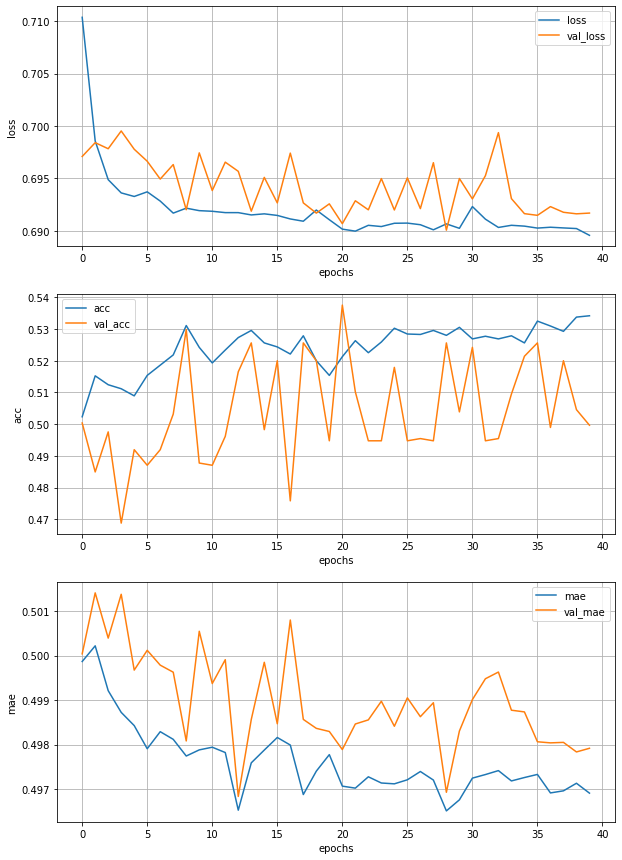

Epoch 41/150
223/223 [==============================] - 38s 169ms/step - loss: 0.6908 - acc: 0.5194 - mae: 0.4975 - val_loss: 0.6913 - val_acc: 0.5032 - val_mae: 0.4980


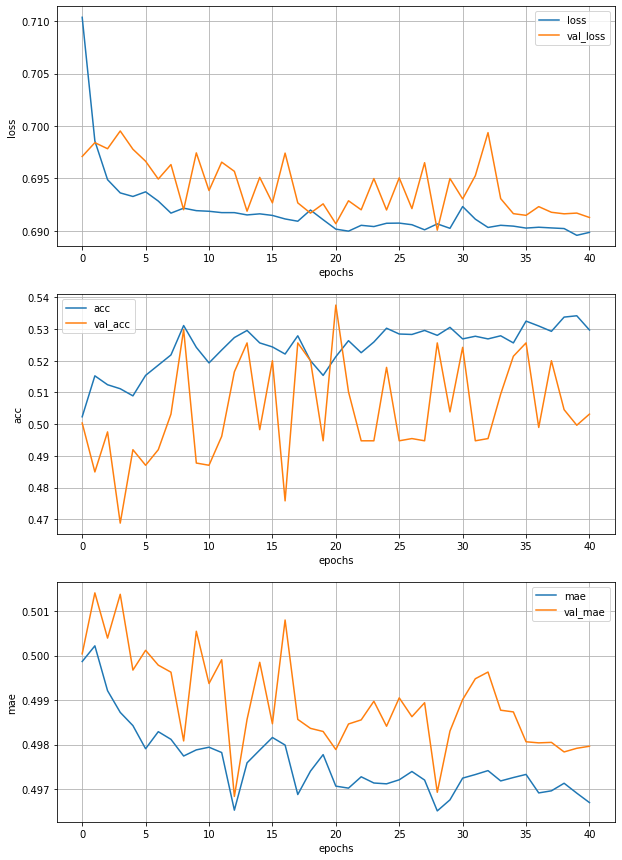

Epoch 42/150
223/223 [==============================] - 37s 168ms/step - loss: 0.6899 - acc: 0.5367 - mae: 0.4971 - val_loss: 0.6913 - val_acc: 0.5221 - val_mae: 0.4977


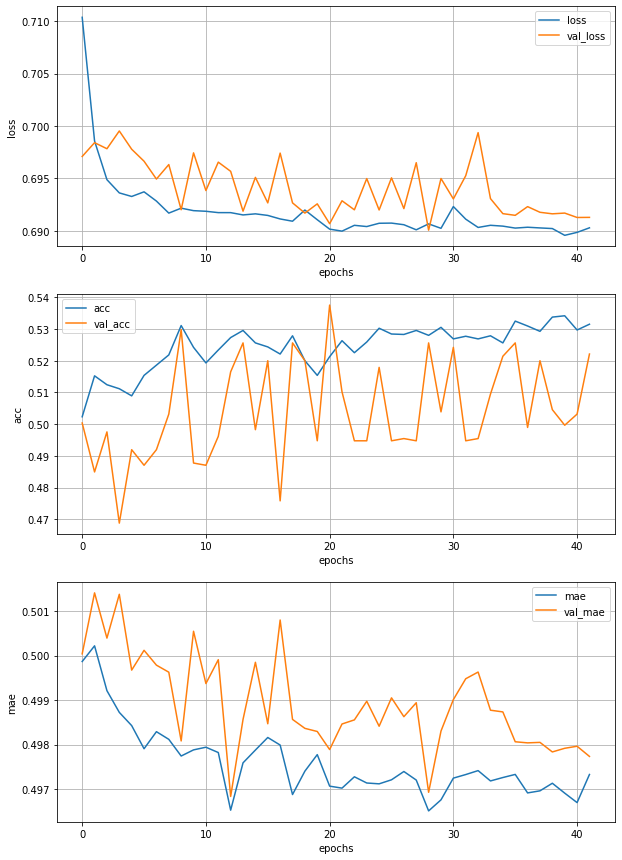

Epoch 43/150
223/223 [==============================] - 38s 169ms/step - loss: 0.6905 - acc: 0.5345 - mae: 0.4965 - val_loss: 0.6925 - val_acc: 0.5144 - val_mae: 0.4996


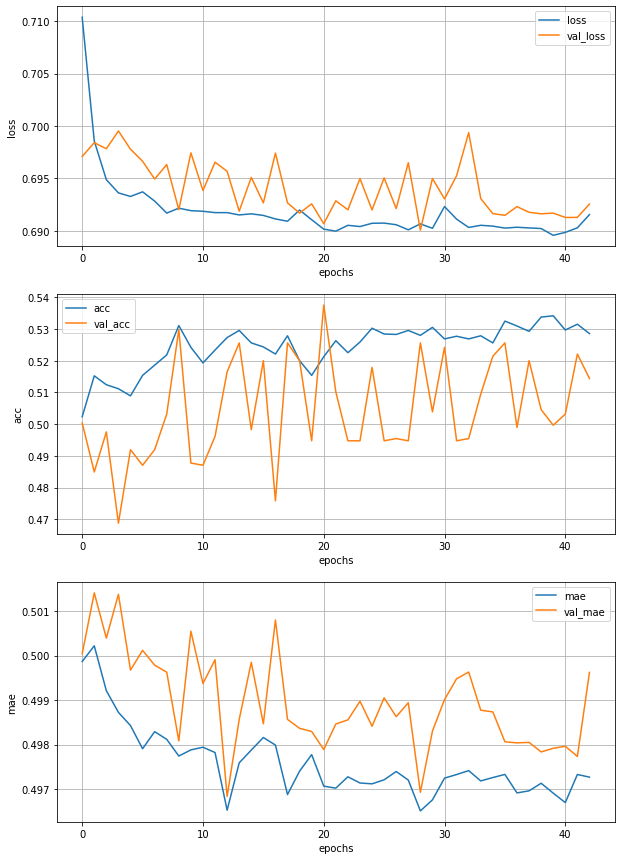

Epoch 44/150
223/223 [==============================] - 39s 173ms/step - loss: 0.6928 - acc: 0.5302 - mae: 0.4989 - val_loss: 0.6933 - val_acc: 0.4954 - val_mae: 0.4998


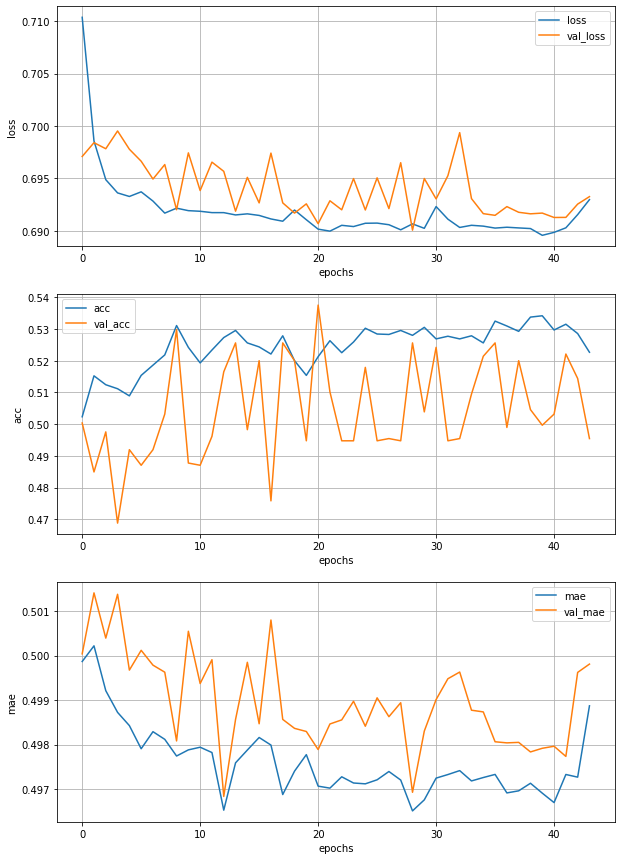

Epoch 45/150
223/223 [==============================] - 38s 171ms/step - loss: 0.6920 - acc: 0.5275 - mae: 0.4987 - val_loss: 0.6961 - val_acc: 0.4954 - val_mae: 0.5000


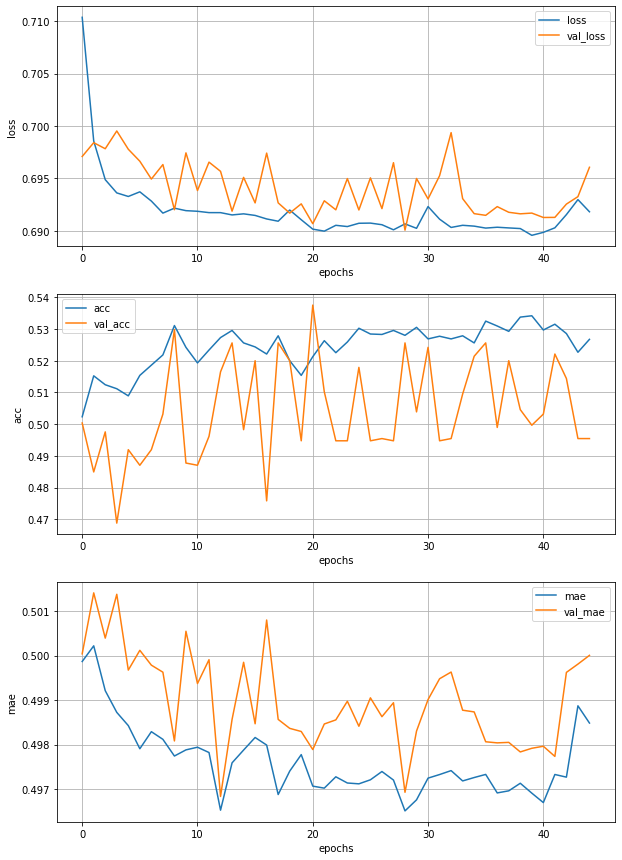

Epoch 46/150
223/223 [==============================] - 38s 171ms/step - loss: 0.6896 - acc: 0.5385 - mae: 0.4968 - val_loss: 0.6938 - val_acc: 0.4947 - val_mae: 0.4998


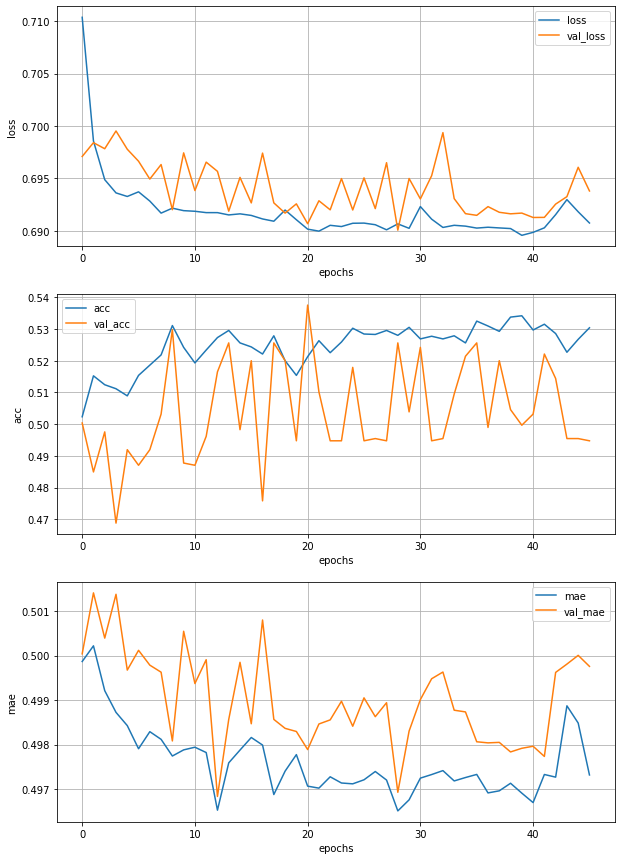

Epoch 47/150
223/223 [==============================] - 39s 176ms/step - loss: 0.6910 - acc: 0.5308 - mae: 0.4982 - val_loss: 0.6934 - val_acc: 0.4989 - val_mae: 0.4995


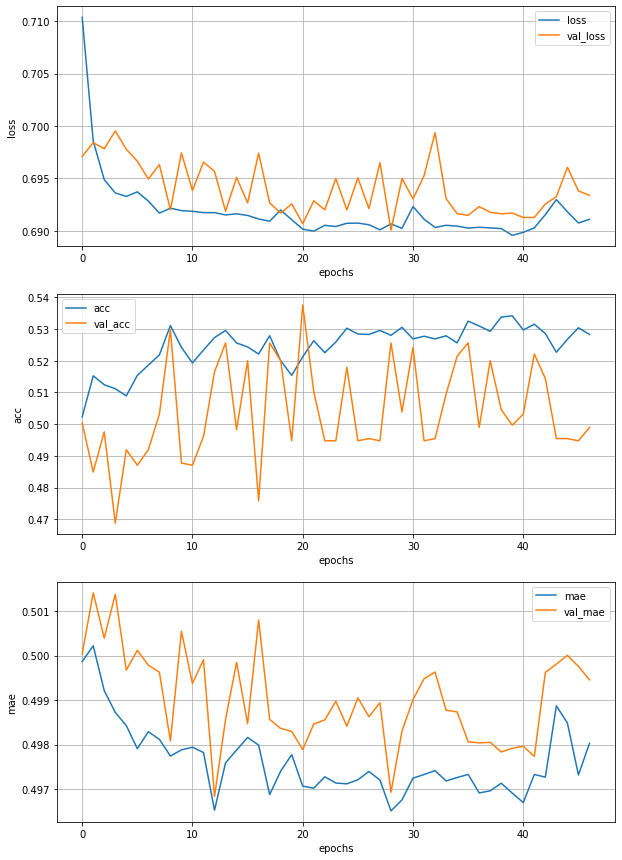

Epoch 48/150
223/223 [==============================] - 39s 174ms/step - loss: 0.6907 - acc: 0.5348 - mae: 0.4978 - val_loss: 0.6940 - val_acc: 0.4989 - val_mae: 0.4995


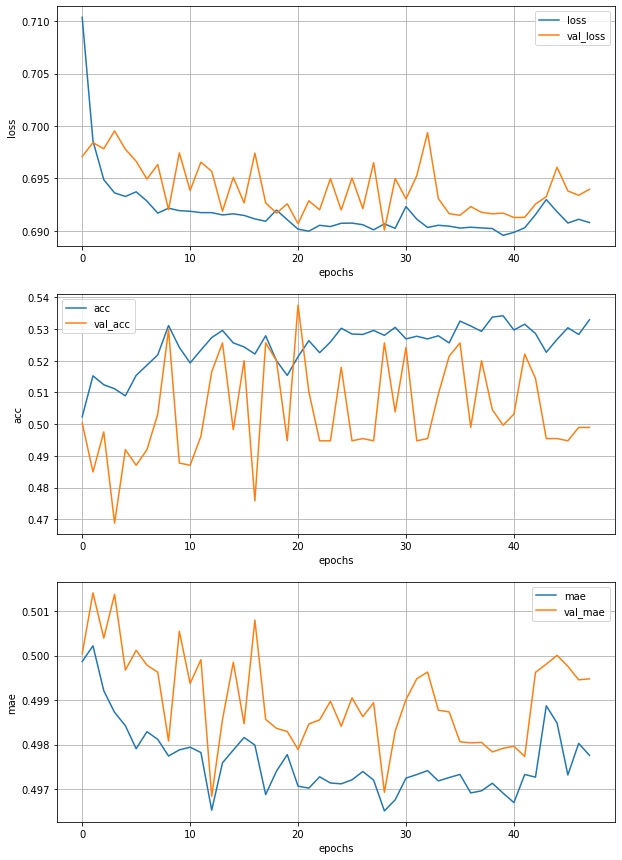

Epoch 49/150
223/223 [==============================] - 40s 179ms/step - loss: 0.6919 - acc: 0.5194 - mae: 0.4984 - val_loss: 0.6942 - val_acc: 0.4975 - val_mae: 0.4996


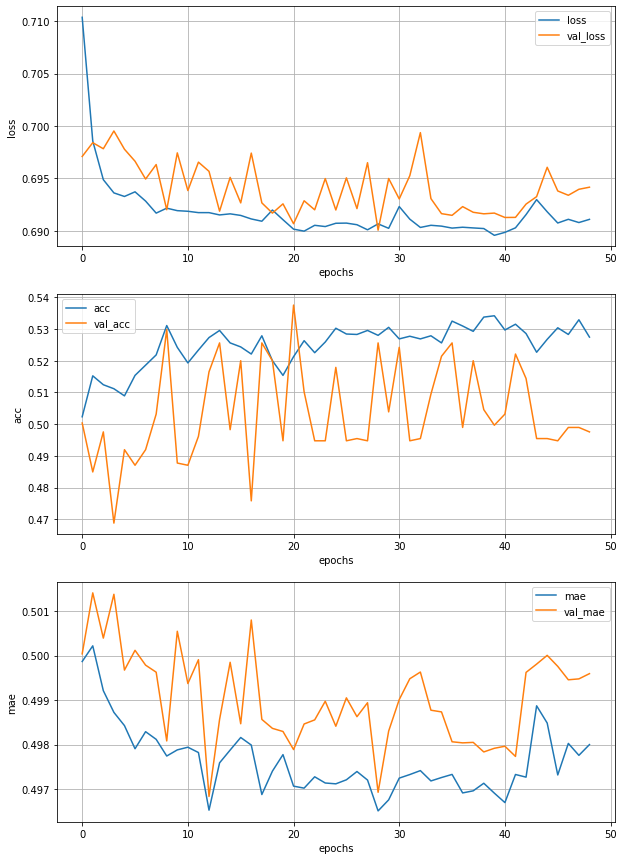

Epoch 50/150
223/223 [==============================] - 40s 178ms/step - loss: 0.6907 - acc: 0.5199 - mae: 0.4978 - val_loss: 0.6943 - val_acc: 0.4975 - val_mae: 0.4994


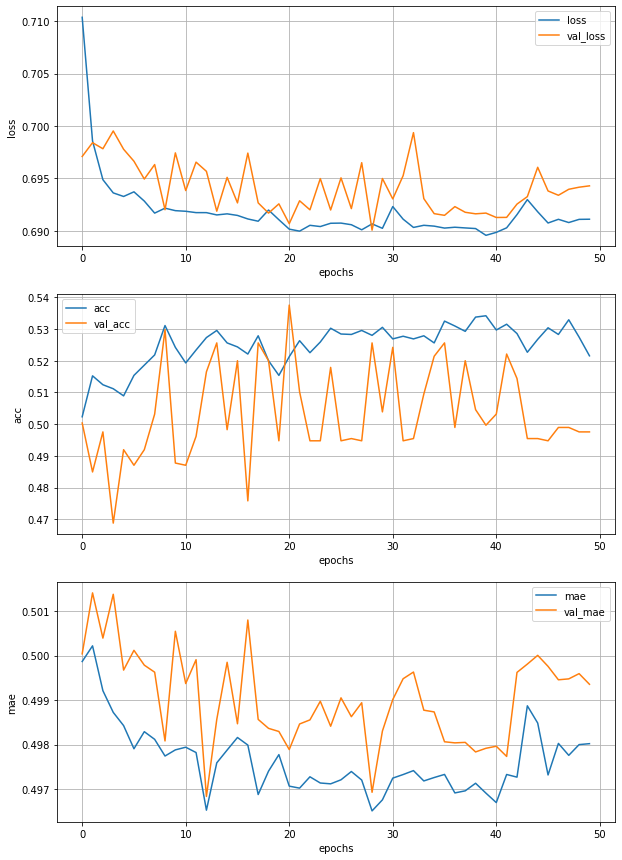

Epoch 51/150
223/223 [==============================] - 40s 179ms/step - loss: 0.6901 - acc: 0.5384 - mae: 0.4970 - val_loss: 0.6947 - val_acc: 0.4940 - val_mae: 0.4997


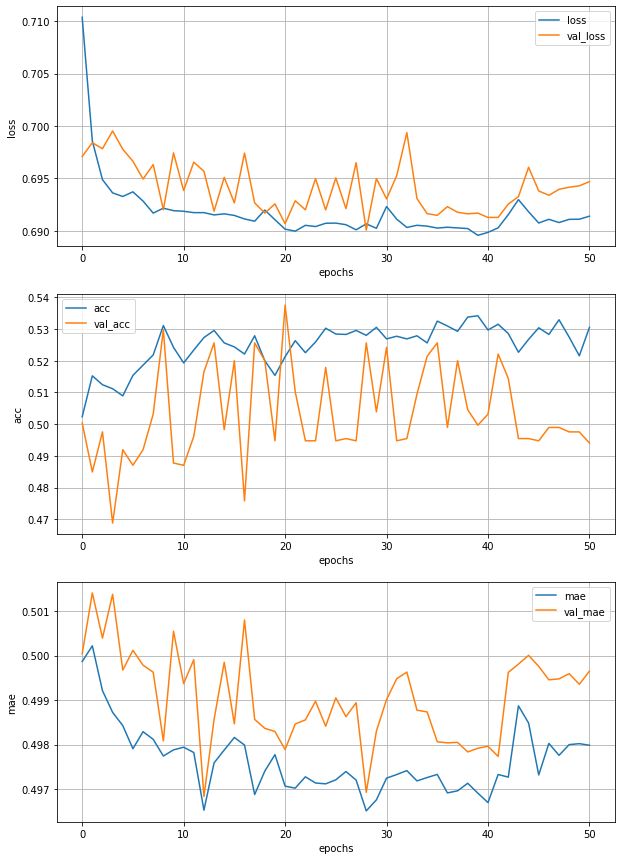

Epoch 52/150
223/223 [==============================] - 41s 183ms/step - loss: 0.6907 - acc: 0.5280 - mae: 0.4976 - val_loss: 0.6943 - val_acc: 0.4968 - val_mae: 0.4993


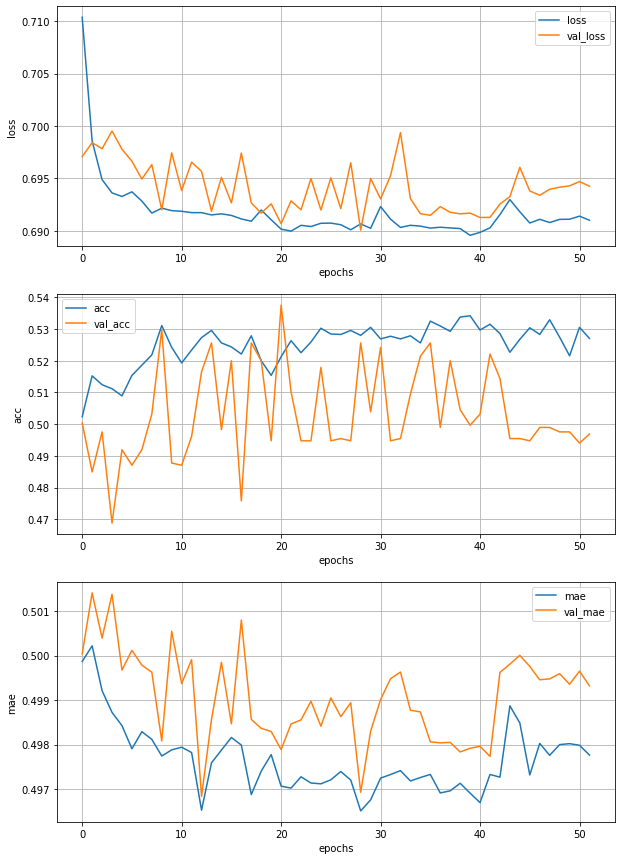

Epoch 53/150
223/223 [==============================] - 40s 178ms/step - loss: 0.6906 - acc: 0.5303 - mae: 0.4977 - val_loss: 0.6949 - val_acc: 0.4954 - val_mae: 0.4996


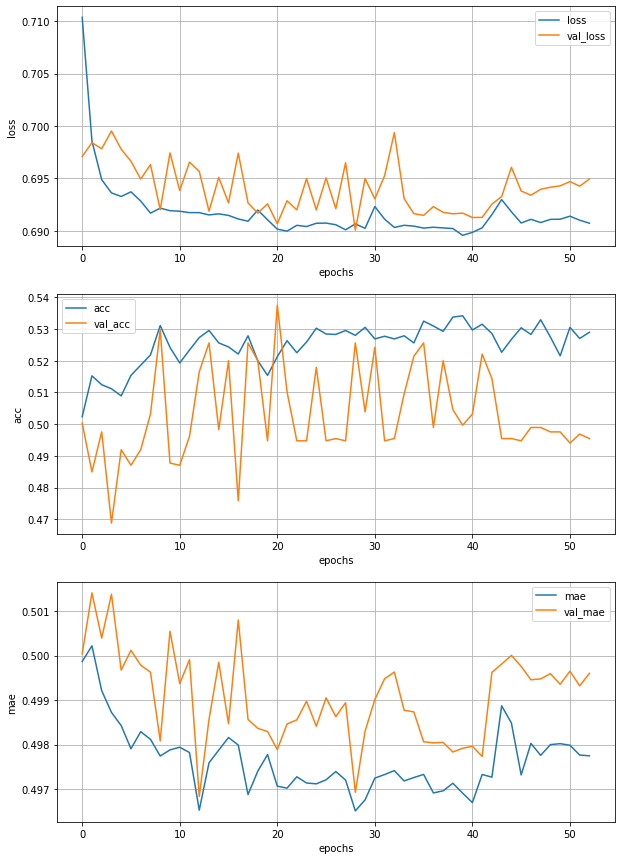

Epoch 54/150
223/223 [==============================] - 41s 185ms/step - loss: 0.6895 - acc: 0.5332 - mae: 0.4969 - val_loss: 0.6927 - val_acc: 0.4975 - val_mae: 0.4991


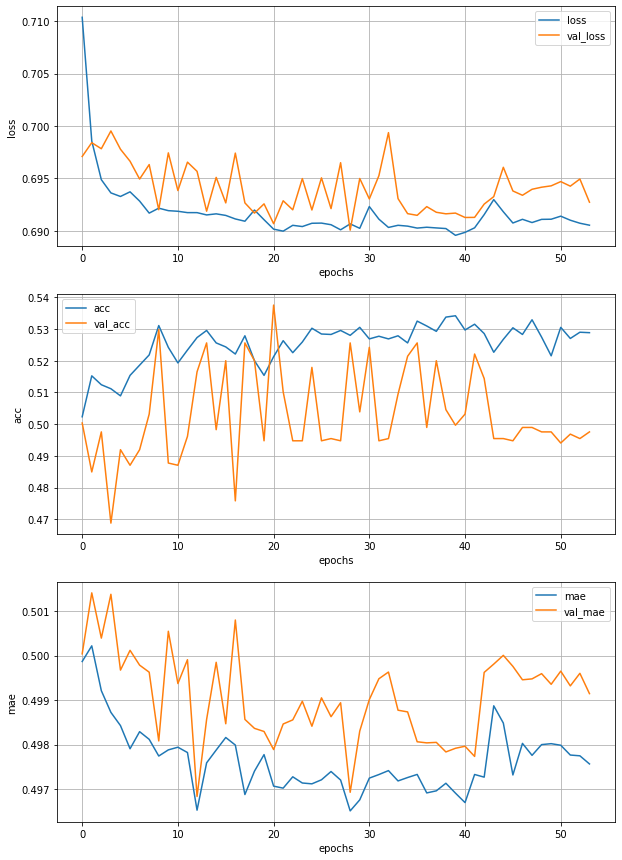

Epoch 55/150
223/223 [==============================] - 40s 181ms/step - loss: 0.6896 - acc: 0.5342 - mae: 0.4967 - val_loss: 0.6924 - val_acc: 0.4961 - val_mae: 0.4991


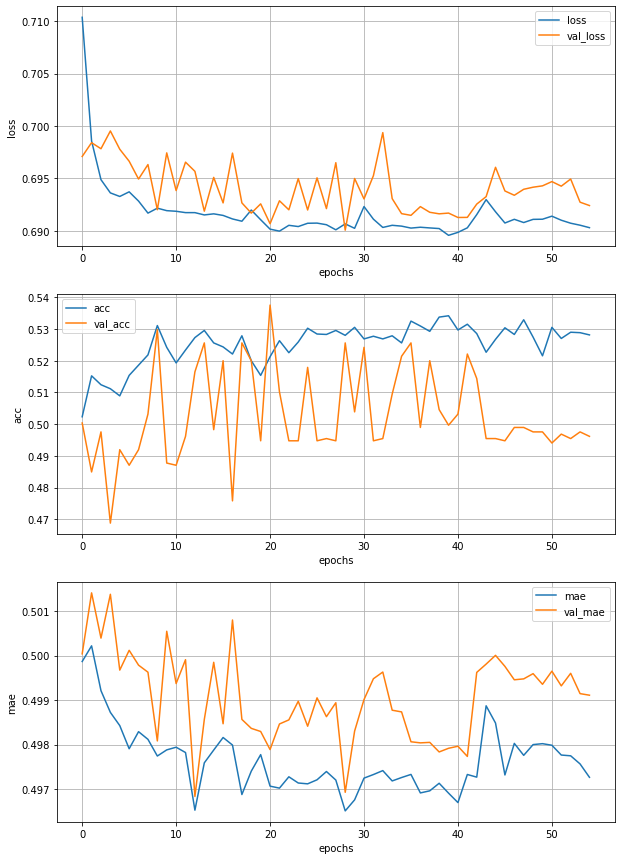

Epoch 56/150
223/223 [==============================] - 41s 182ms/step - loss: 0.6896 - acc: 0.5388 - mae: 0.4974 - val_loss: 0.6928 - val_acc: 0.4961 - val_mae: 0.4991


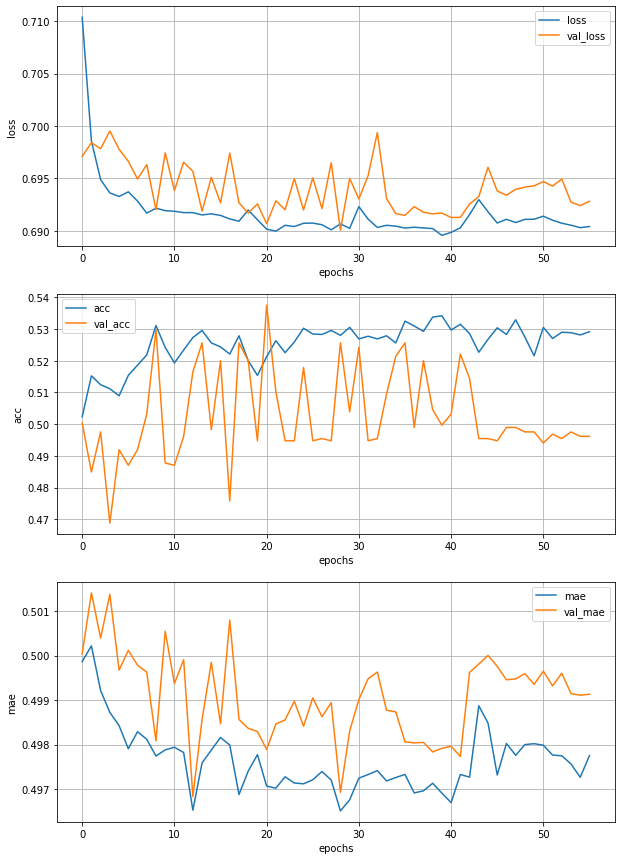

Epoch 57/150
223/223 [==============================] - 41s 185ms/step - loss: 0.6903 - acc: 0.5306 - mae: 0.4977 - val_loss: 0.6934 - val_acc: 0.4968 - val_mae: 0.4994


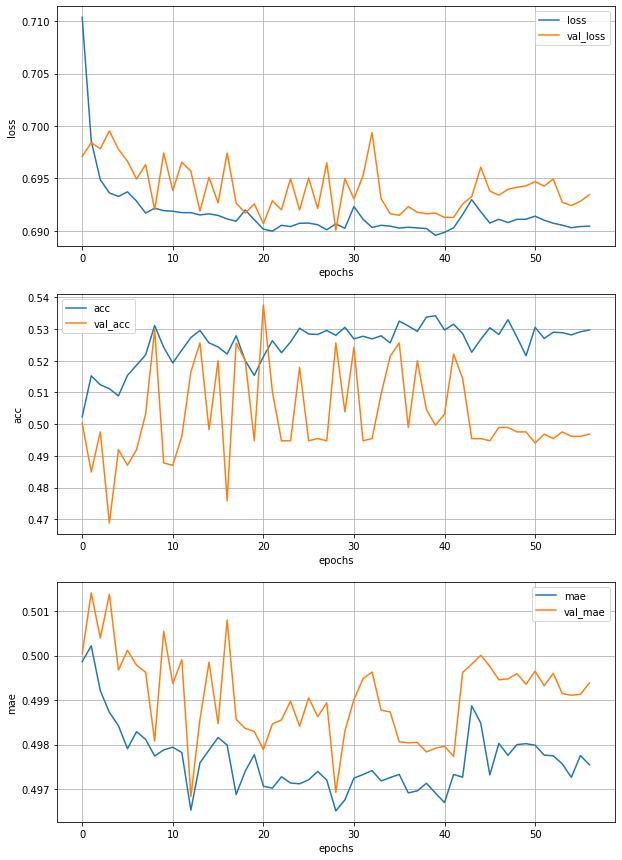

Epoch 58/150
223/223 [==============================] - 42s 187ms/step - loss: 0.6905 - acc: 0.5263 - mae: 0.4976 - val_loss: 0.6952 - val_acc: 0.4947 - val_mae: 0.4996


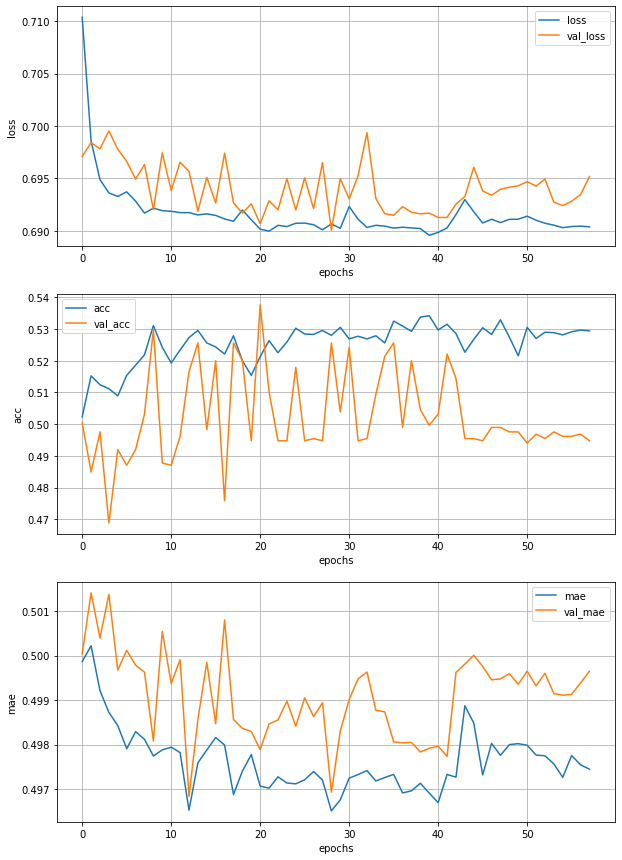

Epoch 59/150
223/223 [==============================] - 41s 182ms/step - loss: 0.6901 - acc: 0.5337 - mae: 0.4968 - val_loss: 0.6921 - val_acc: 0.5130 - val_mae: 0.4984


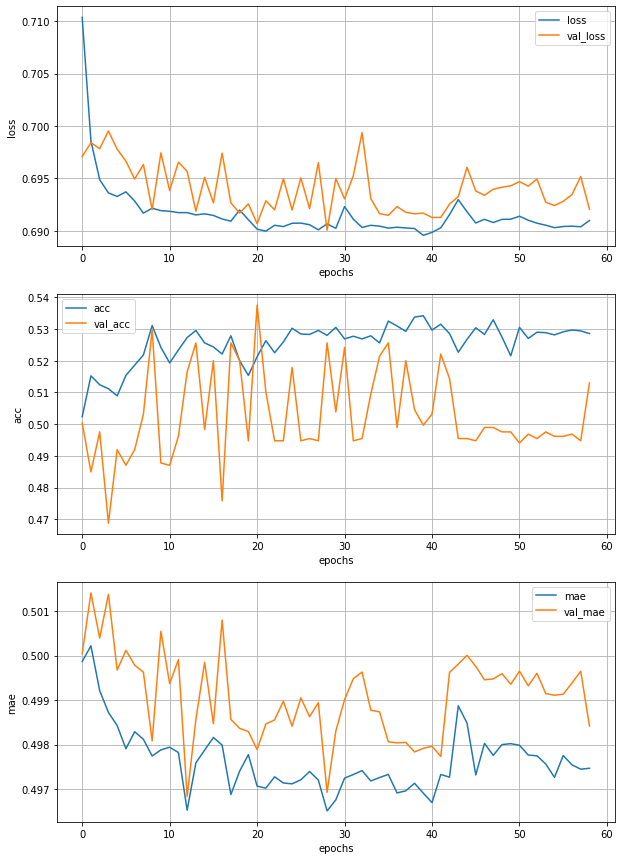

Epoch 60/150
223/223 [==============================] - 41s 186ms/step - loss: 0.6911 - acc: 0.5102 - mae: 0.4982 - val_loss: 0.6936 - val_acc: 0.4989 - val_mae: 0.4986


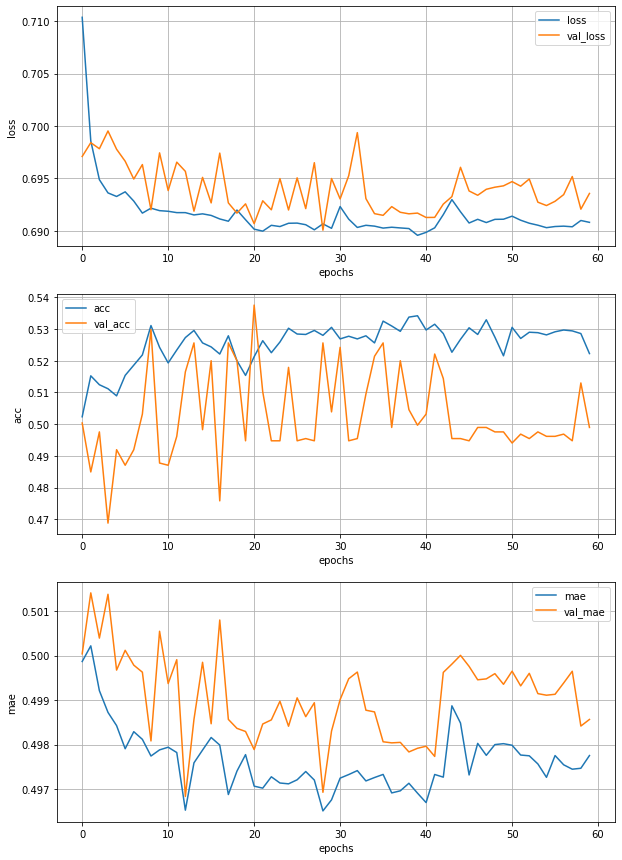

Epoch 61/150
223/223 [==============================] - 42s 187ms/step - loss: 0.6912 - acc: 0.5272 - mae: 0.4973 - val_loss: 0.6947 - val_acc: 0.4989 - val_mae: 0.4996


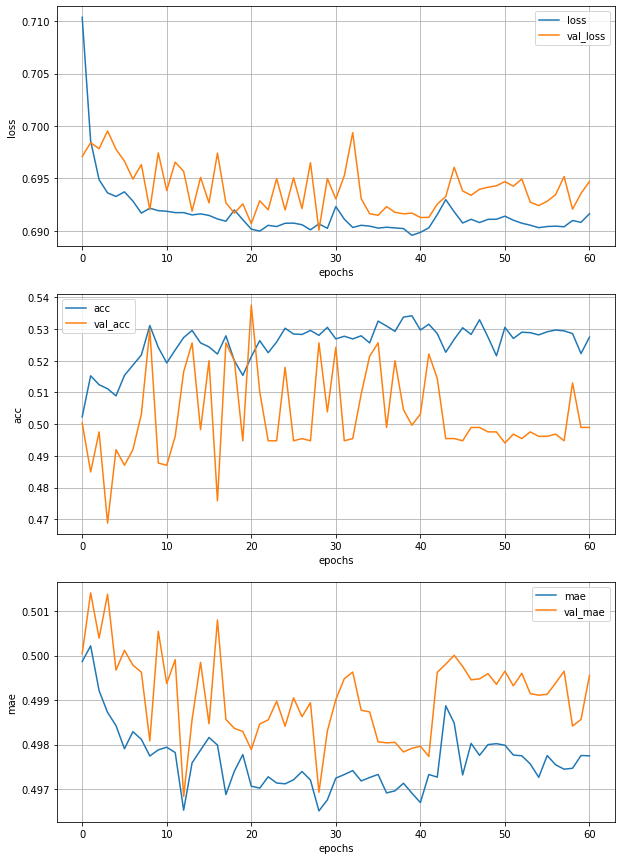

Epoch 62/150
223/223 [==============================] - 42s 187ms/step - loss: 0.6886 - acc: 0.5348 - mae: 0.4964 - val_loss: 0.6926 - val_acc: 0.5116 - val_mae: 0.4993


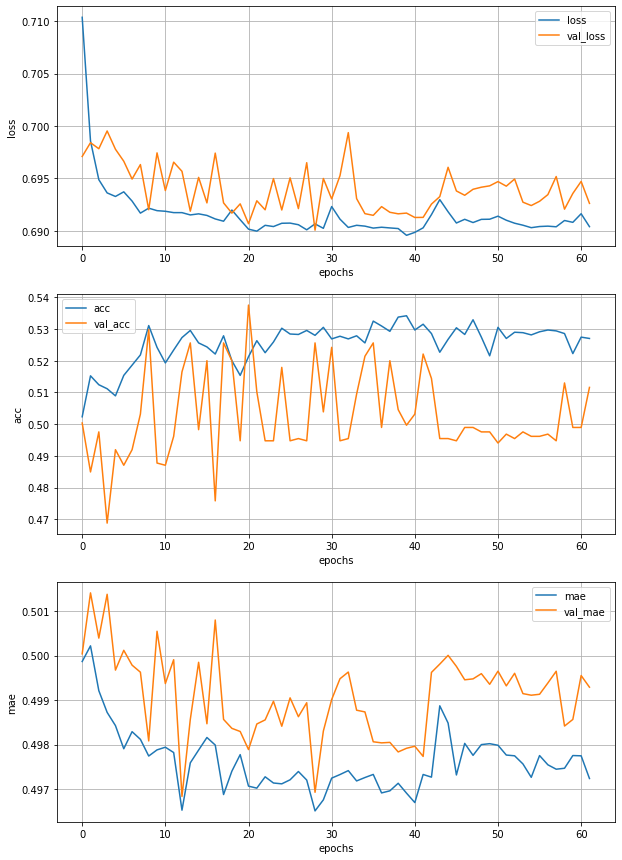

Epoch 63/150
223/223 [==============================] - 41s 185ms/step - loss: 0.6923 - acc: 0.5156 - mae: 0.4984 - val_loss: 0.6941 - val_acc: 0.4926 - val_mae: 0.4998


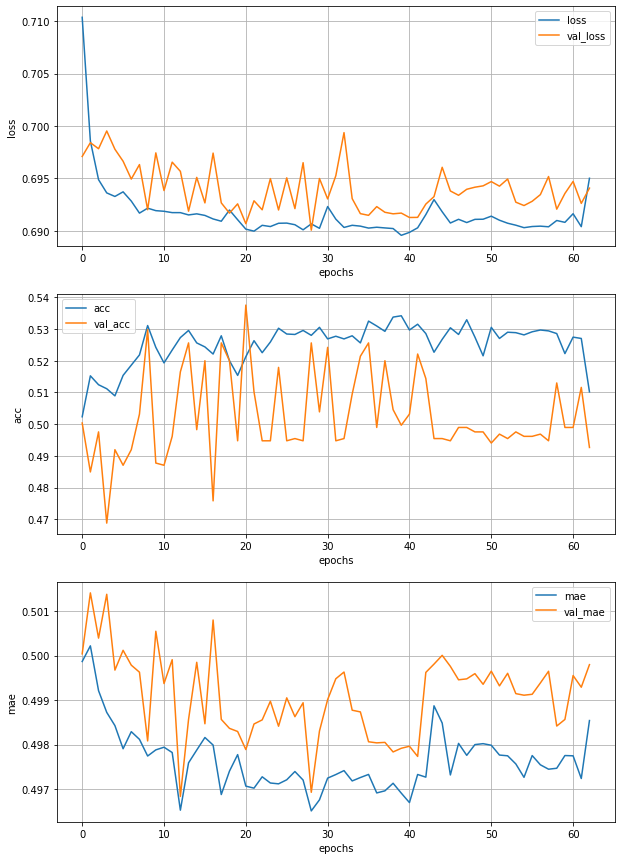

Epoch 64/150
223/223 [==============================] - 42s 189ms/step - loss: 0.6911 - acc: 0.5366 - mae: 0.4972 - val_loss: 0.6901 - val_acc: 0.5488 - val_mae: 0.4977


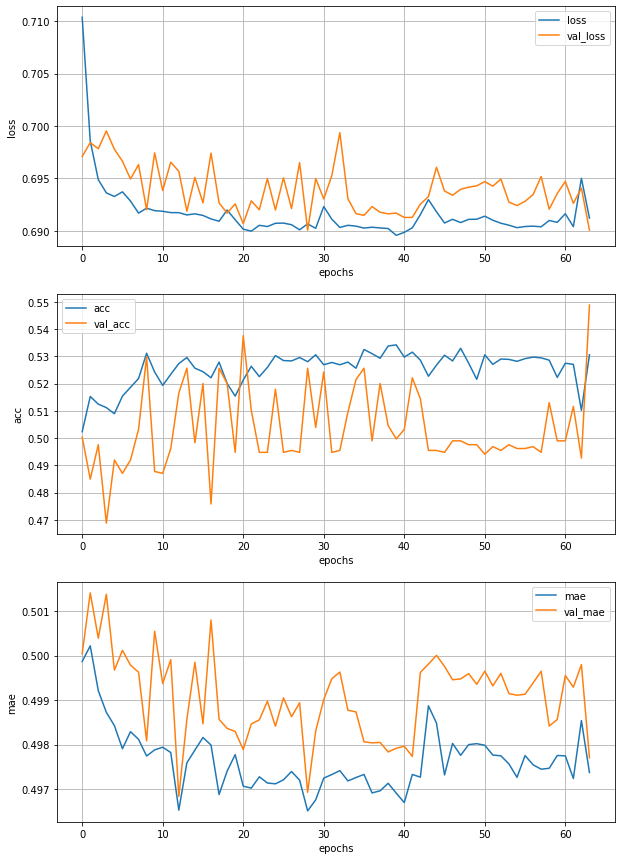

Epoch 65/150
223/223 [==============================] - 42s 187ms/step - loss: 0.6934 - acc: 0.5209 - mae: 0.4986 - val_loss: 0.6927 - val_acc: 0.5263 - val_mae: 0.4984


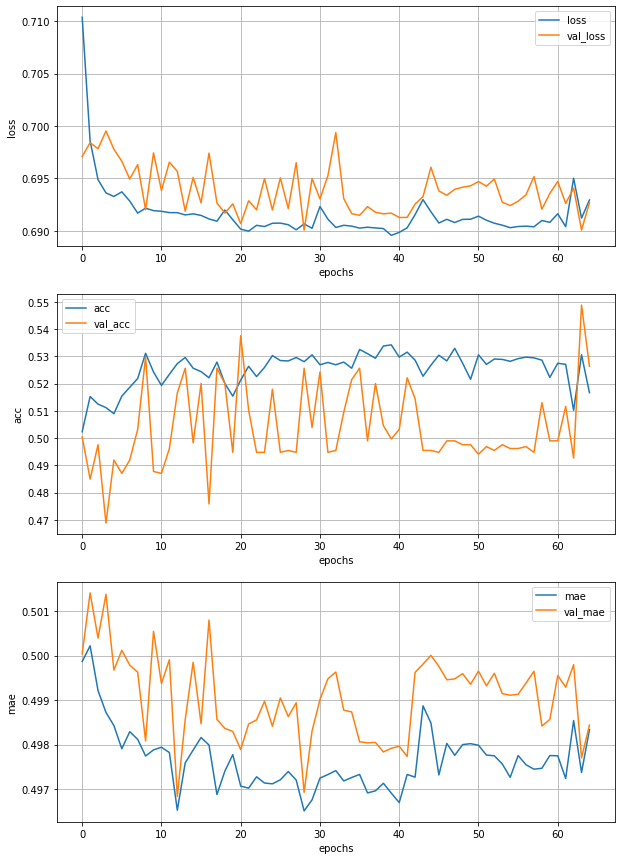

Epoch 66/150
223/223 [==============================] - 42s 190ms/step - loss: 0.6931 - acc: 0.5200 - mae: 0.4985 - val_loss: 0.6930 - val_acc: 0.5228 - val_mae: 0.4987


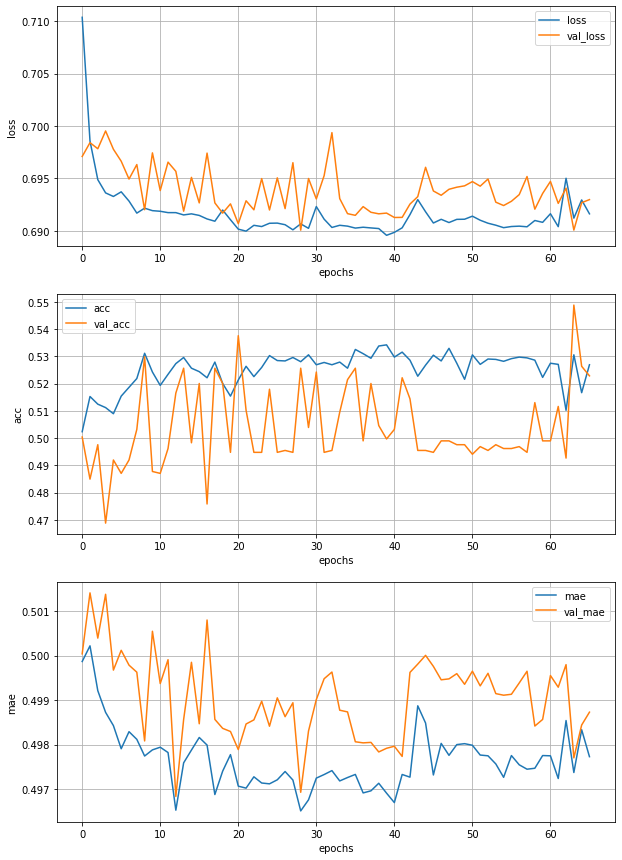

Epoch 67/150
223/223 [==============================] - 43s 192ms/step - loss: 0.6908 - acc: 0.5294 - mae: 0.4975 - val_loss: 0.6945 - val_acc: 0.4940 - val_mae: 0.4990


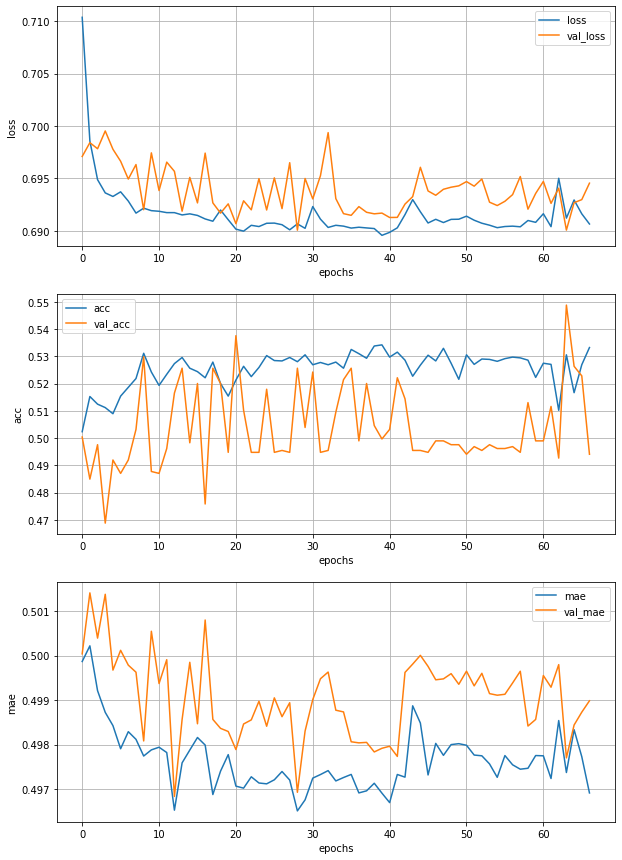

Epoch 68/150
223/223 [==============================] - 42s 190ms/step - loss: 0.6909 - acc: 0.5245 - mae: 0.4973 - val_loss: 0.6932 - val_acc: 0.5046 - val_mae: 0.4996


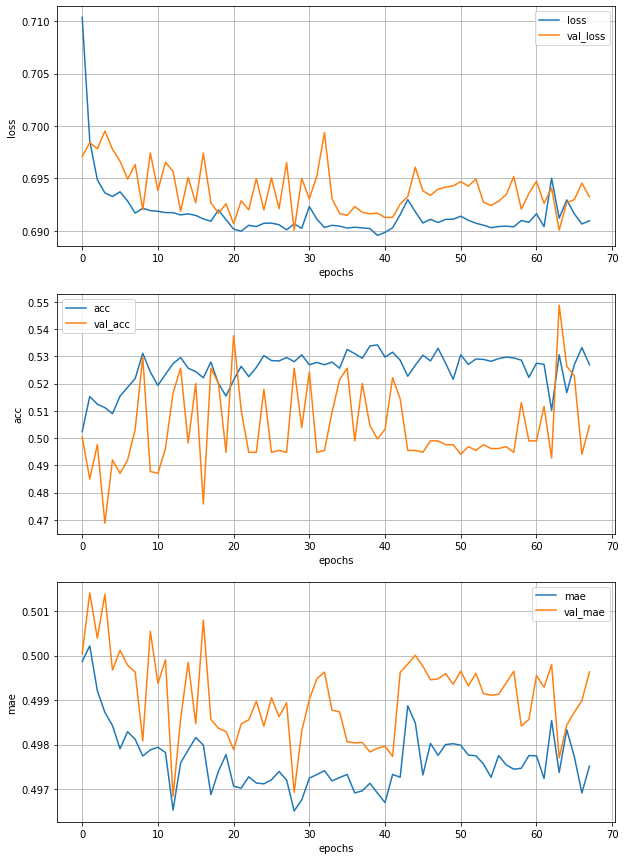

Epoch 69/150
223/223 [==============================] - 43s 192ms/step - loss: 0.6905 - acc: 0.5356 - mae: 0.4979 - val_loss: 0.6939 - val_acc: 0.5046 - val_mae: 0.4989


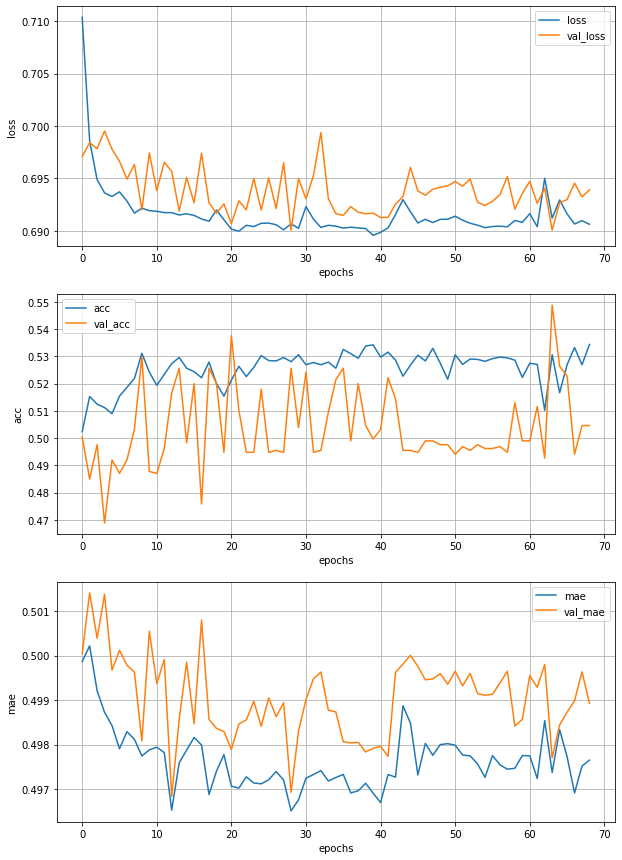

Epoch 70/150
223/223 [==============================] - 43s 195ms/step - loss: 0.6913 - acc: 0.5266 - mae: 0.4979 - val_loss: 0.6921 - val_acc: 0.5116 - val_mae: 0.4988


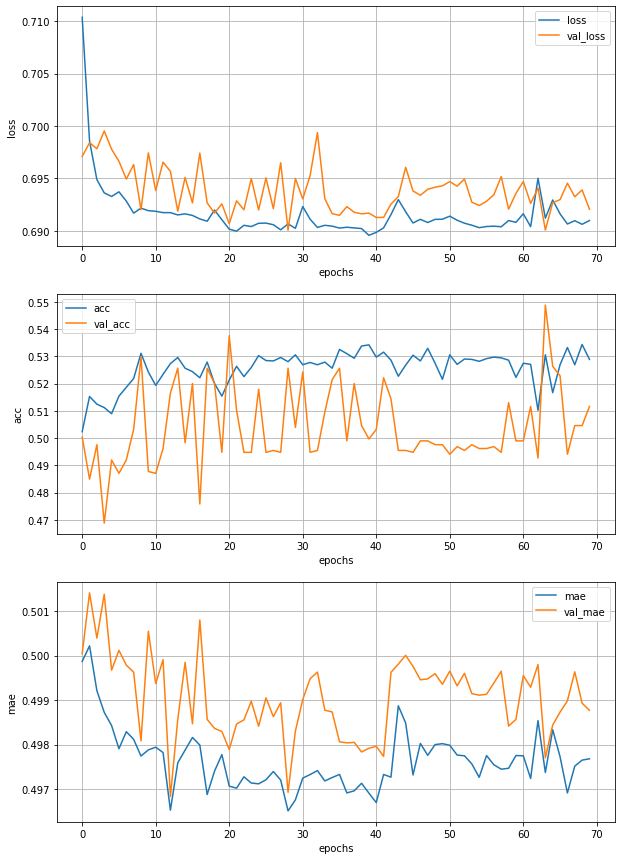

Epoch 71/150
223/223 [==============================] - 43s 193ms/step - loss: 0.6915 - acc: 0.5233 - mae: 0.4979 - val_loss: 0.6942 - val_acc: 0.4919 - val_mae: 0.4998


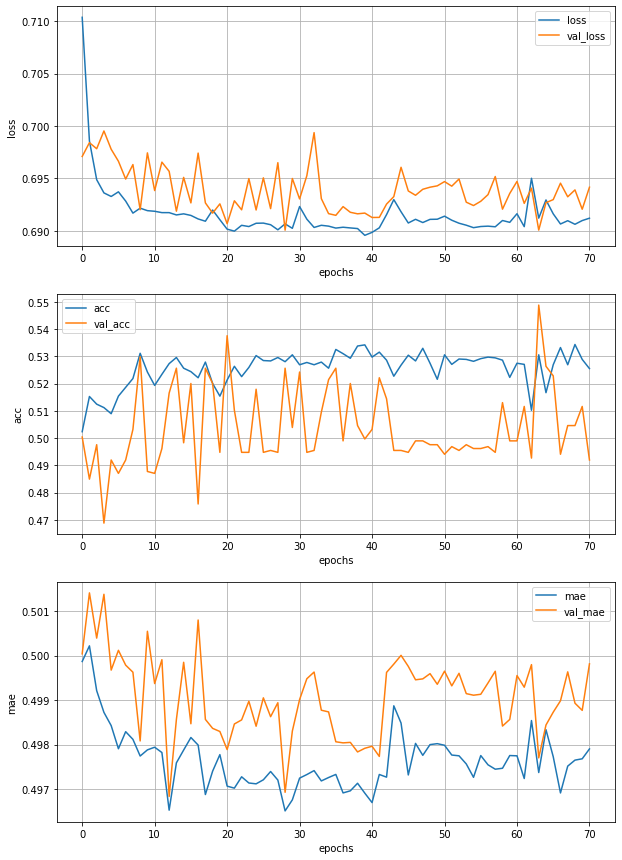

Epoch 72/150
223/223 [==============================] - 43s 194ms/step - loss: 0.6910 - acc: 0.5213 - mae: 0.4982 - val_loss: 0.6935 - val_acc: 0.4947 - val_mae: 0.4995


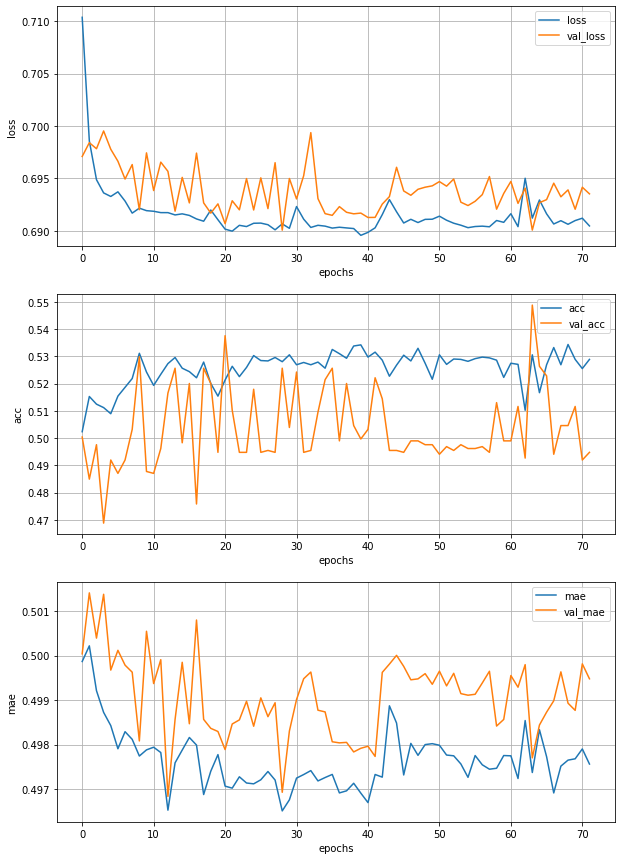

Epoch 73/150
223/223 [==============================] - 43s 194ms/step - loss: 0.6904 - acc: 0.5295 - mae: 0.4977 - val_loss: 0.6961 - val_acc: 0.4940 - val_mae: 0.5000


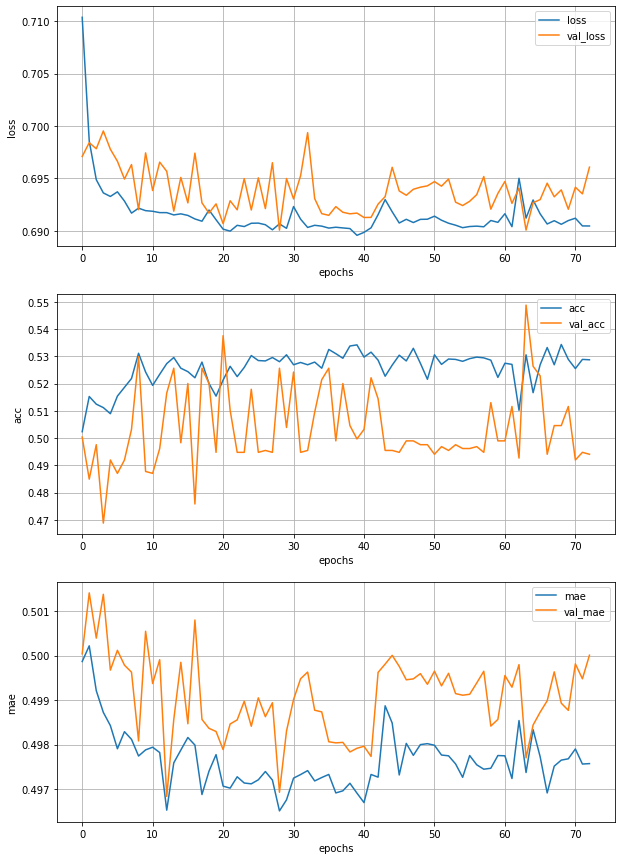

Epoch 74/150
223/223 [==============================] - 44s 197ms/step - loss: 0.6912 - acc: 0.5255 - mae: 0.4980 - val_loss: 0.6941 - val_acc: 0.4968 - val_mae: 0.4996


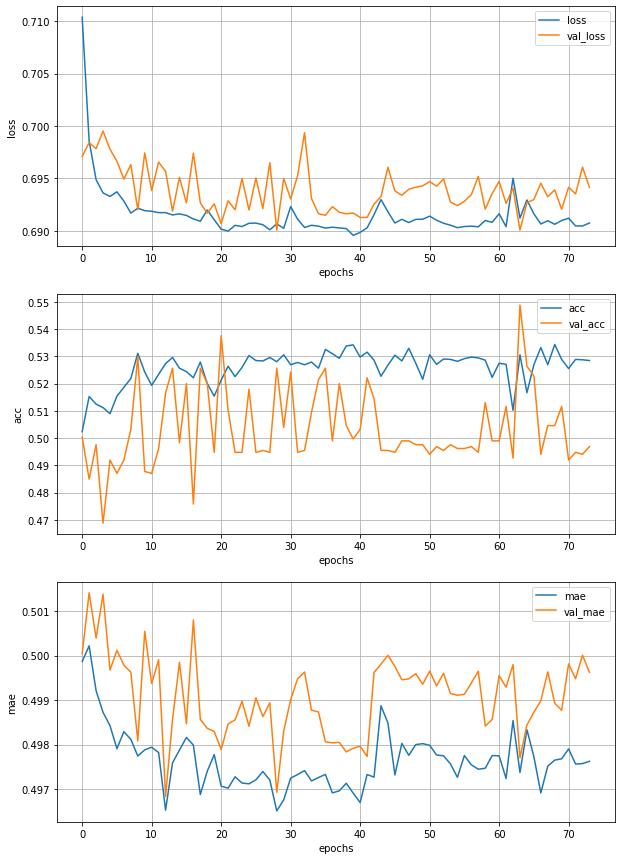

Epoch 75/150
223/223 [==============================] - 44s 198ms/step - loss: 0.6911 - acc: 0.5242 - mae: 0.4974 - val_loss: 0.6960 - val_acc: 0.5011 - val_mae: 0.4985


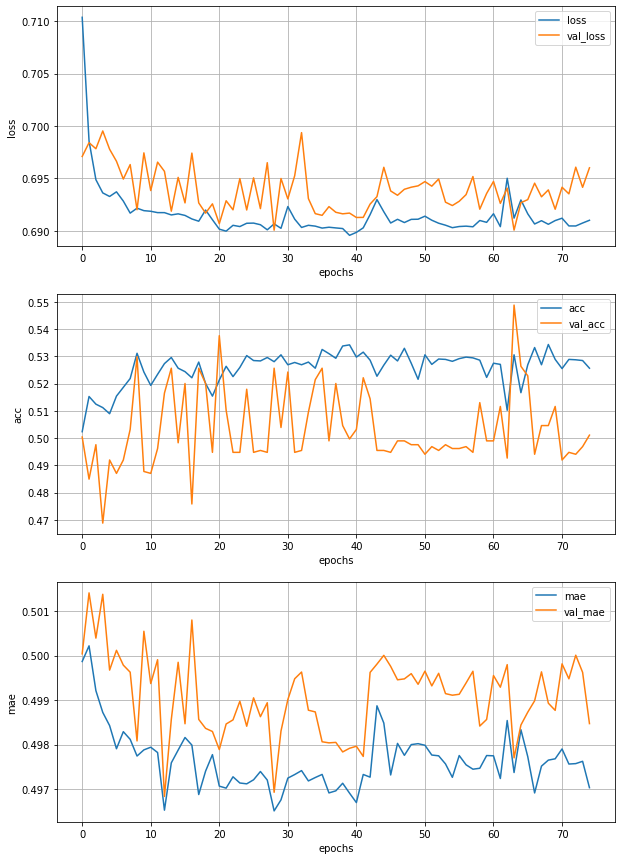

Epoch 76/150
223/223 [==============================] - 44s 198ms/step - loss: 0.6895 - acc: 0.5361 - mae: 0.4957 - val_loss: 0.6930 - val_acc: 0.4933 - val_mae: 0.4976


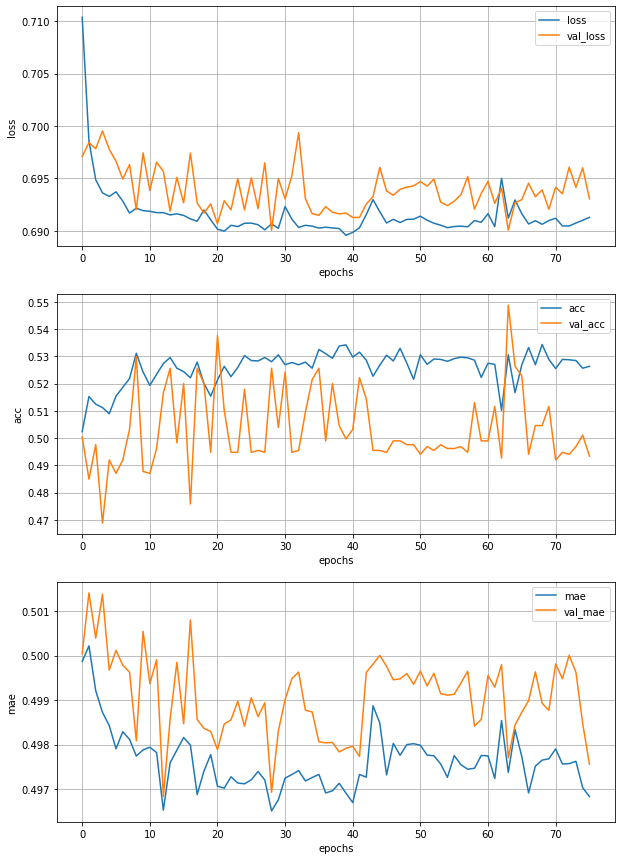

Epoch 77/150
223/223 [==============================] - 45s 201ms/step - loss: 0.6900 - acc: 0.5257 - mae: 0.4962 - val_loss: 0.6933 - val_acc: 0.5277 - val_mae: 0.4981


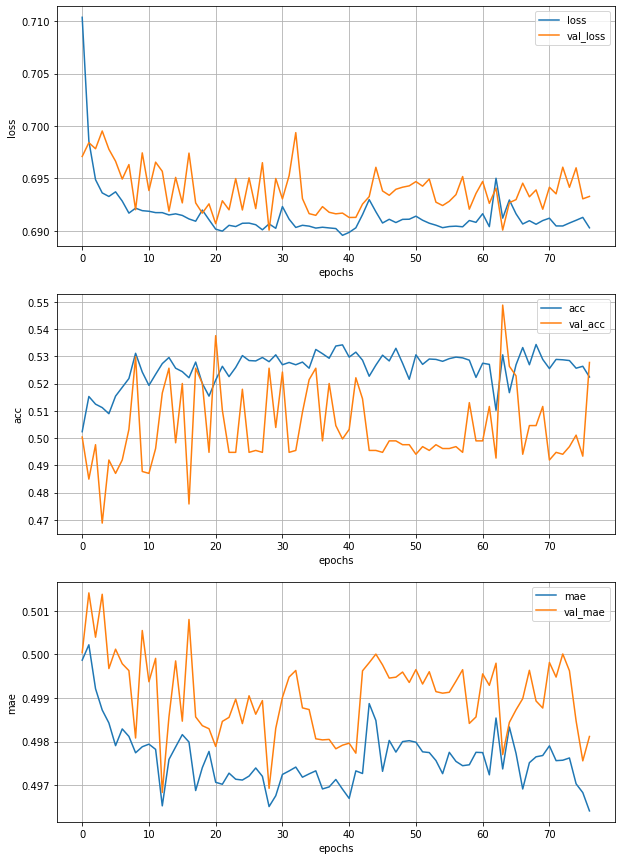

Epoch 78/150
223/223 [==============================] - 44s 199ms/step - loss: 0.6910 - acc: 0.5277 - mae: 0.4971 - val_loss: 0.6920 - val_acc: 0.5277 - val_mae: 0.4977


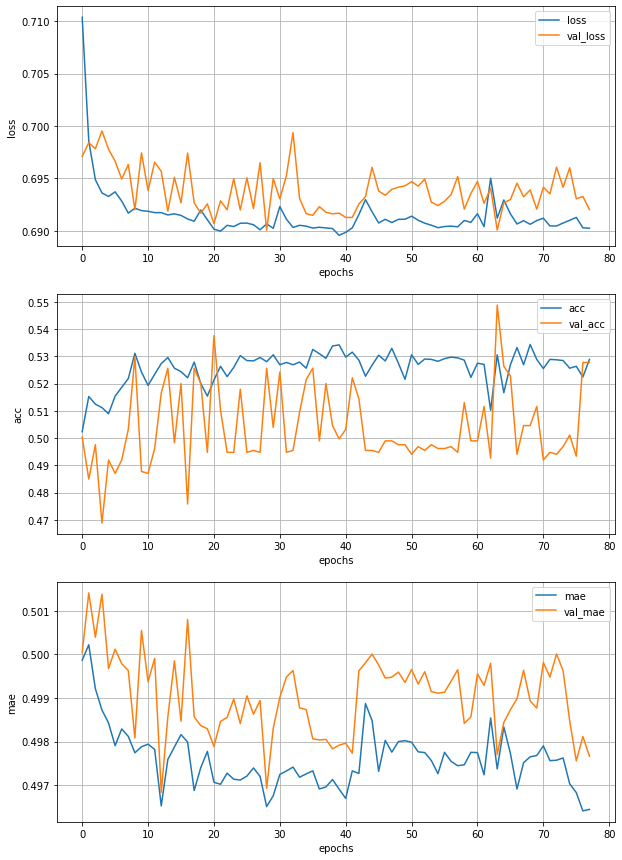

Epoch 79/150
223/223 [==============================] - 45s 200ms/step - loss: 0.6881 - acc: 0.5293 - mae: 0.4956 - val_loss: 0.6910 - val_acc: 0.5340 - val_mae: 0.4978


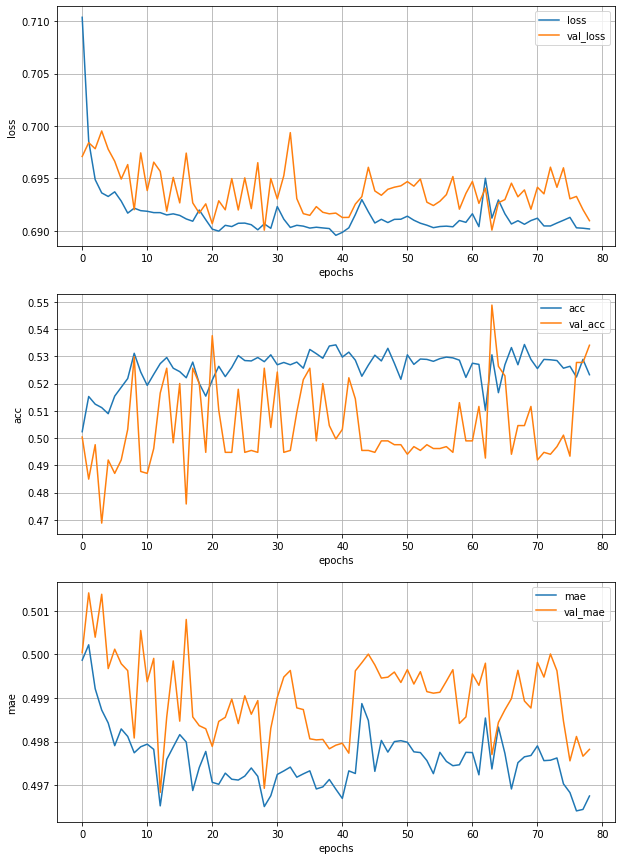

Epoch 80/150
223/223 [==============================] - 45s 202ms/step - loss: 0.6905 - acc: 0.5322 - mae: 0.4972 - val_loss: 0.6989 - val_acc: 0.4968 - val_mae: 0.4984


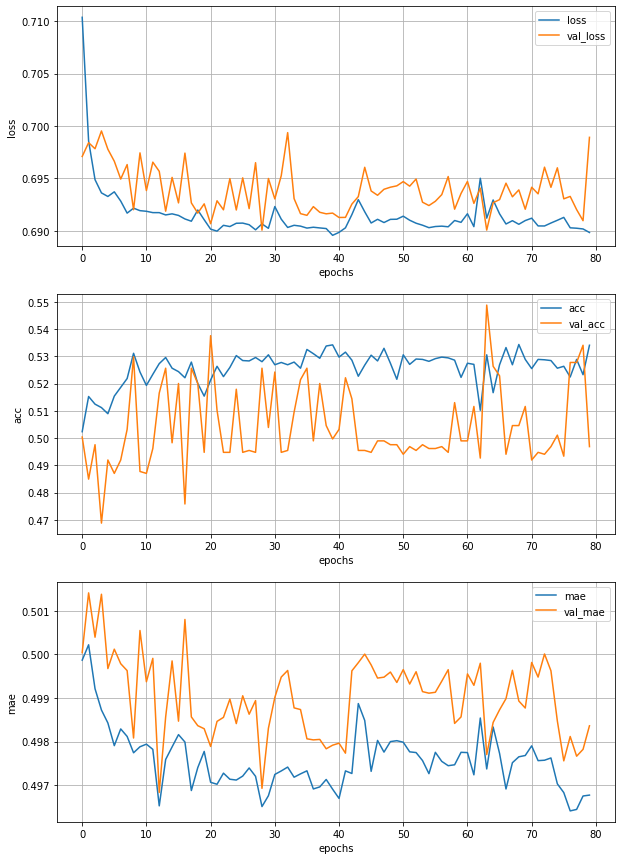

Epoch 81/150
223/223 [==============================] - 46s 206ms/step - loss: 0.6924 - acc: 0.5283 - mae: 0.4967 - val_loss: 0.6908 - val_acc: 0.5319 - val_mae: 0.4980


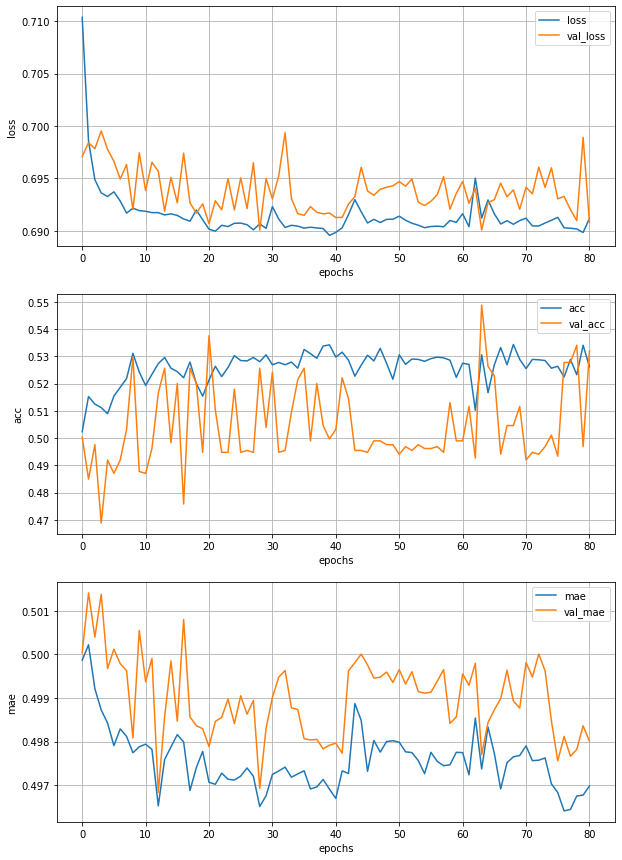

Epoch 82/150
223/223 [==============================] - 46s 208ms/step - loss: 0.6900 - acc: 0.5321 - mae: 0.4972 - val_loss: 0.6931 - val_acc: 0.4975 - val_mae: 0.4991


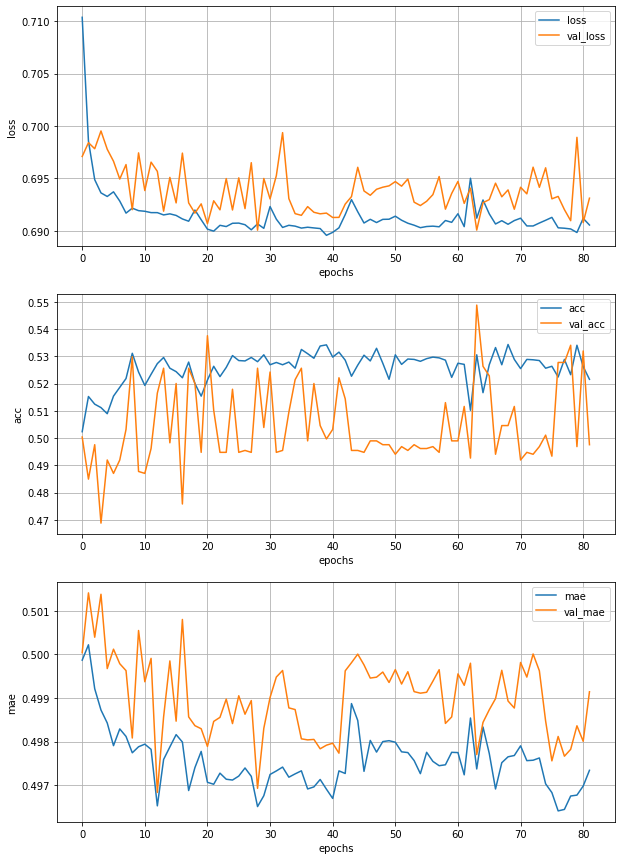

Epoch 83/150
223/223 [==============================] - 47s 210ms/step - loss: 0.6902 - acc: 0.5267 - mae: 0.4974 - val_loss: 0.6956 - val_acc: 0.4933 - val_mae: 0.5002


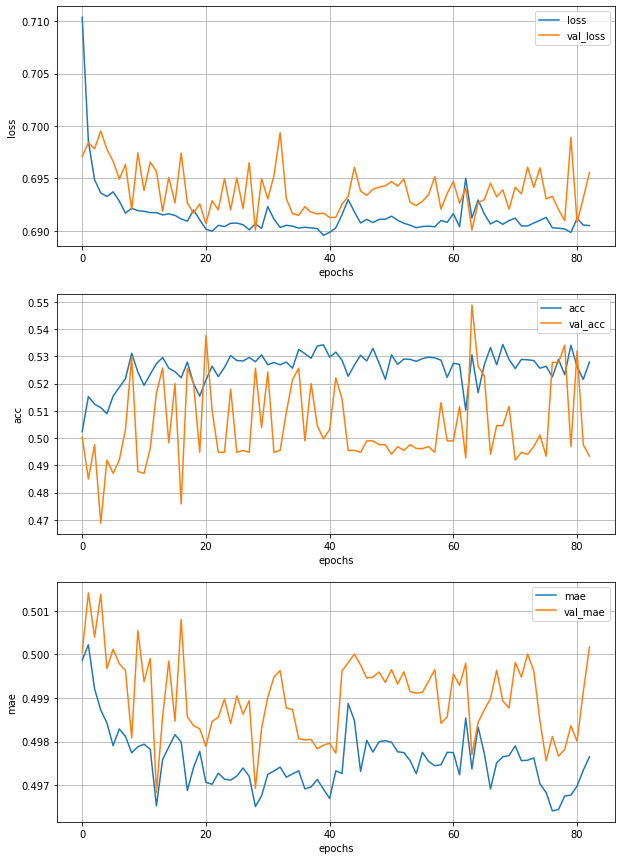

Epoch 84/150
223/223 [==============================] - 45s 204ms/step - loss: 0.6904 - acc: 0.5299 - mae: 0.4975 - val_loss: 0.6944 - val_acc: 0.4933 - val_mae: 0.5001


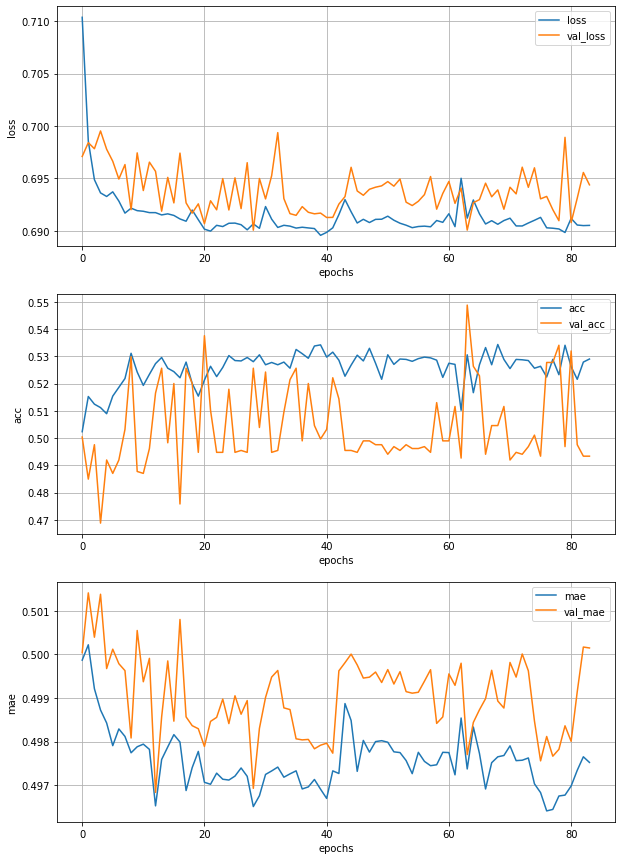

Epoch 85/150
223/223 [==============================] - 46s 208ms/step - loss: 0.6913 - acc: 0.5285 - mae: 0.4983 - val_loss: 0.6943 - val_acc: 0.4940 - val_mae: 0.4999


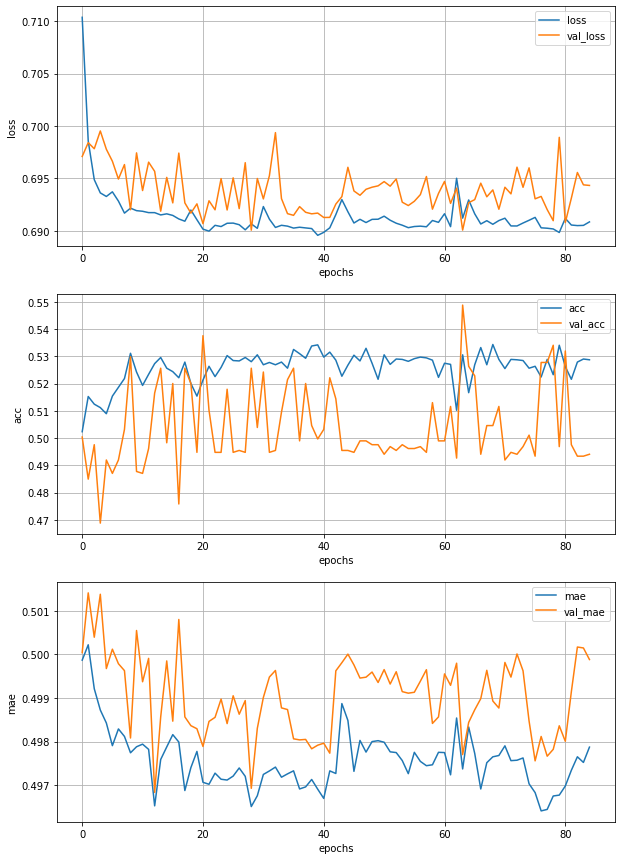

Epoch 86/150
223/223 [==============================] - 48s 214ms/step - loss: 0.6910 - acc: 0.5245 - mae: 0.4981 - val_loss: 0.6954 - val_acc: 0.4940 - val_mae: 0.5000


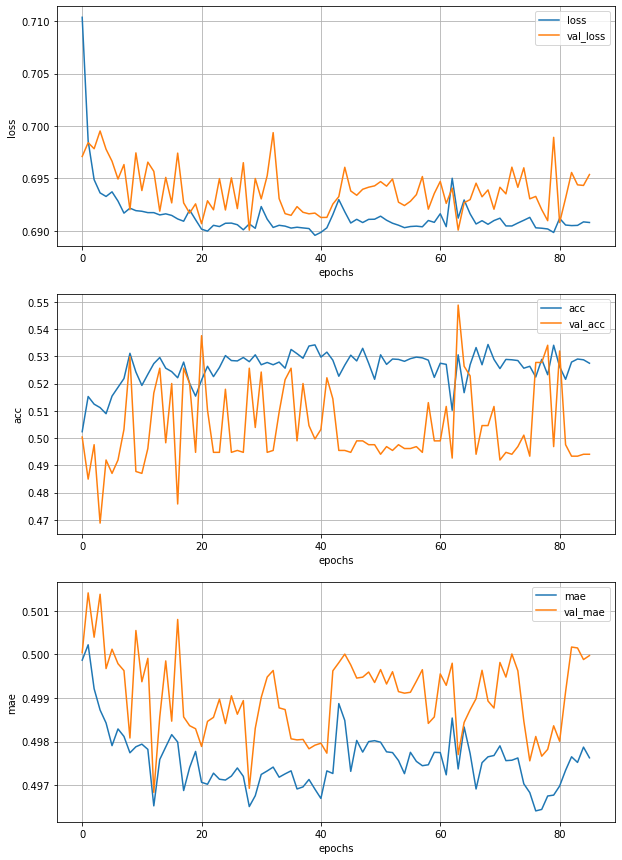

Epoch 87/150
223/223 [==============================] - 48s 214ms/step - loss: 0.6912 - acc: 0.5076 - mae: 0.4983 - val_loss: 0.6977 - val_acc: 0.4940 - val_mae: 0.5004


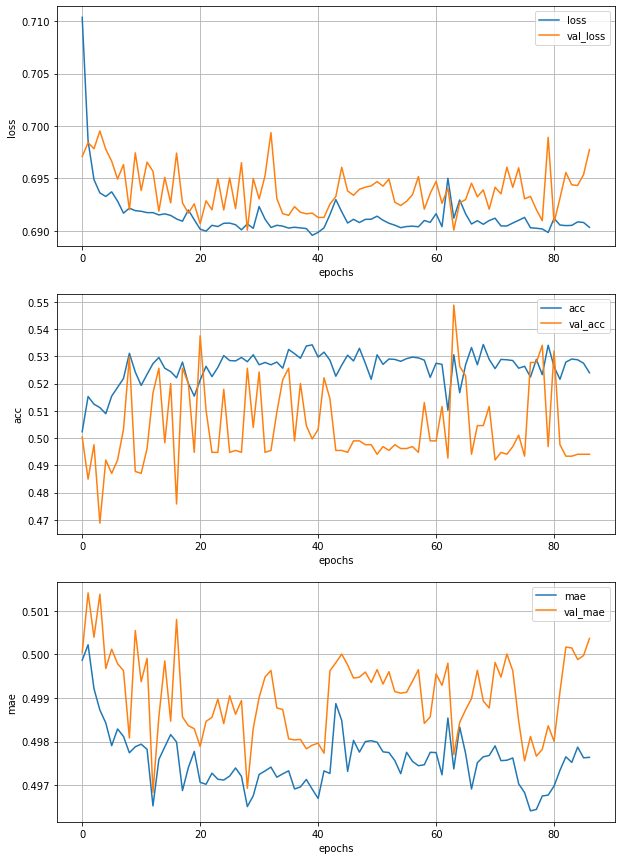

Epoch 88/150
223/223 [==============================] - 47s 212ms/step - loss: 0.6911 - acc: 0.5310 - mae: 0.4973 - val_loss: 0.6942 - val_acc: 0.4947 - val_mae: 0.4999


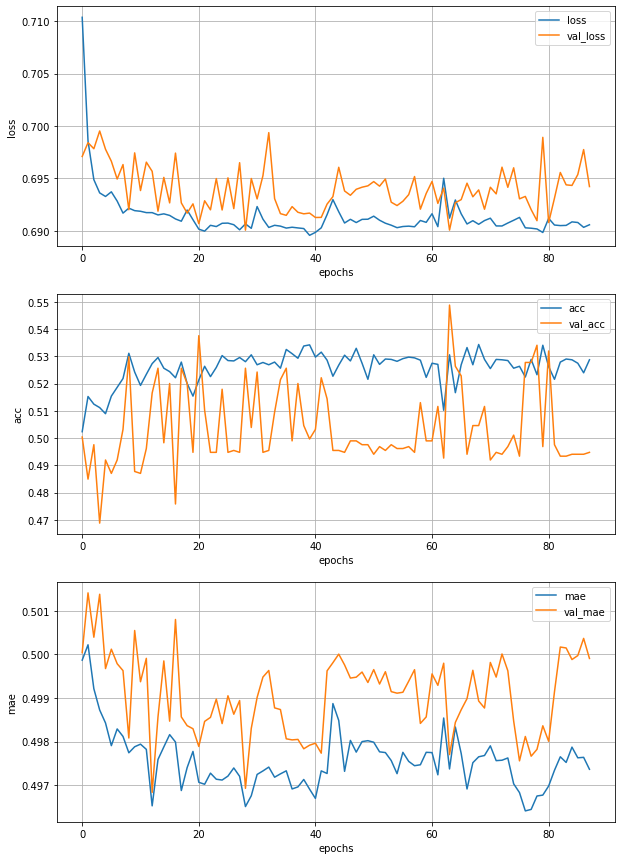

Epoch 89/150
223/223 [==============================] - 47s 211ms/step - loss: 0.6910 - acc: 0.5272 - mae: 0.4980 - val_loss: 0.6951 - val_acc: 0.4940 - val_mae: 0.4998


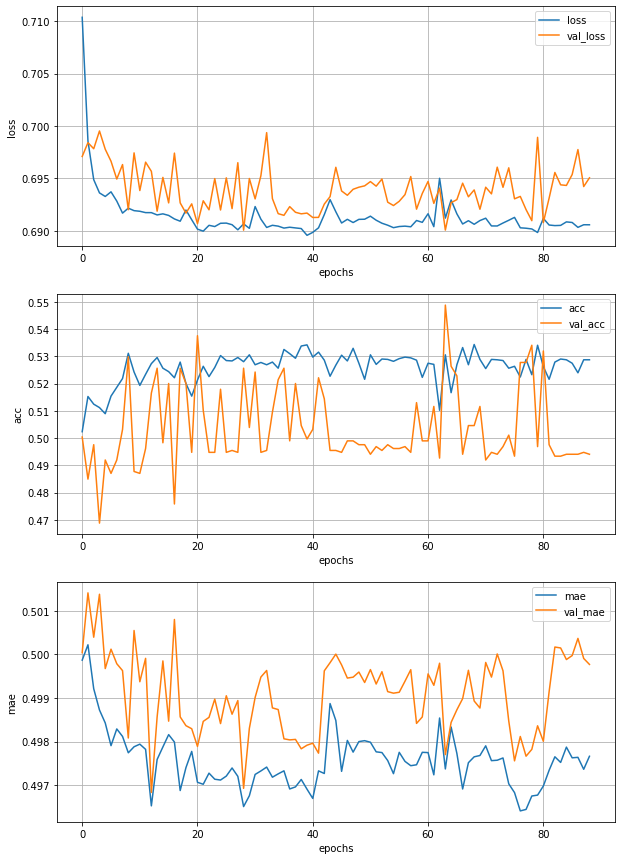

Epoch 90/150
223/223 [==============================] - 47s 211ms/step - loss: 0.6886 - acc: 0.5374 - mae: 0.4962 - val_loss: 0.6939 - val_acc: 0.4940 - val_mae: 0.4998


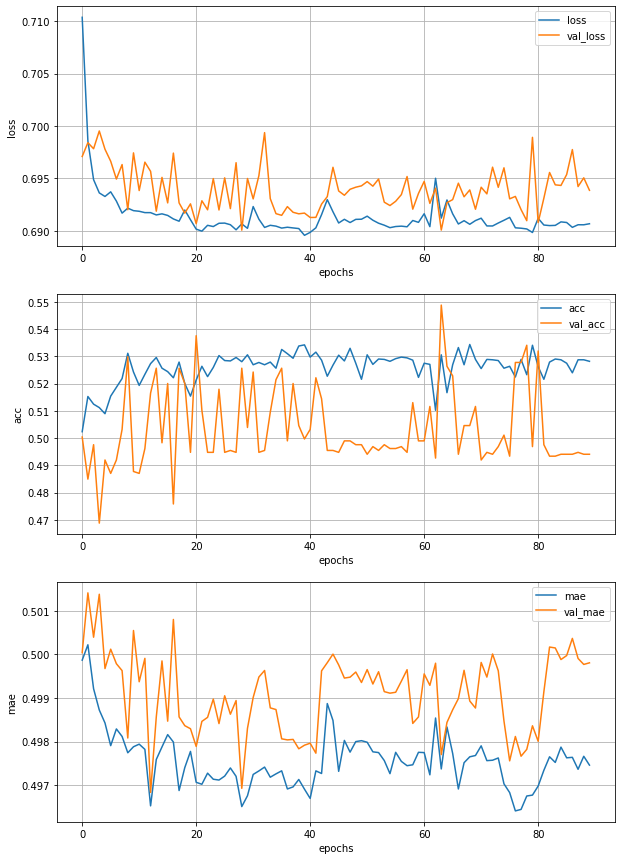

Epoch 91/150
223/223 [==============================] - 48s 215ms/step - loss: 0.6909 - acc: 0.5257 - mae: 0.4982 - val_loss: 0.6944 - val_acc: 0.4940 - val_mae: 0.4998


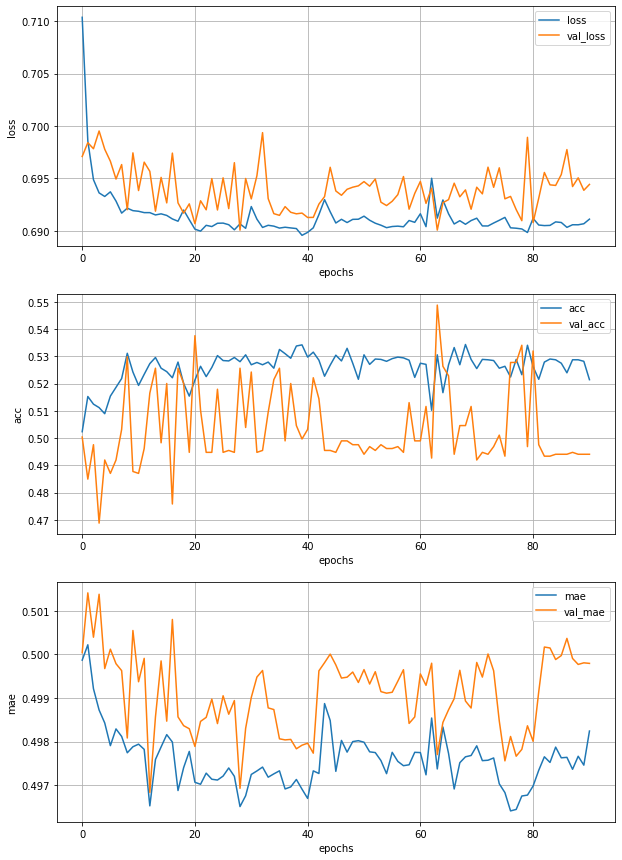

Epoch 92/150
223/223 [==============================] - 48s 216ms/step - loss: 0.6902 - acc: 0.5304 - mae: 0.4973 - val_loss: 0.6964 - val_acc: 0.4940 - val_mae: 0.4999


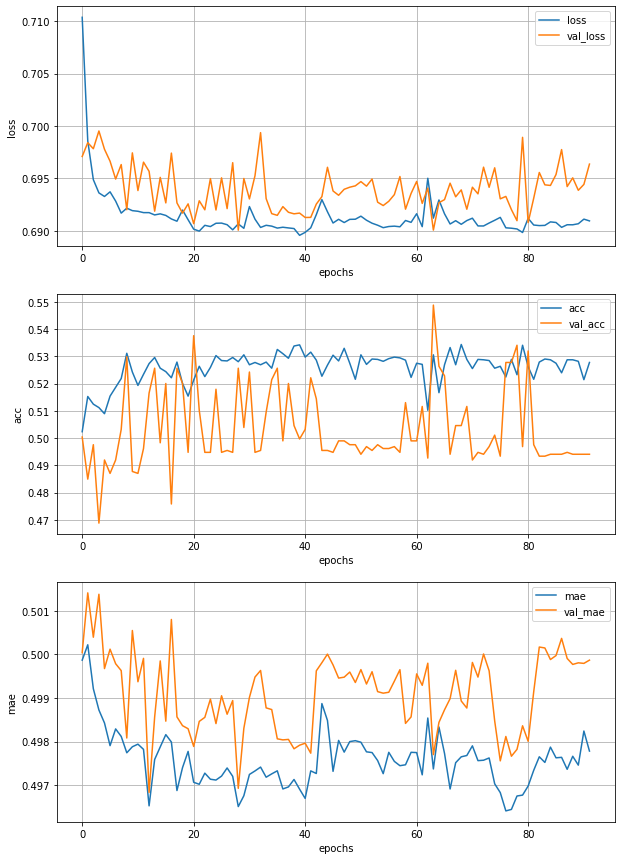

Epoch 93/150
223/223 [==============================] - 48s 217ms/step - loss: 0.6909 - acc: 0.5247 - mae: 0.4976 - val_loss: 0.6942 - val_acc: 0.4940 - val_mae: 0.4998


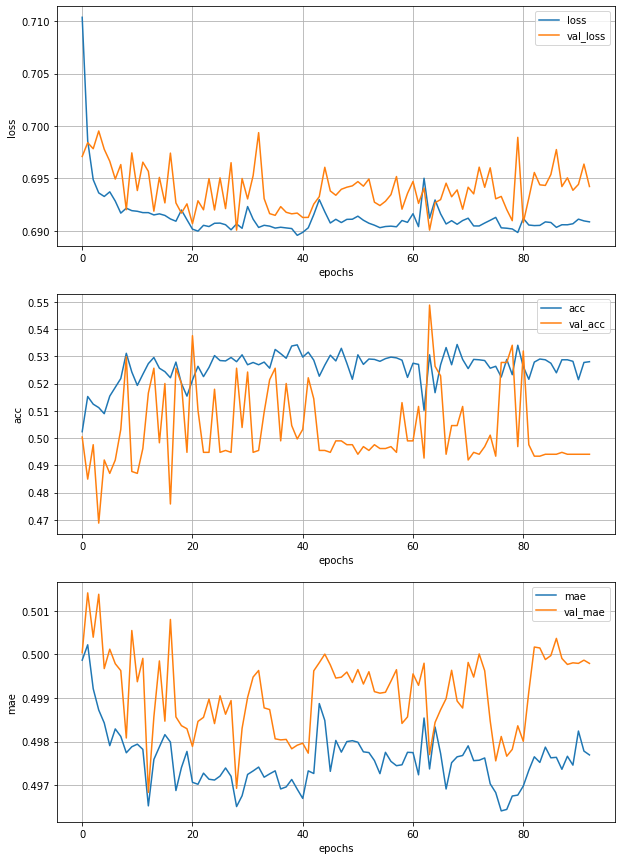

Epoch 94/150
223/223 [==============================] - 48s 217ms/step - loss: 0.6902 - acc: 0.5245 - mae: 0.4975 - val_loss: 0.6972 - val_acc: 0.4926 - val_mae: 0.5002


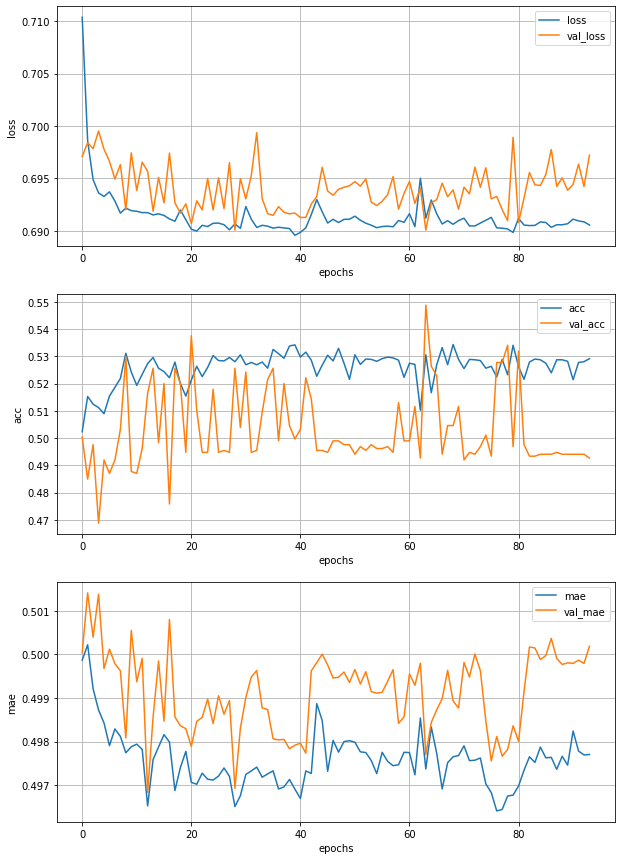

Epoch 95/150
223/223 [==============================] - 48s 217ms/step - loss: 0.6898 - acc: 0.5360 - mae: 0.4967 - val_loss: 0.6941 - val_acc: 0.4947 - val_mae: 0.4997


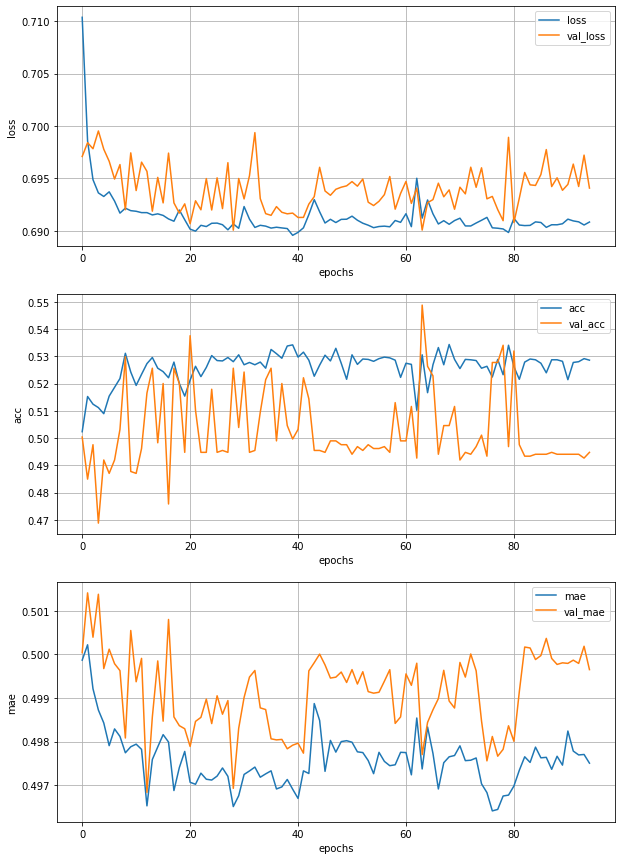

Epoch 96/150
223/223 [==============================] - 49s 218ms/step - loss: 0.6902 - acc: 0.5314 - mae: 0.4969 - val_loss: 0.6972 - val_acc: 0.4940 - val_mae: 0.5002


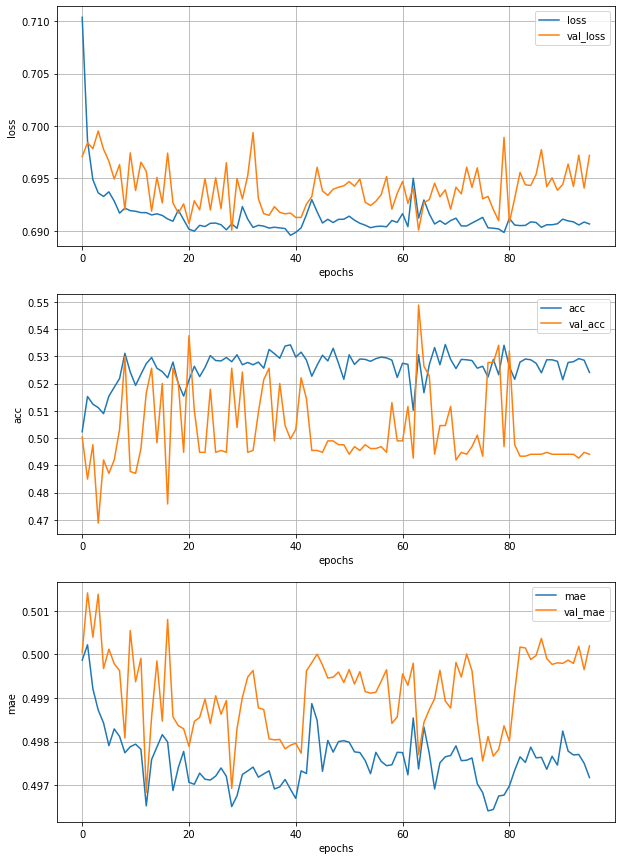

Epoch 97/150
223/223 [==============================] - 49s 218ms/step - loss: 0.6909 - acc: 0.5266 - mae: 0.4972 - val_loss: 0.6952 - val_acc: 0.4926 - val_mae: 0.4989


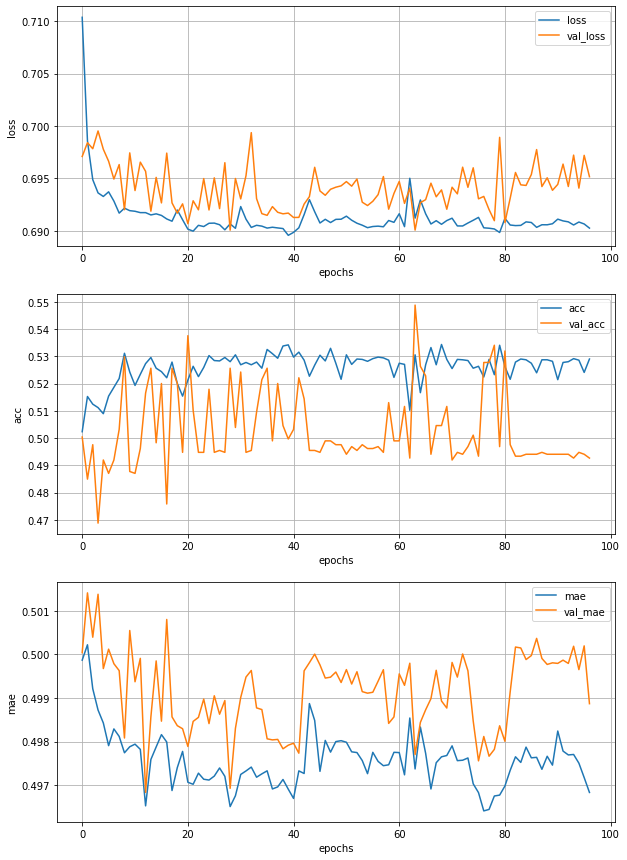

Epoch 98/150
223/223 [==============================] - 50s 222ms/step - loss: 0.6952 - acc: 0.5152 - mae: 0.4971 - val_loss: 0.6984 - val_acc: 0.4933 - val_mae: 0.5004


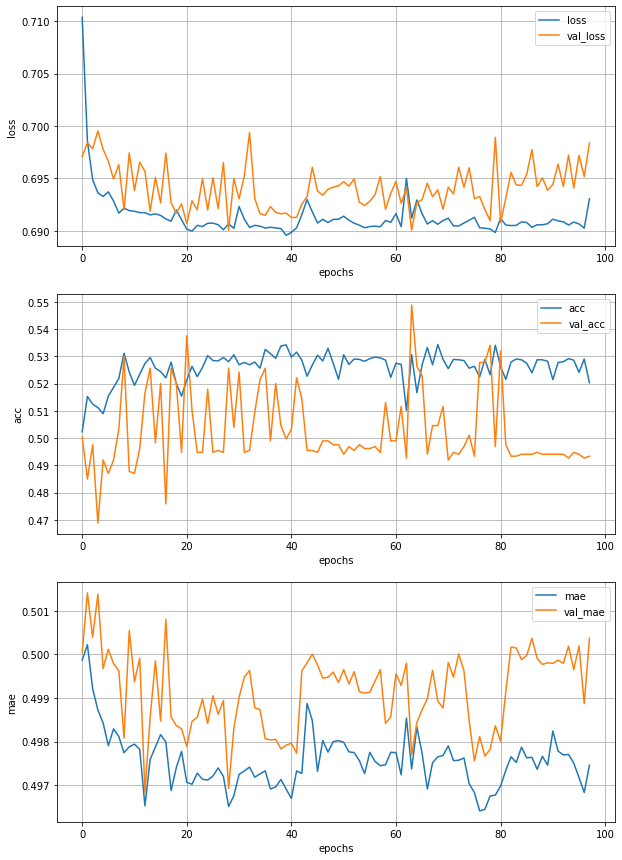

Epoch 99/150
223/223 [==============================] - 48s 217ms/step - loss: 0.6921 - acc: 0.5270 - mae: 0.4981 - val_loss: 0.6941 - val_acc: 0.4968 - val_mae: 0.4994


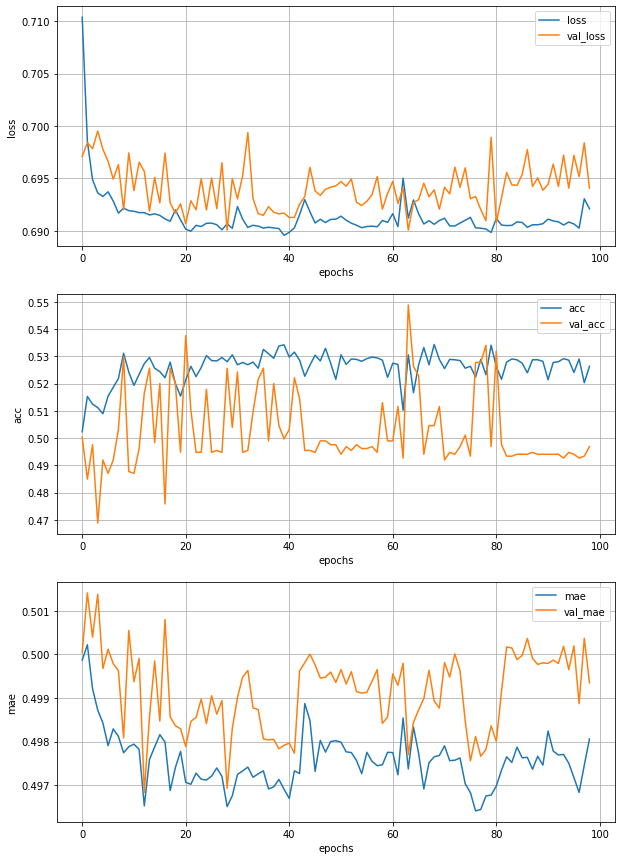

Epoch 100/150
223/223 [==============================] - 50s 222ms/step - loss: 0.6908 - acc: 0.5296 - mae: 0.4978 - val_loss: 0.6930 - val_acc: 0.5067 - val_mae: 0.4996


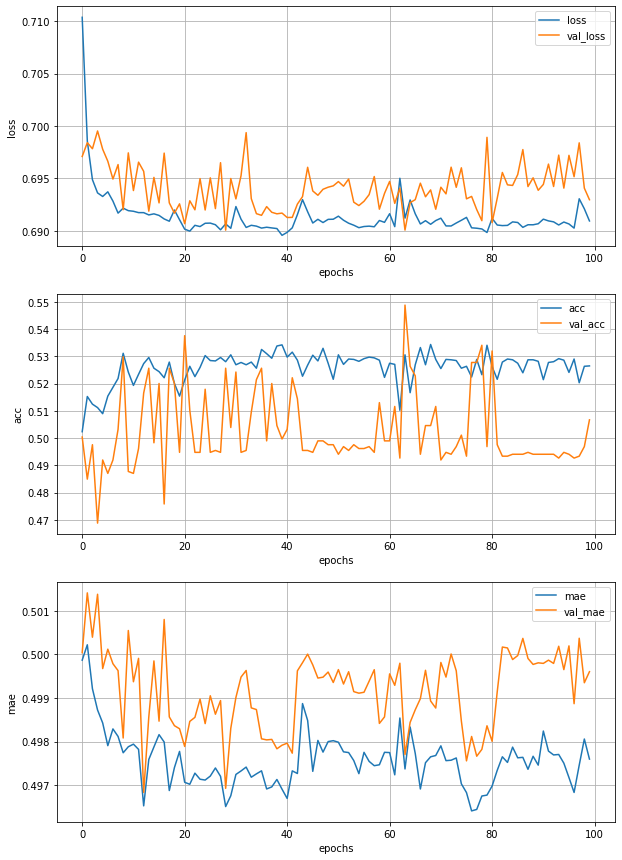

Epoch 101/150
223/223 [==============================] - 50s 224ms/step - loss: 0.6904 - acc: 0.5276 - mae: 0.4978 - val_loss: 0.6939 - val_acc: 0.4947 - val_mae: 0.4994


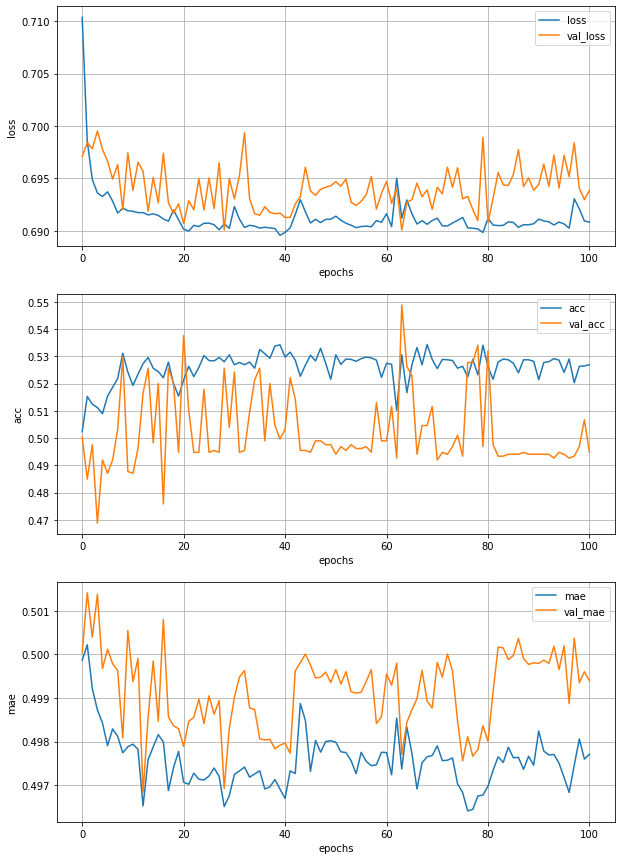

Epoch 102/150
223/223 [==============================] - 49s 221ms/step - loss: 0.6914 - acc: 0.5282 - mae: 0.4978 - val_loss: 0.6929 - val_acc: 0.4947 - val_mae: 0.4993


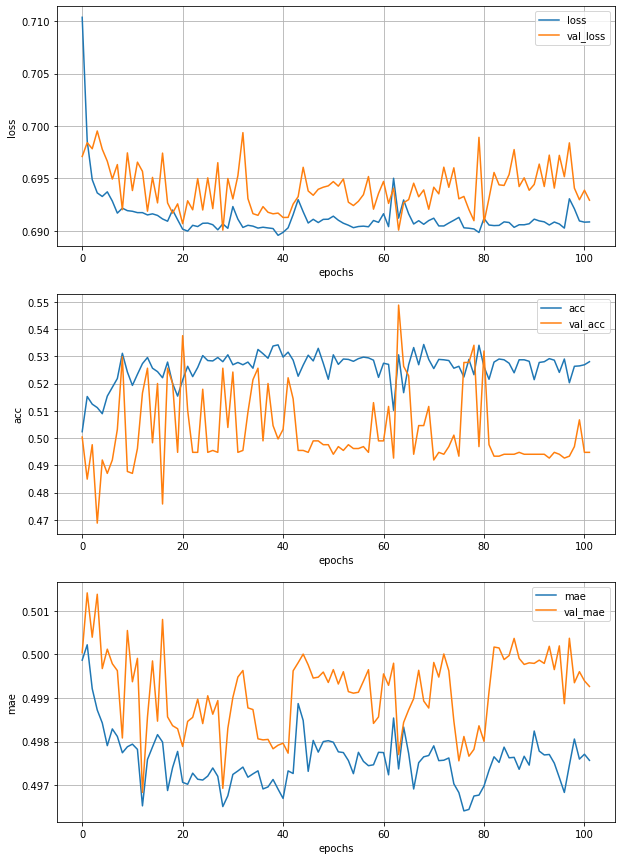

Epoch 103/150
223/223 [==============================] - 51s 227ms/step - loss: 0.6904 - acc: 0.5329 - mae: 0.4976 - val_loss: 0.6943 - val_acc: 0.4954 - val_mae: 0.4992


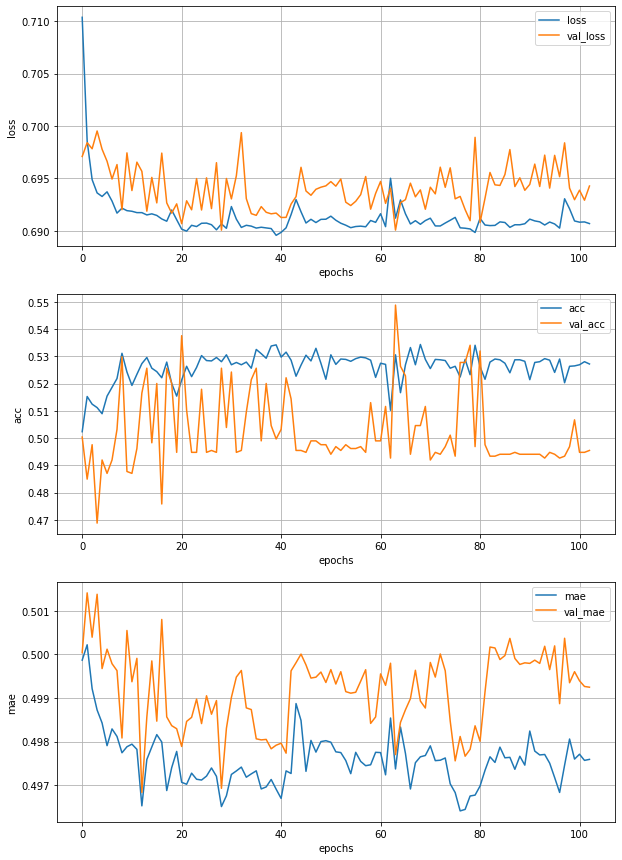

Epoch 104/150
223/223 [==============================] - 51s 231ms/step - loss: 0.6898 - acc: 0.5331 - mae: 0.4970 - val_loss: 0.6943 - val_acc: 0.5011 - val_mae: 0.4993


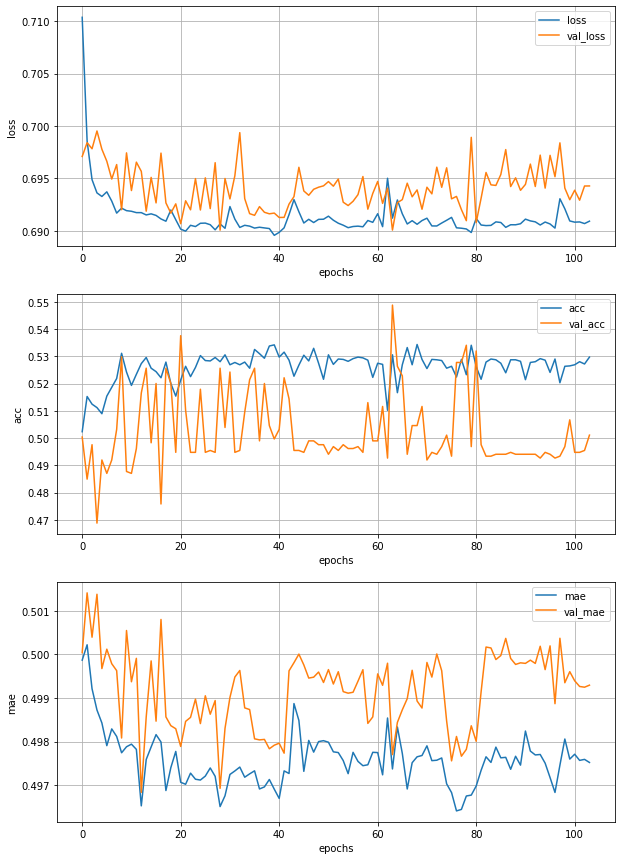

Epoch 105/150
223/223 [==============================] - 51s 228ms/step - loss: 0.6913 - acc: 0.5213 - mae: 0.4977 - val_loss: 0.6949 - val_acc: 0.5109 - val_mae: 0.4991


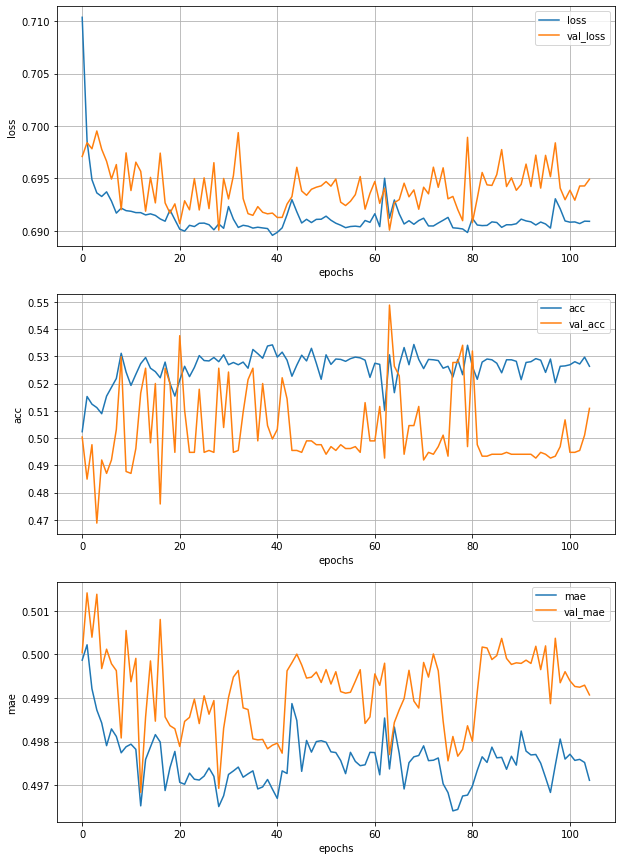

Epoch 106/150
223/223 [==============================] - 51s 227ms/step - loss: 0.6964 - acc: 0.5242 - mae: 0.4972 - val_loss: 0.7186 - val_acc: 0.4772 - val_mae: 0.5043


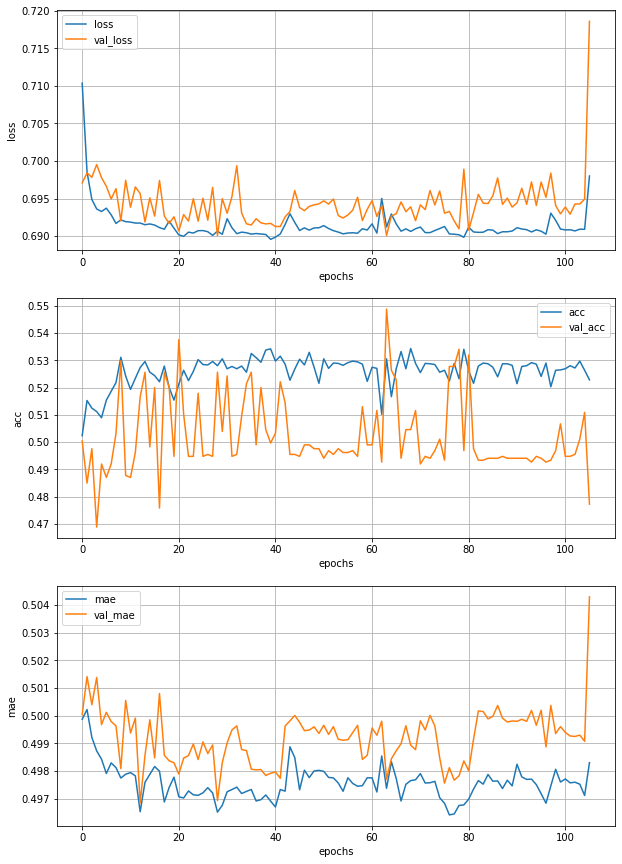

Epoch 107/150
223/223 [==============================] - 52s 231ms/step - loss: 0.6940 - acc: 0.5336 - mae: 0.4944 - val_loss: 0.6932 - val_acc: 0.5256 - val_mae: 0.4991


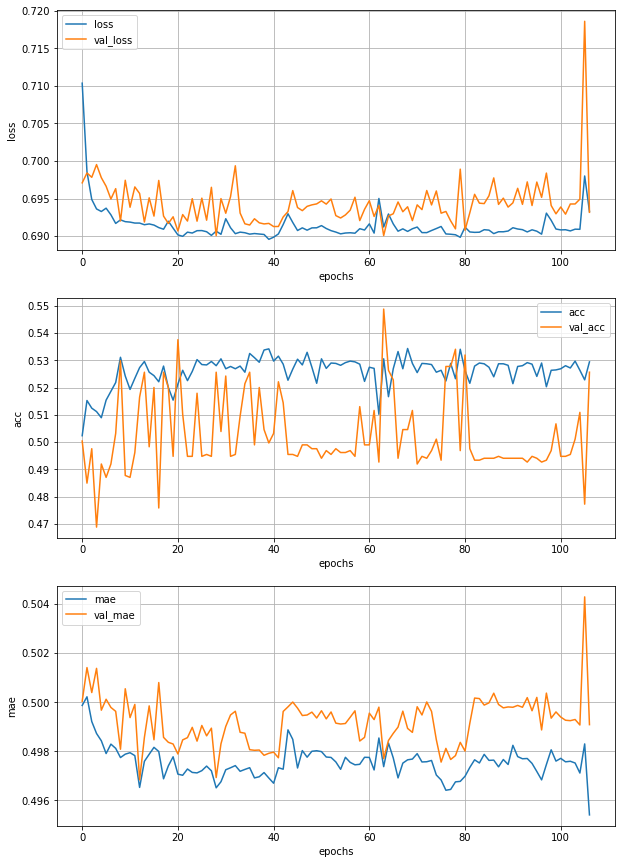

Epoch 108/150
223/223 [==============================] - 50s 226ms/step - loss: 0.6913 - acc: 0.5189 - mae: 0.4980 - val_loss: 0.7105 - val_acc: 0.4954 - val_mae: 0.5015


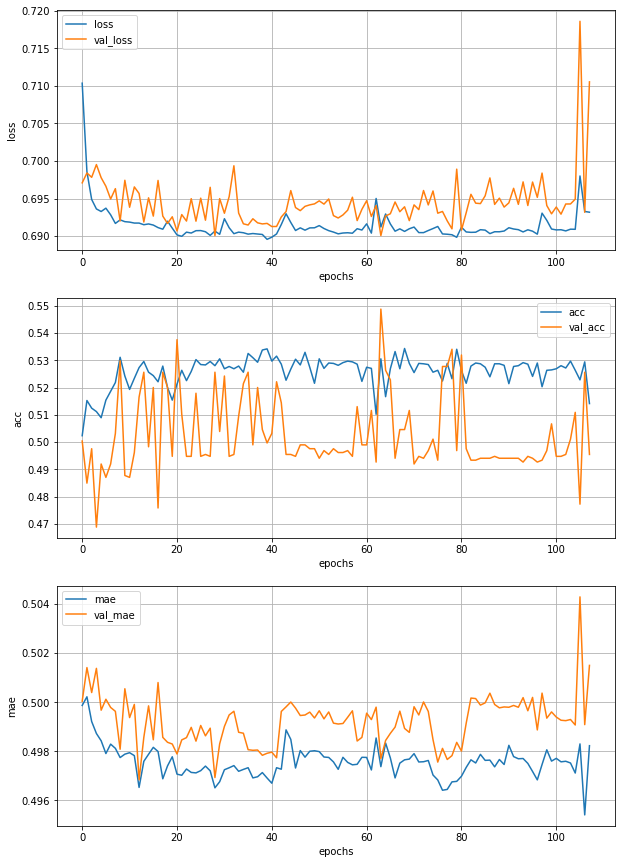

Epoch 109/150
223/223 [==============================] - 52s 233ms/step - loss: 0.6934 - acc: 0.5214 - mae: 0.4977 - val_loss: 0.6965 - val_acc: 0.4940 - val_mae: 0.5002


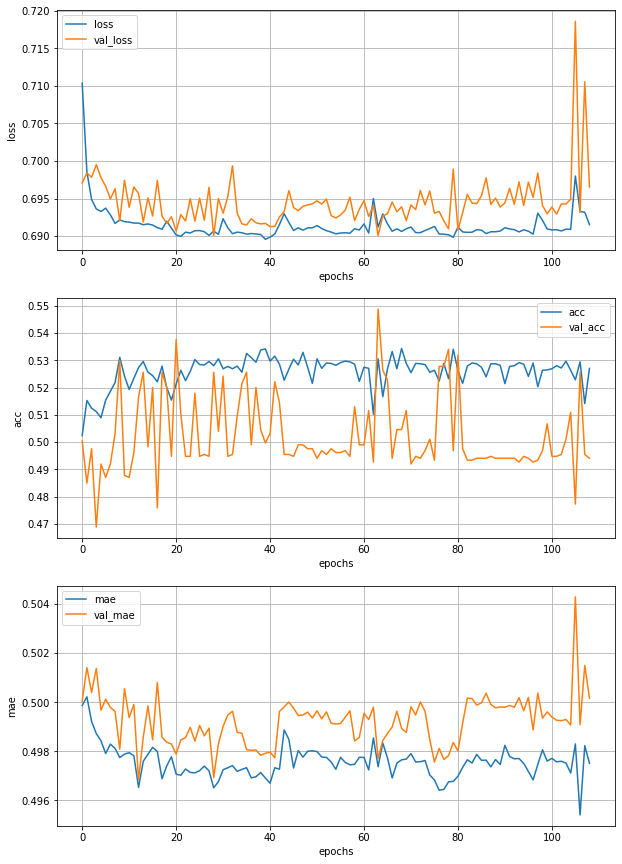

Epoch 110/150
223/223 [==============================] - 53s 238ms/step - loss: 0.6889 - acc: 0.5425 - mae: 0.4962 - val_loss: 0.6937 - val_acc: 0.4968 - val_mae: 0.4990


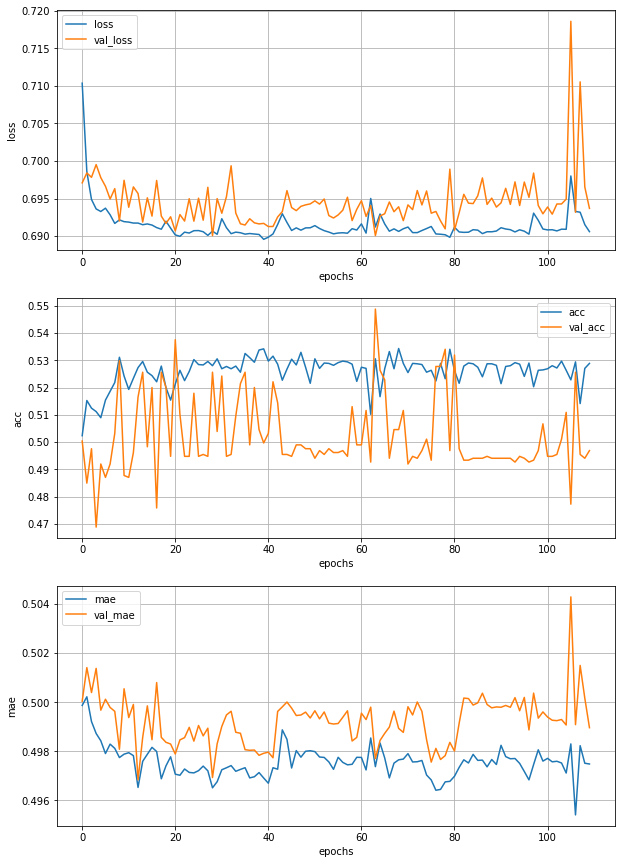

Epoch 111/150
223/223 [==============================] - 52s 232ms/step - loss: 0.6908 - acc: 0.5173 - mae: 0.4979 - val_loss: 0.6946 - val_acc: 0.4968 - val_mae: 0.4991


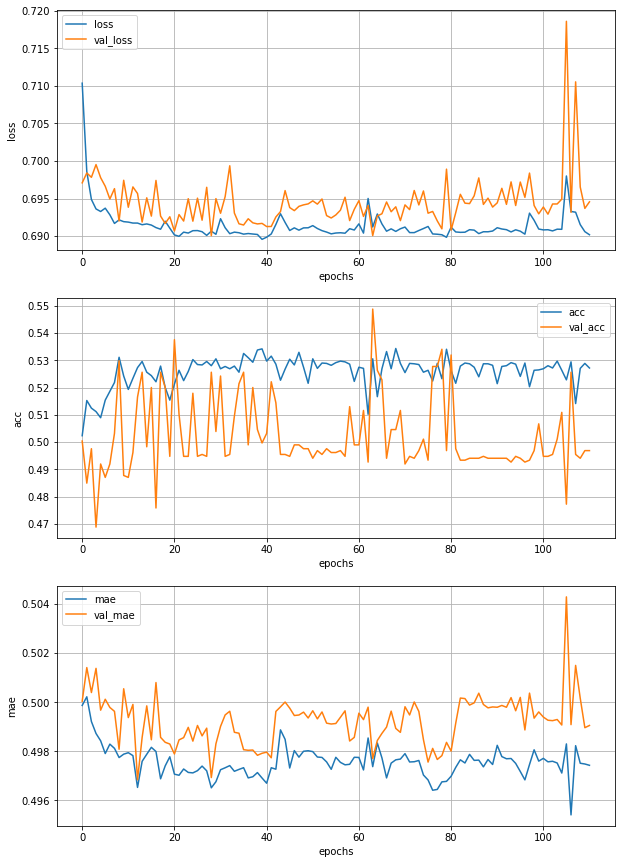

Epoch 112/150
223/223 [==============================] - 52s 235ms/step - loss: 0.6913 - acc: 0.5182 - mae: 0.4977 - val_loss: 0.6963 - val_acc: 0.4947 - val_mae: 0.5001


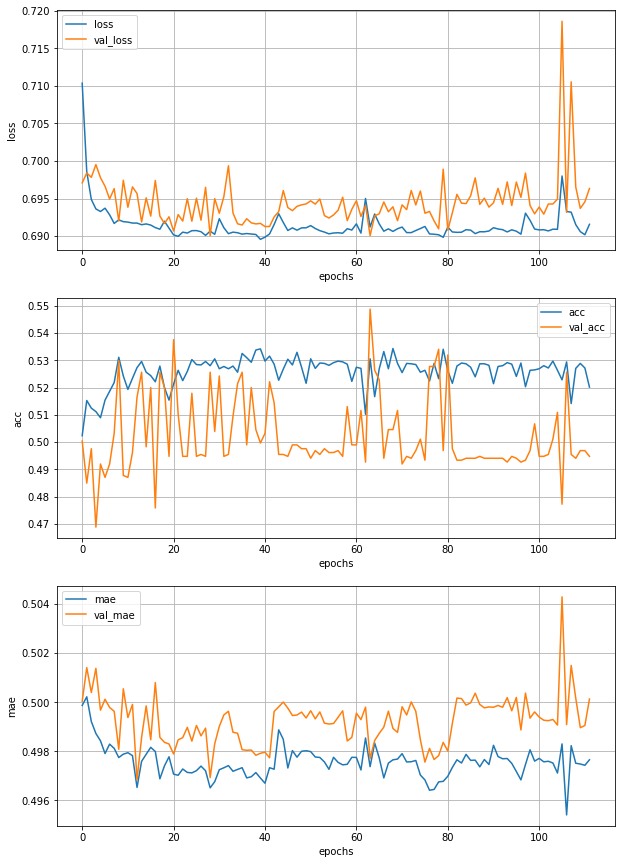

Epoch 113/150
223/223 [==============================] - 53s 237ms/step - loss: 0.6908 - acc: 0.5345 - mae: 0.4972 - val_loss: 0.6945 - val_acc: 0.4947 - val_mae: 0.4999


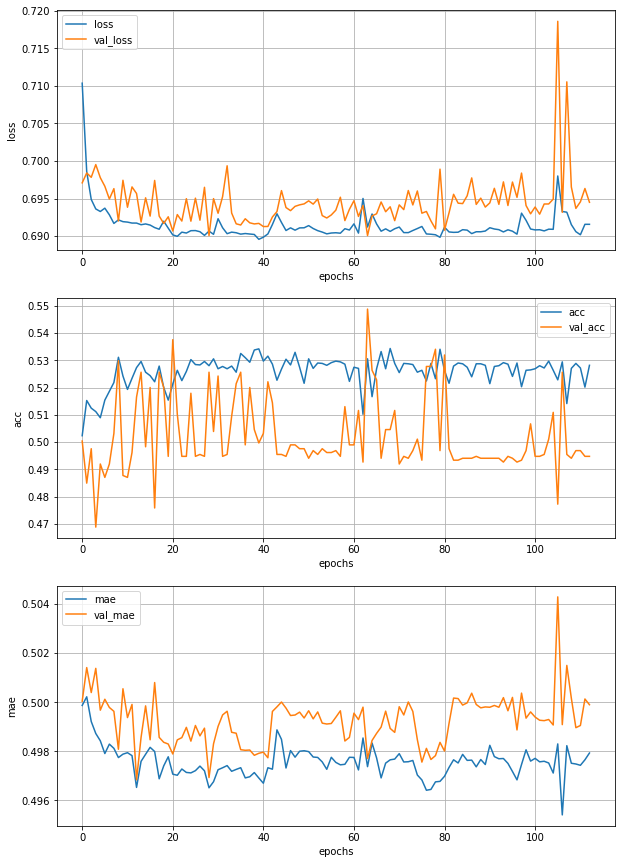

Epoch 114/150
223/223 [==============================] - 53s 239ms/step - loss: 0.6906 - acc: 0.5288 - mae: 0.4981 - val_loss: 0.6953 - val_acc: 0.4947 - val_mae: 0.4998


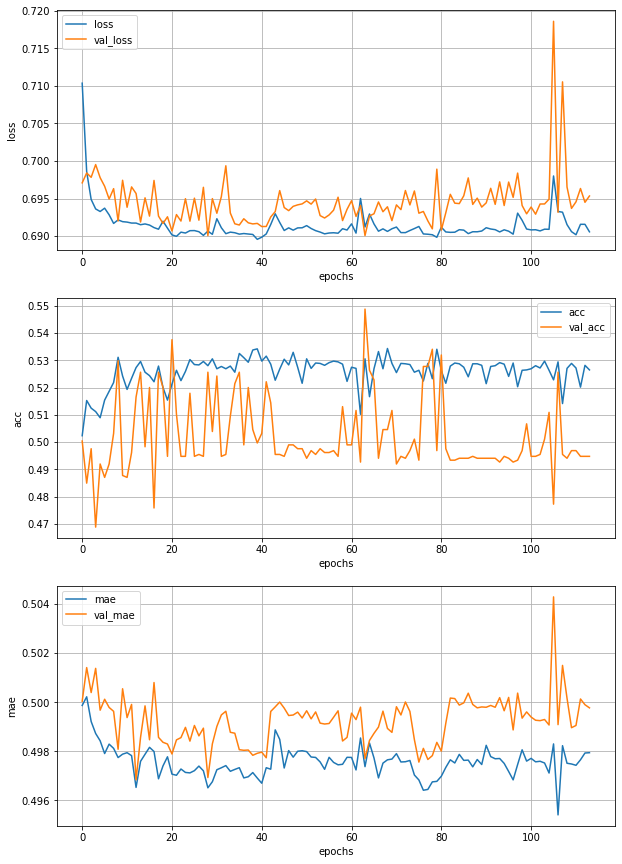

Epoch 115/150
223/223 [==============================] - 54s 241ms/step - loss: 0.6912 - acc: 0.5259 - mae: 0.4979 - val_loss: 0.6999 - val_acc: 0.4940 - val_mae: 0.5012


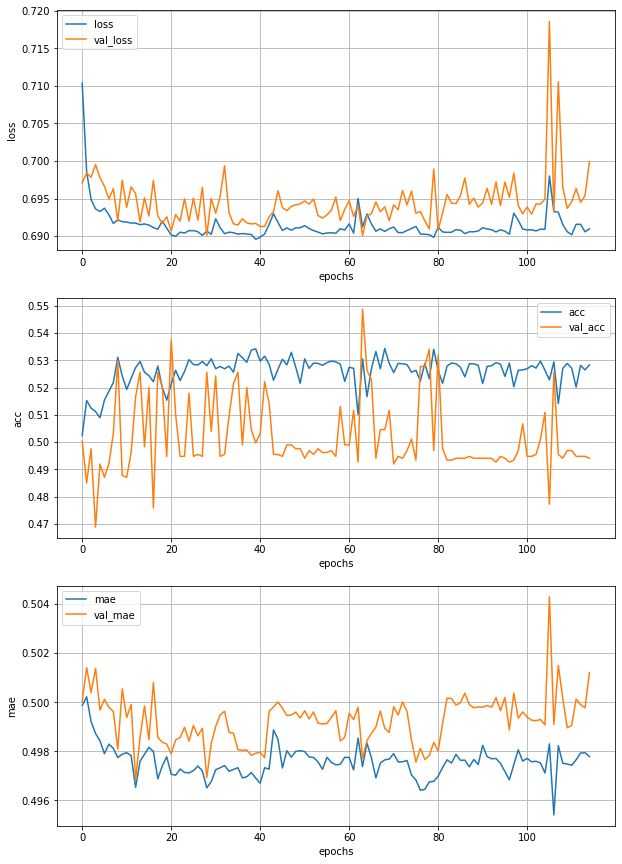

Epoch 116/150
223/223 [==============================] - 54s 242ms/step - loss: 0.6926 - acc: 0.5297 - mae: 0.4975 - val_loss: 0.6952 - val_acc: 0.5046 - val_mae: 0.4999


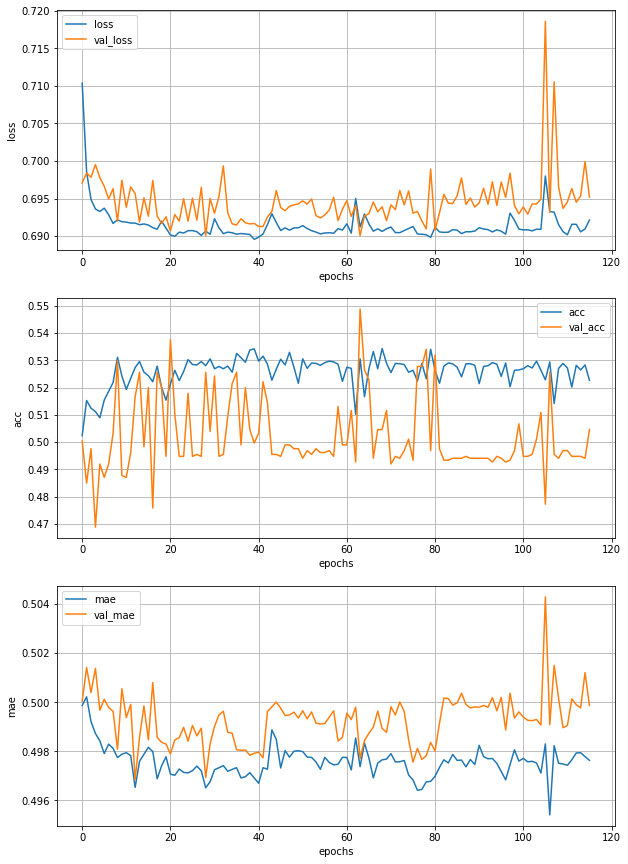

Epoch 117/150
223/223 [==============================] - 53s 238ms/step - loss: 0.6920 - acc: 0.5284 - mae: 0.4981 - val_loss: 0.6944 - val_acc: 0.4961 - val_mae: 0.4993


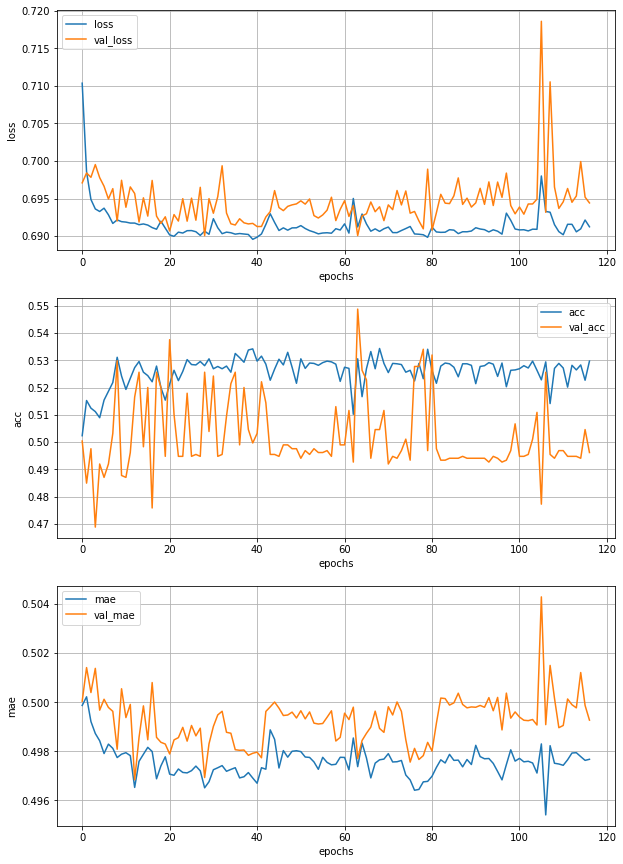

Epoch 118/150
223/223 [==============================] - 53s 238ms/step - loss: 0.6894 - acc: 0.5314 - mae: 0.4965 - val_loss: 0.6960 - val_acc: 0.4968 - val_mae: 0.4997


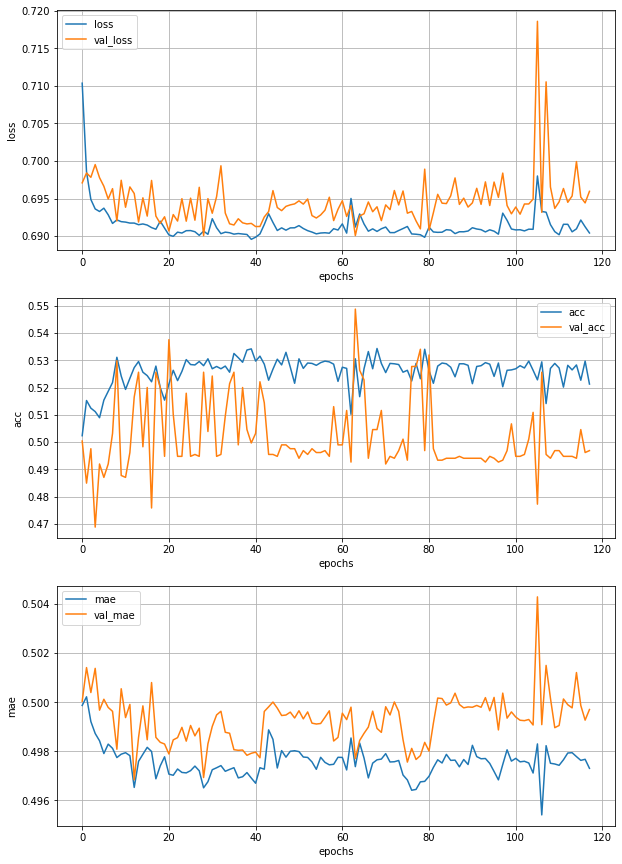

Epoch 119/150
223/223 [==============================] - 53s 237ms/step - loss: 0.6903 - acc: 0.5325 - mae: 0.4972 - val_loss: 0.6934 - val_acc: 0.4940 - val_mae: 0.4992


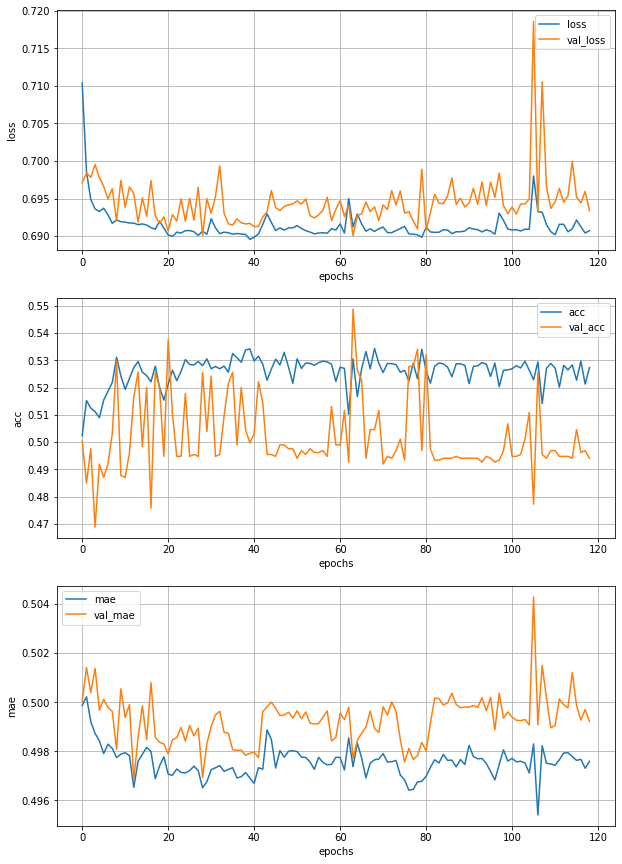

Epoch 120/150
223/223 [==============================] - 53s 239ms/step - loss: 0.6905 - acc: 0.5274 - mae: 0.4974 - val_loss: 0.6948 - val_acc: 0.4940 - val_mae: 0.5000


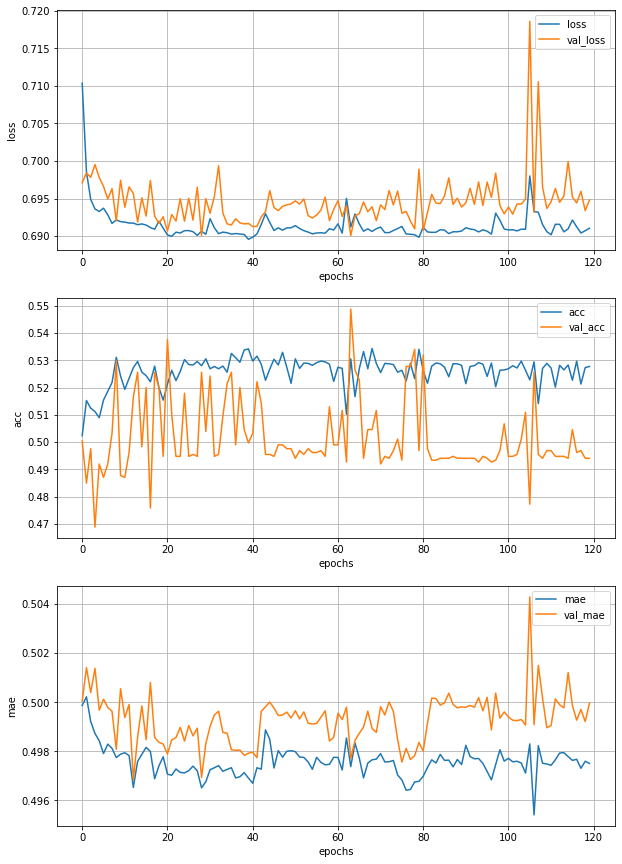

Epoch 121/150
223/223 [==============================] - 53s 239ms/step - loss: 0.6905 - acc: 0.5299 - mae: 0.4975 - val_loss: 0.6941 - val_acc: 0.4961 - val_mae: 0.4996


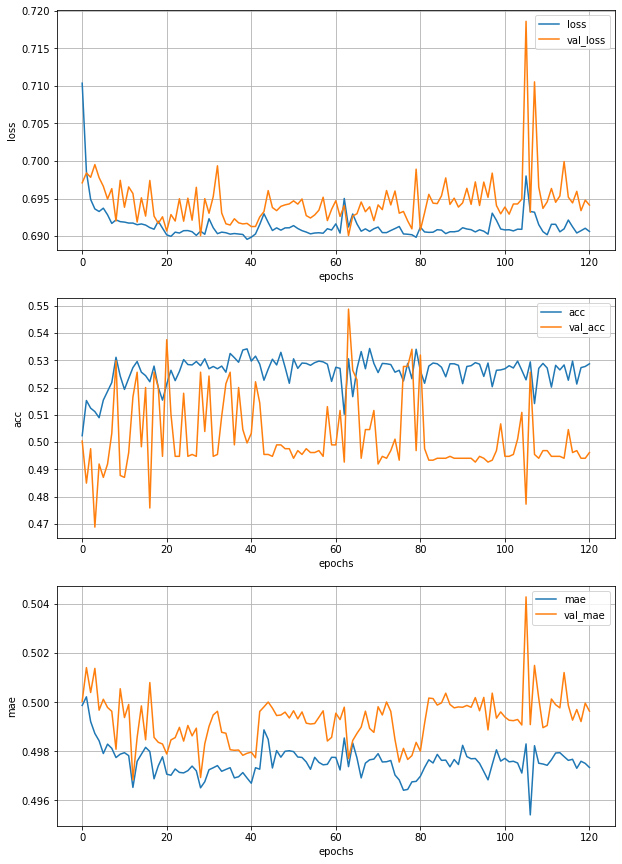

Epoch 122/150
223/223 [==============================] - 53s 239ms/step - loss: 0.6898 - acc: 0.5282 - mae: 0.4970 - val_loss: 0.6974 - val_acc: 0.4947 - val_mae: 0.5005


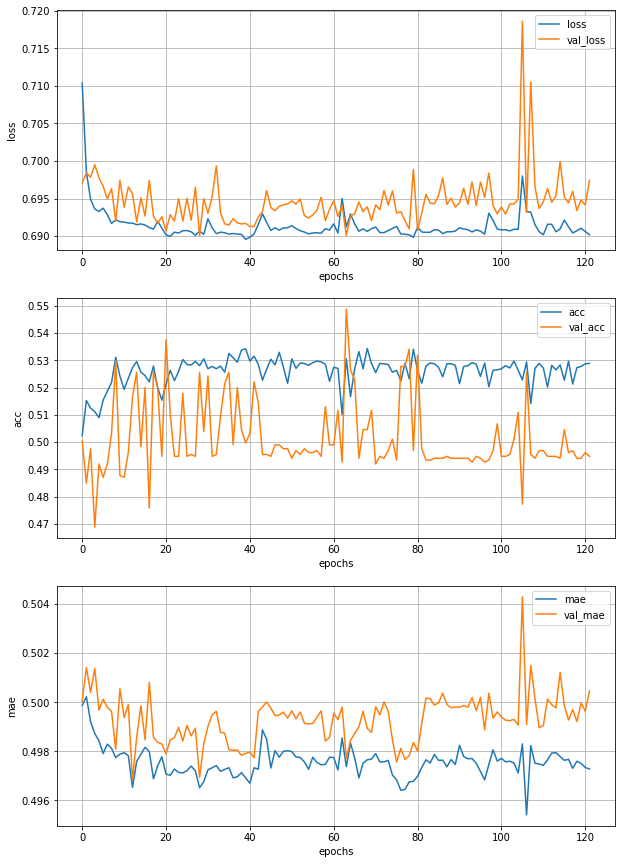

Epoch 123/150
223/223 [==============================] - 55s 248ms/step - loss: 0.6895 - acc: 0.5343 - mae: 0.4958 - val_loss: 0.6948 - val_acc: 0.4968 - val_mae: 0.4999


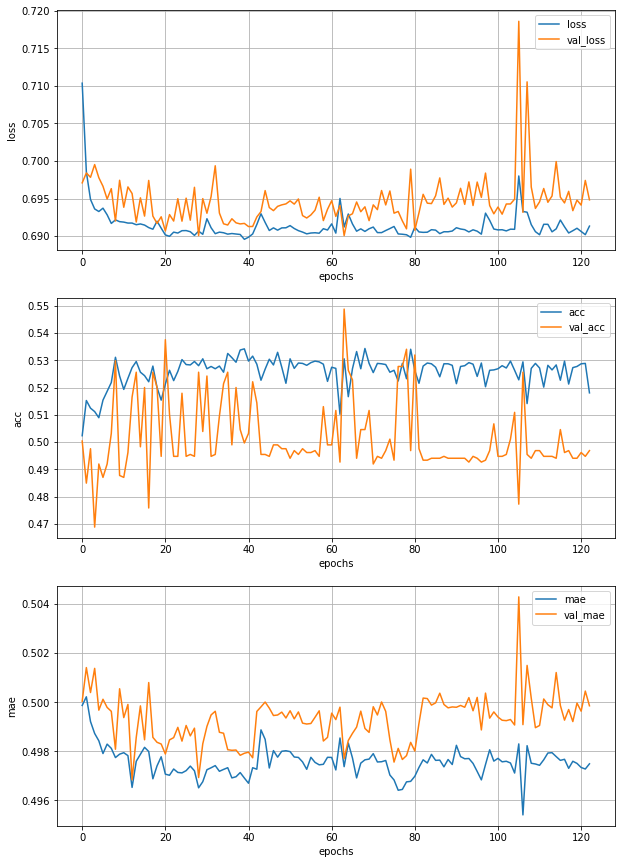

Epoch 124/150
223/223 [==============================] - 55s 246ms/step - loss: 0.6911 - acc: 0.5272 - mae: 0.4979 - val_loss: 0.6947 - val_acc: 0.4982 - val_mae: 0.4997


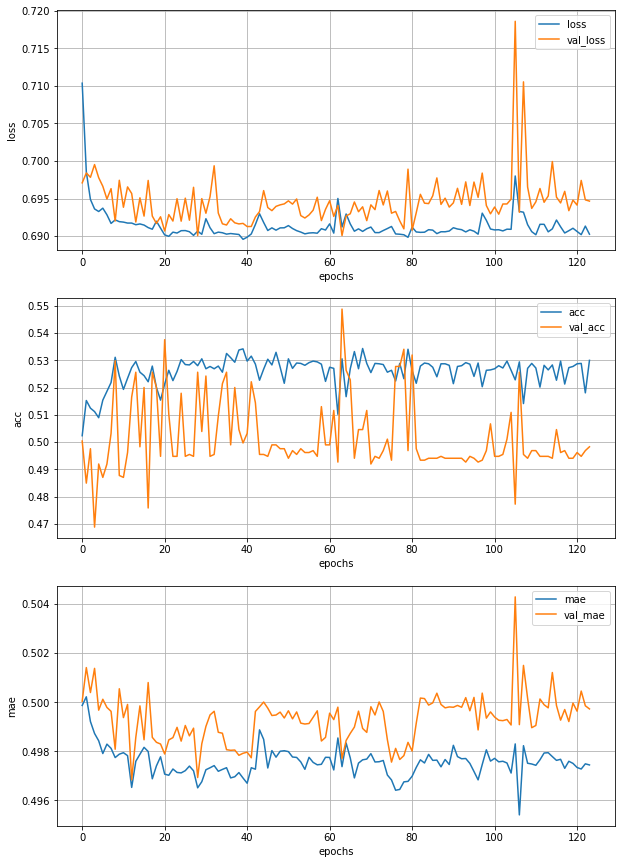

Epoch 125/150
223/223 [==============================] - 55s 248ms/step - loss: 0.6900 - acc: 0.5246 - mae: 0.4973 - val_loss: 0.6944 - val_acc: 0.4940 - val_mae: 0.4996


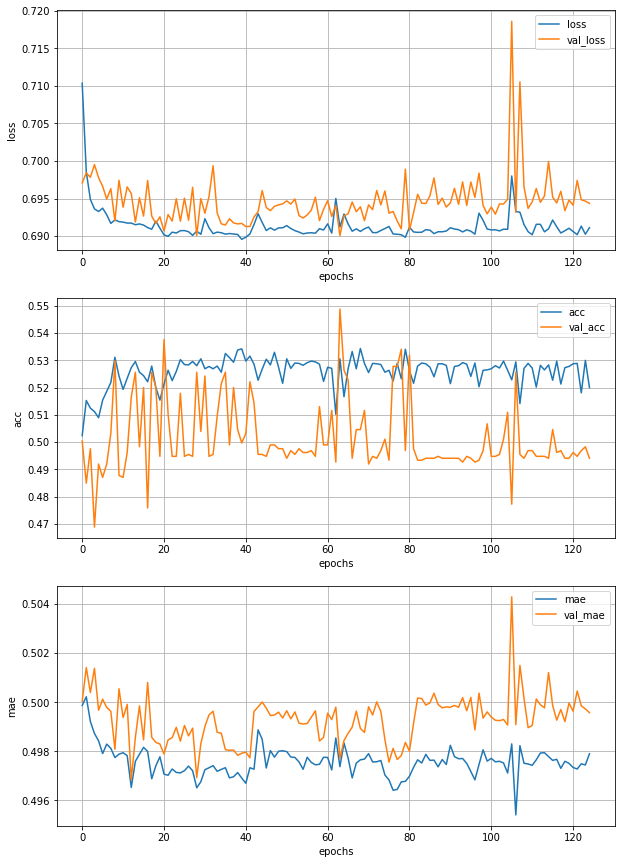

Epoch 126/150
223/223 [==============================] - 56s 250ms/step - loss: 0.6898 - acc: 0.5336 - mae: 0.4967 - val_loss: 0.6933 - val_acc: 0.4947 - val_mae: 0.4993


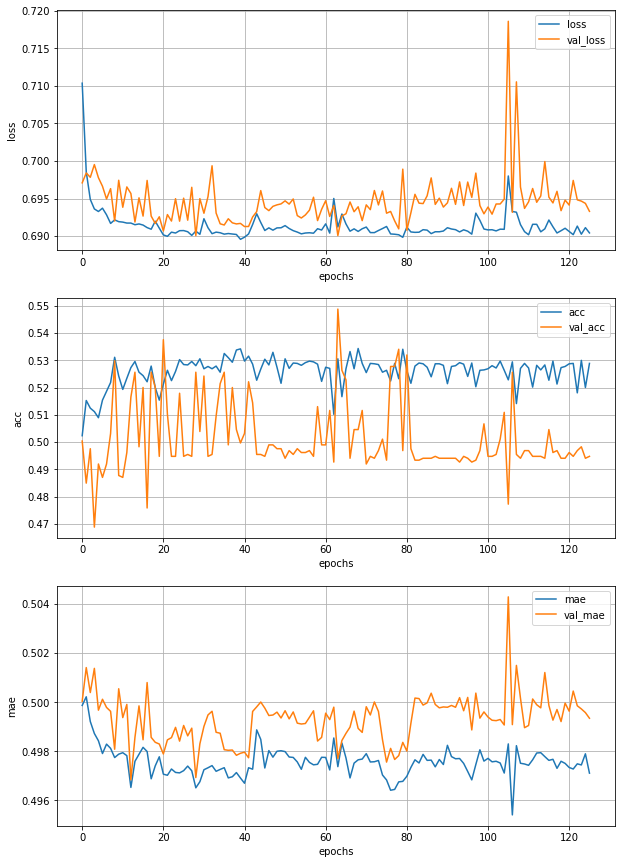

Epoch 127/150
223/223 [==============================] - 55s 248ms/step - loss: 0.7167 - acc: 0.4998 - mae: 0.4997 - val_loss: 0.6970 - val_acc: 0.4954 - val_mae: 0.5000


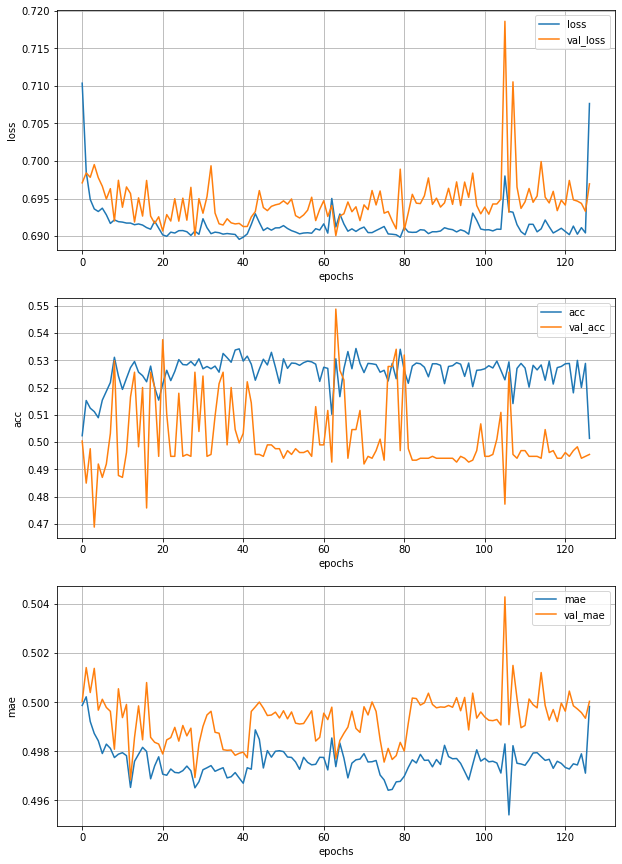

Epoch 128/150
223/223 [==============================] - 56s 249ms/step - loss: 0.6926 - acc: 0.5245 - mae: 0.4978 - val_loss: 0.6931 - val_acc: 0.5046 - val_mae: 0.4991


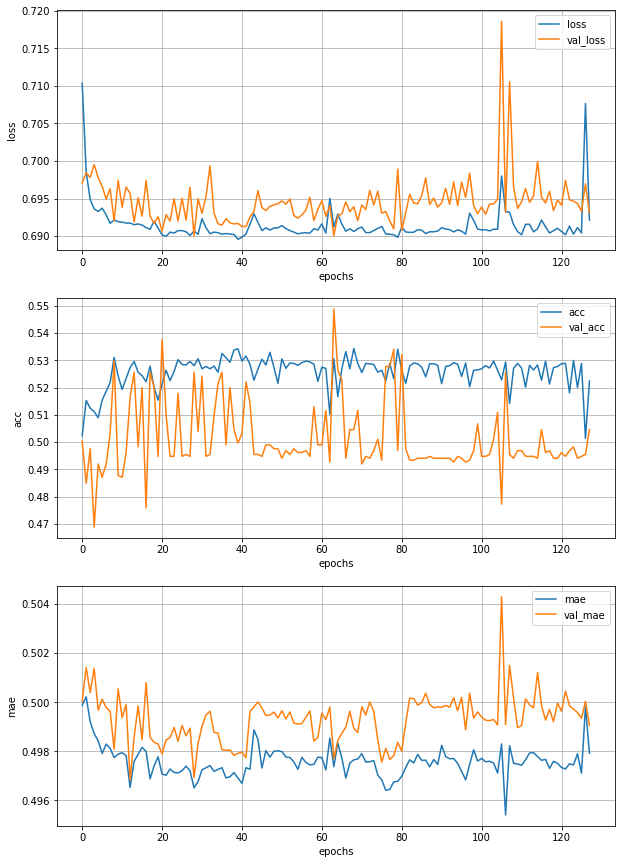

Epoch 129/150
223/223 [==============================] - 56s 250ms/step - loss: 0.6907 - acc: 0.5273 - mae: 0.4976 - val_loss: 0.6942 - val_acc: 0.4968 - val_mae: 0.4996


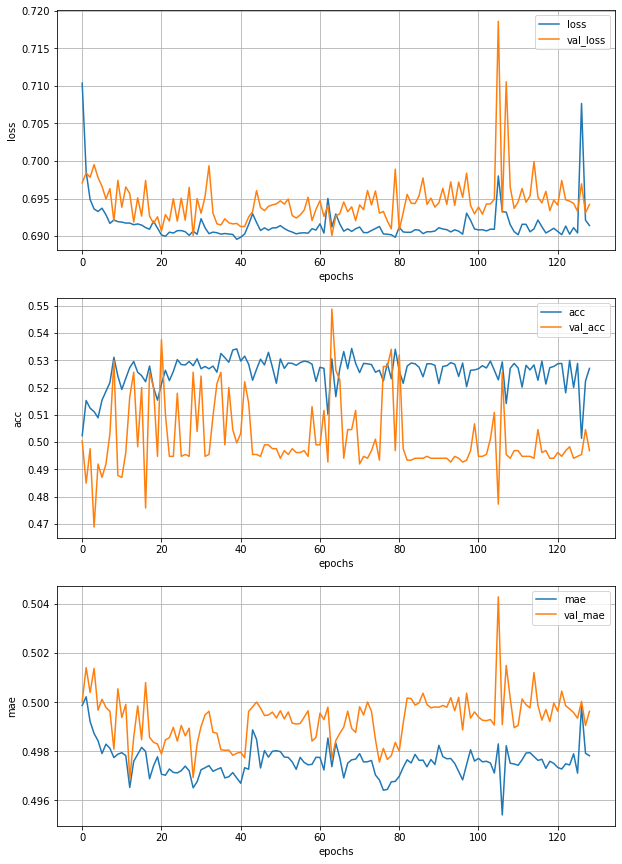

Epoch 130/150
223/223 [==============================] - 57s 254ms/step - loss: 0.6900 - acc: 0.5274 - mae: 0.4973 - val_loss: 0.6949 - val_acc: 0.4940 - val_mae: 0.4996


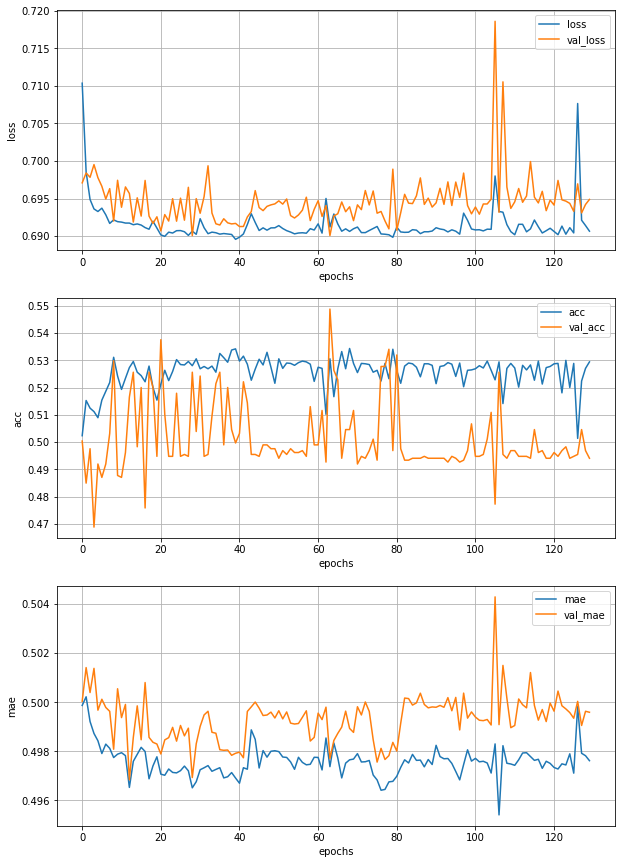

Epoch 131/150
223/223 [==============================] - 57s 256ms/step - loss: 0.6894 - acc: 0.5352 - mae: 0.4966 - val_loss: 0.6934 - val_acc: 0.5011 - val_mae: 0.4993


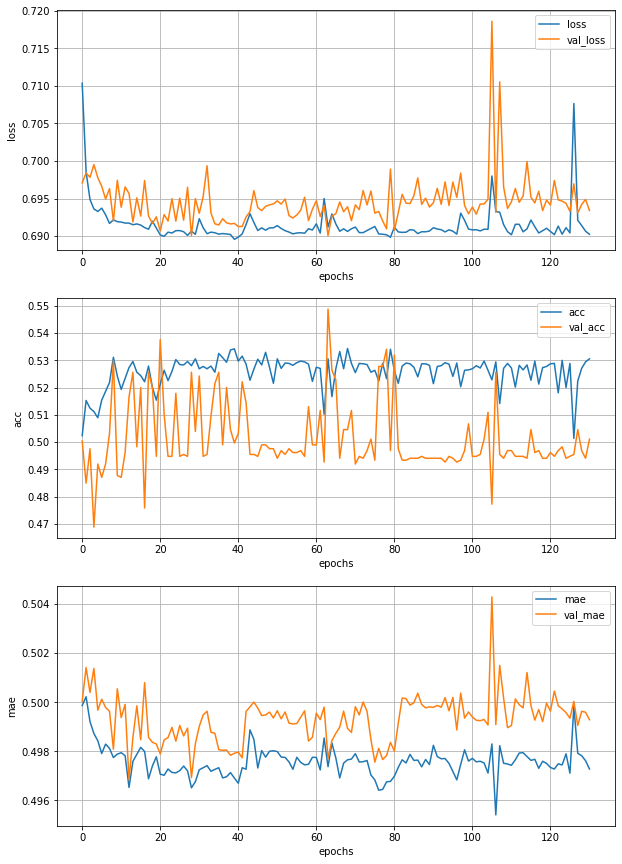

Epoch 132/150
223/223 [==============================] - 57s 256ms/step - loss: 0.6903 - acc: 0.5255 - mae: 0.4974 - val_loss: 0.6943 - val_acc: 0.4996 - val_mae: 0.4994


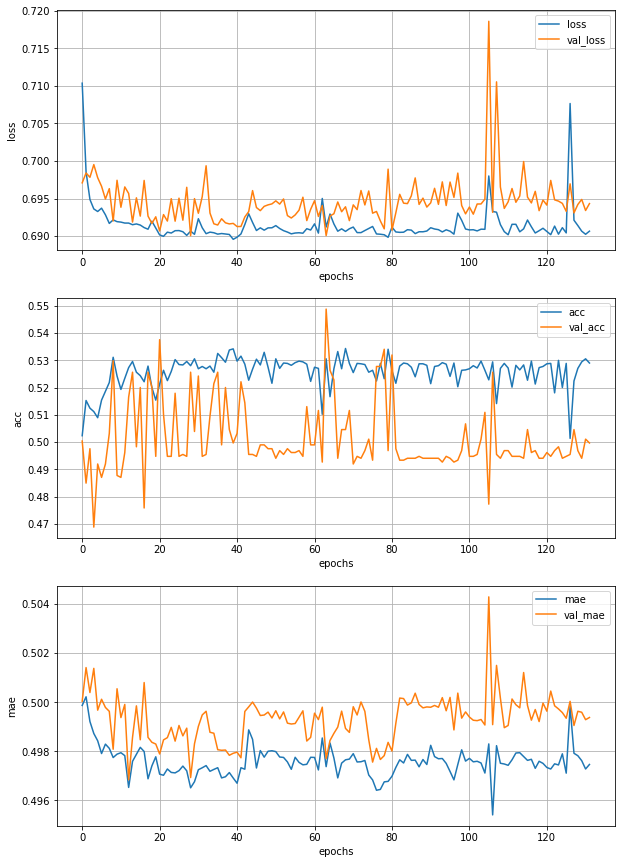

Epoch 133/150
223/223 [==============================] - 57s 257ms/step - loss: 0.6887 - acc: 0.5356 - mae: 0.4962 - val_loss: 0.6951 - val_acc: 0.4954 - val_mae: 0.4997


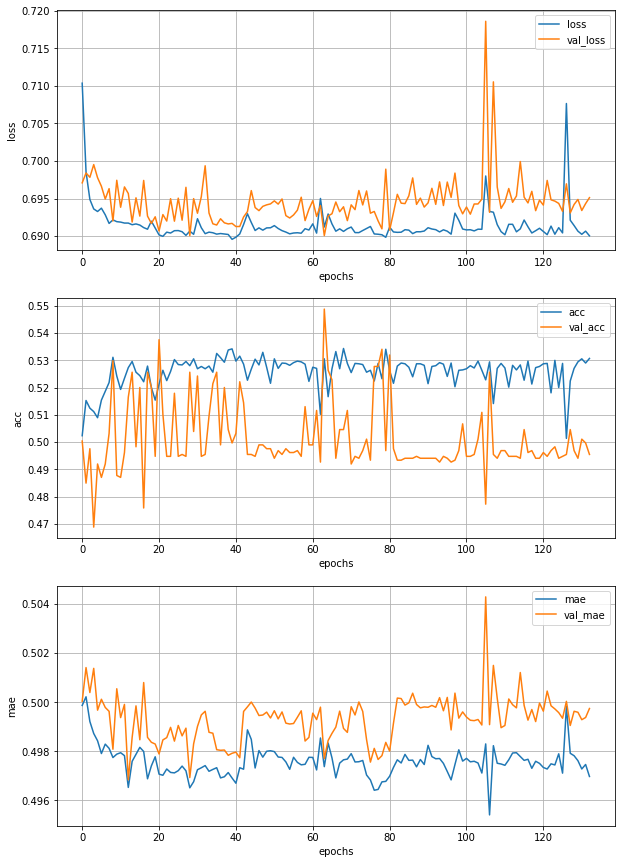

Epoch 134/150
223/223 [==============================] - 58s 260ms/step - loss: 0.6923 - acc: 0.5140 - mae: 0.4986 - val_loss: 0.6985 - val_acc: 0.4905 - val_mae: 0.5002


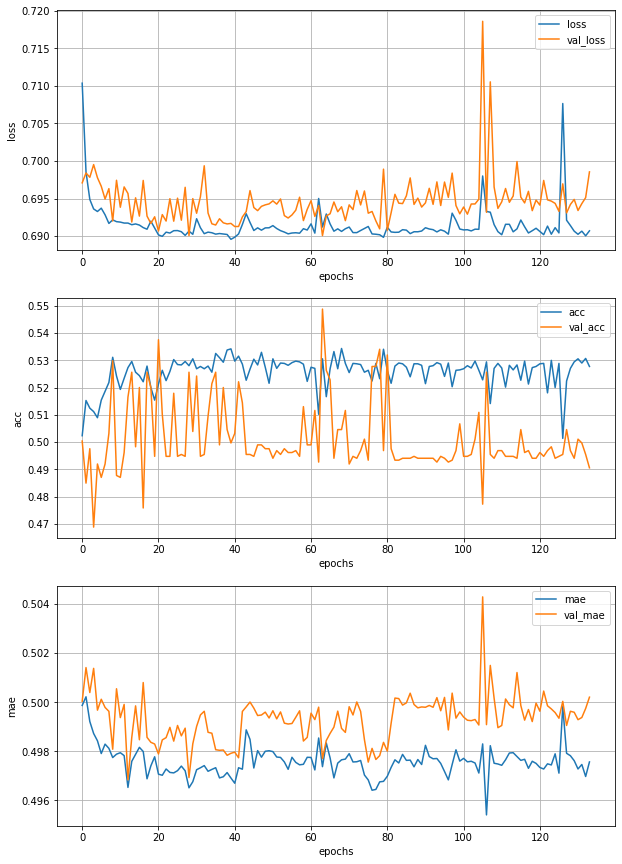

Epoch 135/150
223/223 [==============================] - 58s 262ms/step - loss: 0.6909 - acc: 0.5309 - mae: 0.4973 - val_loss: 0.6938 - val_acc: 0.4947 - val_mae: 0.4996


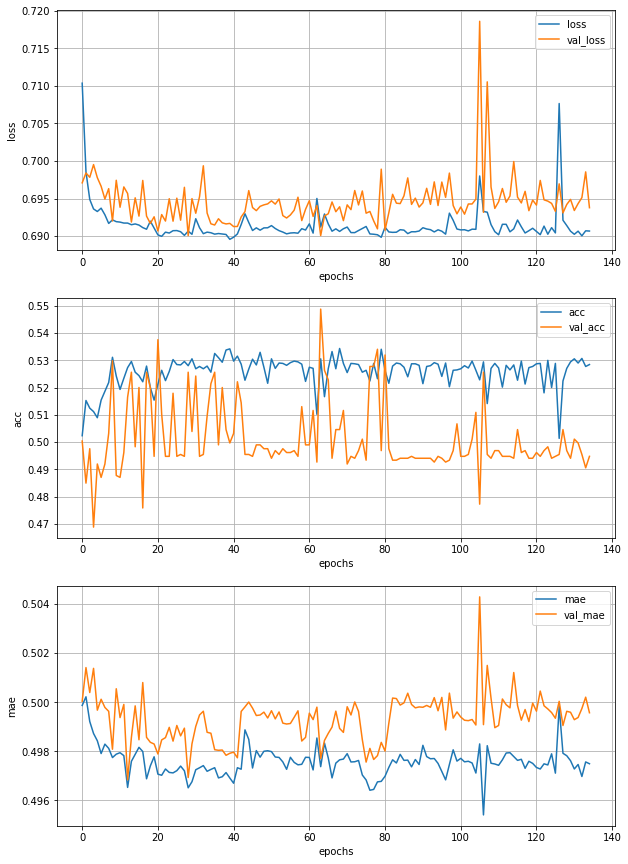

Epoch 136/150
223/223 [==============================] - 58s 262ms/step - loss: 0.6912 - acc: 0.5255 - mae: 0.4981 - val_loss: 0.6958 - val_acc: 0.4947 - val_mae: 0.4998


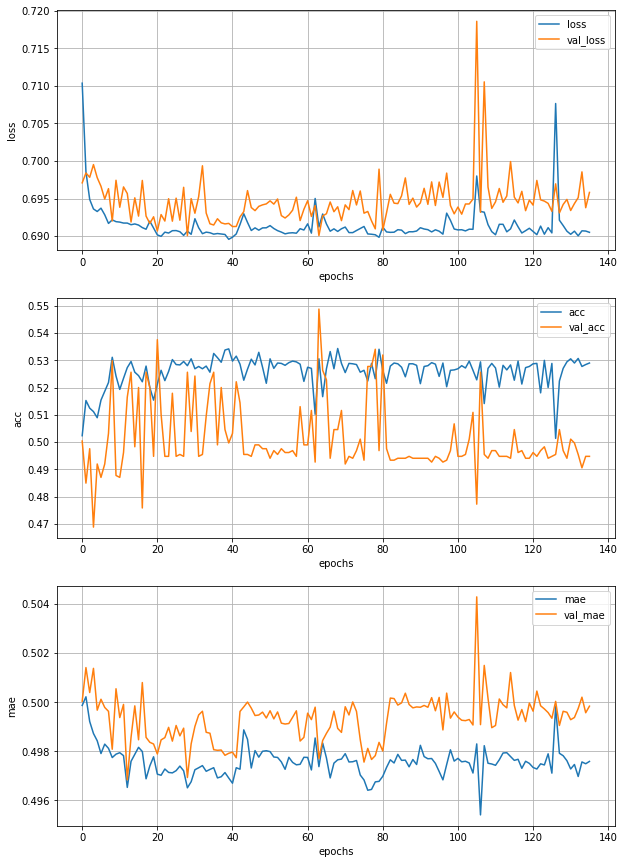

Epoch 137/150
223/223 [==============================] - 58s 262ms/step - loss: 0.6903 - acc: 0.5276 - mae: 0.4973 - val_loss: 0.6957 - val_acc: 0.4954 - val_mae: 0.4999


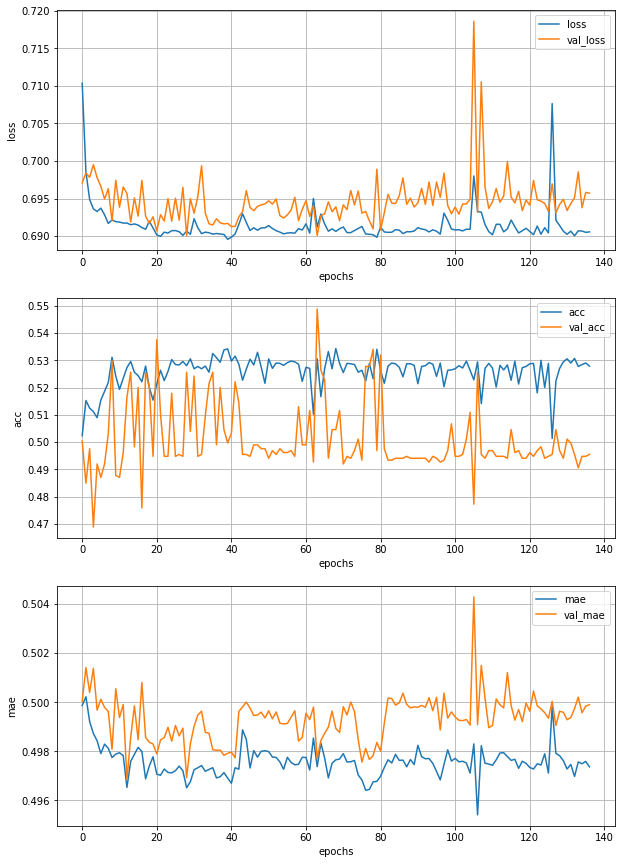

Epoch 138/150
223/223 [==============================] - 58s 259ms/step - loss: 0.6910 - acc: 0.5224 - mae: 0.4974 - val_loss: 0.6947 - val_acc: 0.5004 - val_mae: 0.4992


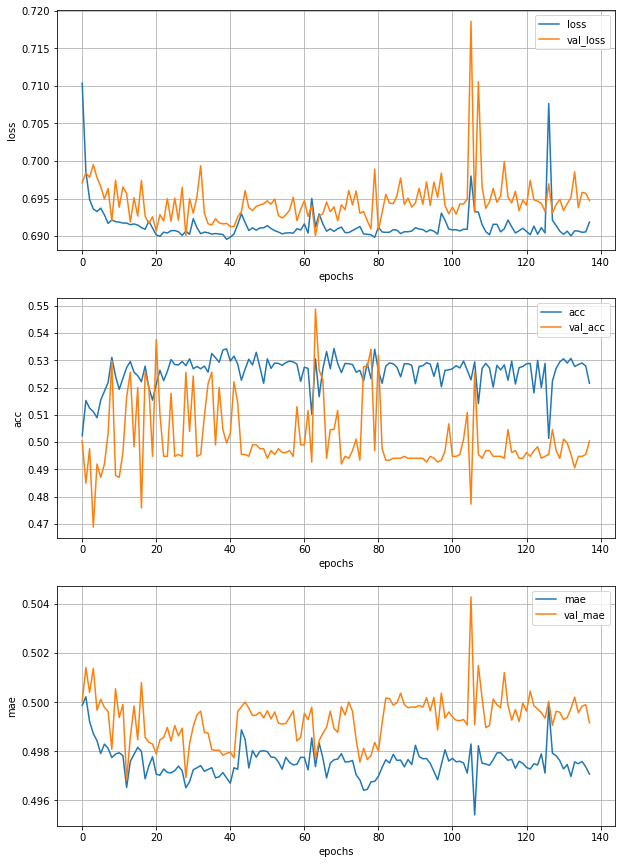

Epoch 139/150
223/223 [==============================] - 58s 260ms/step - loss: 0.6900 - acc: 0.5419 - mae: 0.4963 - val_loss: 0.6933 - val_acc: 0.5025 - val_mae: 0.4992


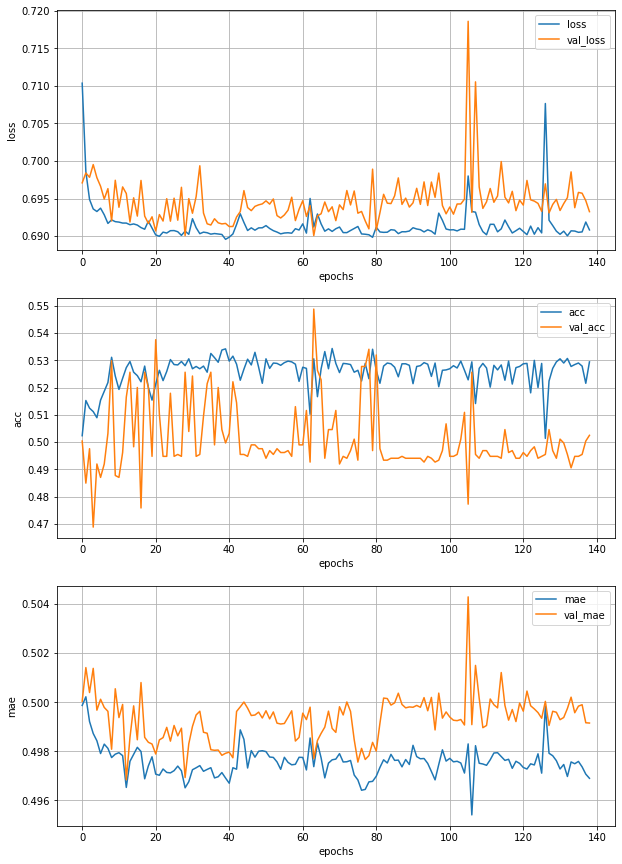

Epoch 140/150
223/223 [==============================] - 60s 268ms/step - loss: 0.6922 - acc: 0.5143 - mae: 0.4981 - val_loss: 0.6921 - val_acc: 0.5123 - val_mae: 0.4984


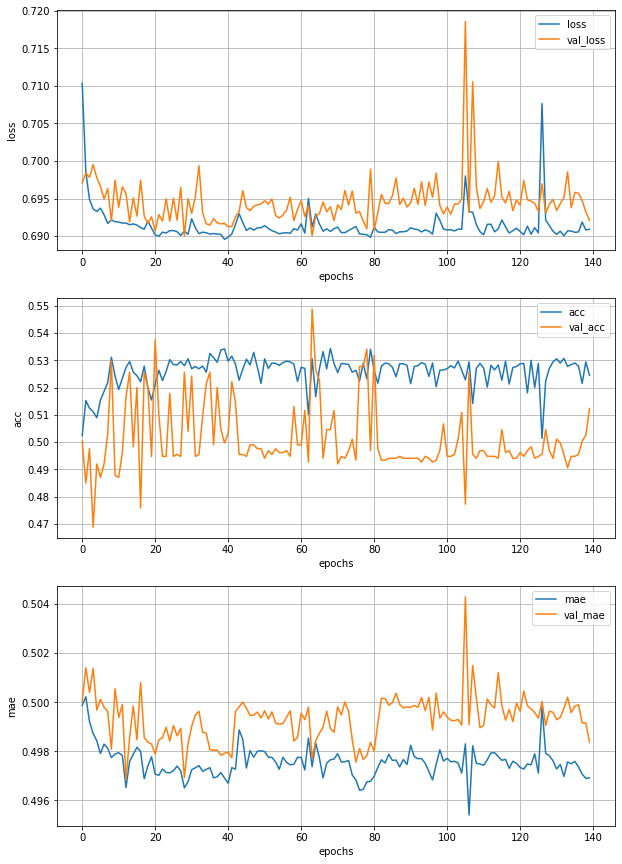

Epoch 141/150
223/223 [==============================] - 58s 262ms/step - loss: 0.6901 - acc: 0.5187 - mae: 0.4970 - val_loss: 0.6921 - val_acc: 0.5116 - val_mae: 0.4986


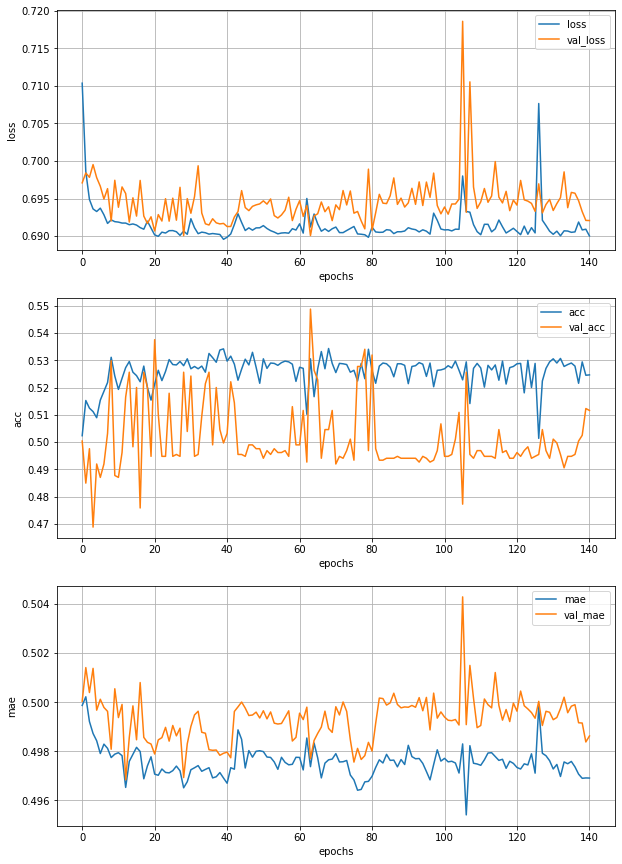

Epoch 142/150
223/223 [==============================] - 60s 270ms/step - loss: 0.6921 - acc: 0.5134 - mae: 0.4978 - val_loss: 0.6931 - val_acc: 0.5039 - val_mae: 0.4991


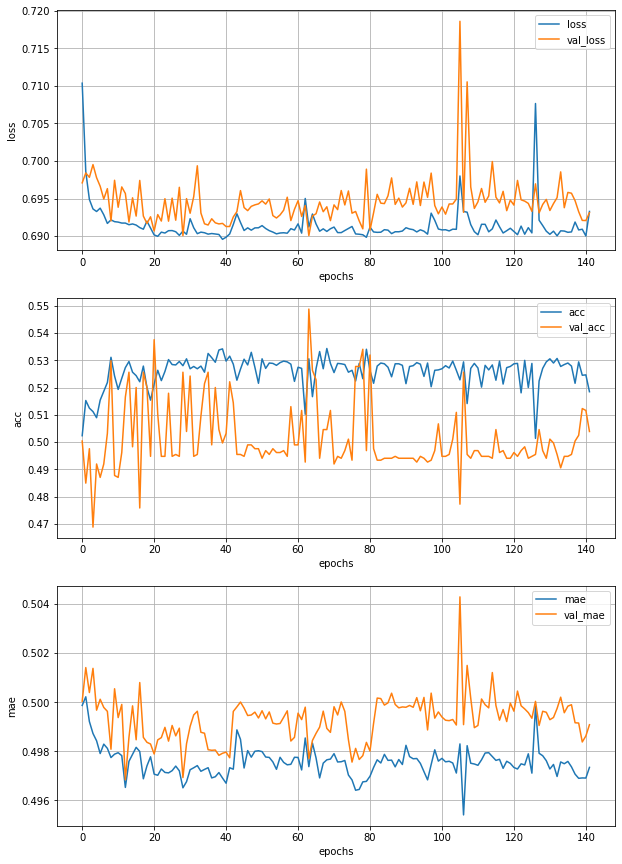

Epoch 143/150
223/223 [==============================] - 60s 269ms/step - loss: 0.6910 - acc: 0.5225 - mae: 0.4979 - val_loss: 0.6940 - val_acc: 0.4989 - val_mae: 0.4987


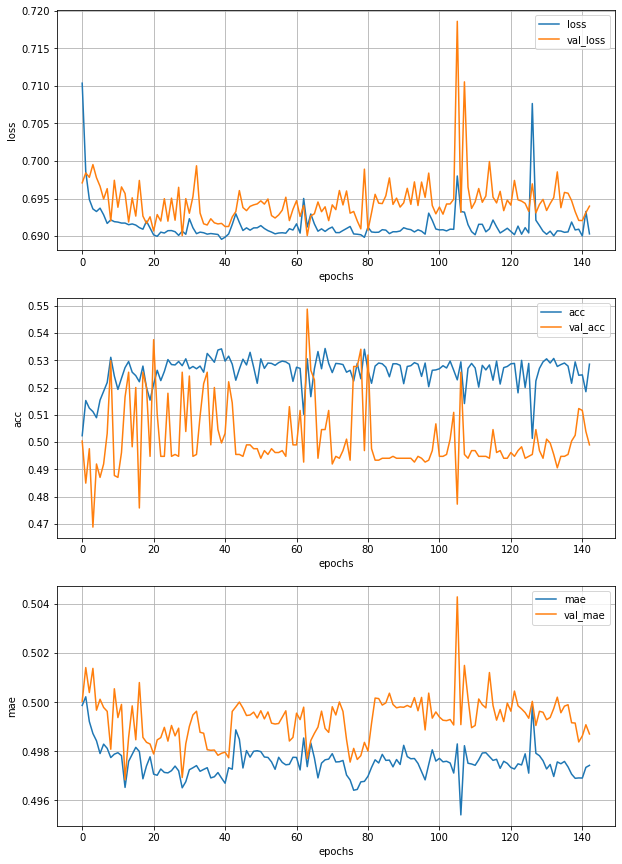

Epoch 144/150
223/223 [==============================] - 58s 261ms/step - loss: 0.6909 - acc: 0.5229 - mae: 0.4974 - val_loss: 0.6943 - val_acc: 0.4961 - val_mae: 0.4989


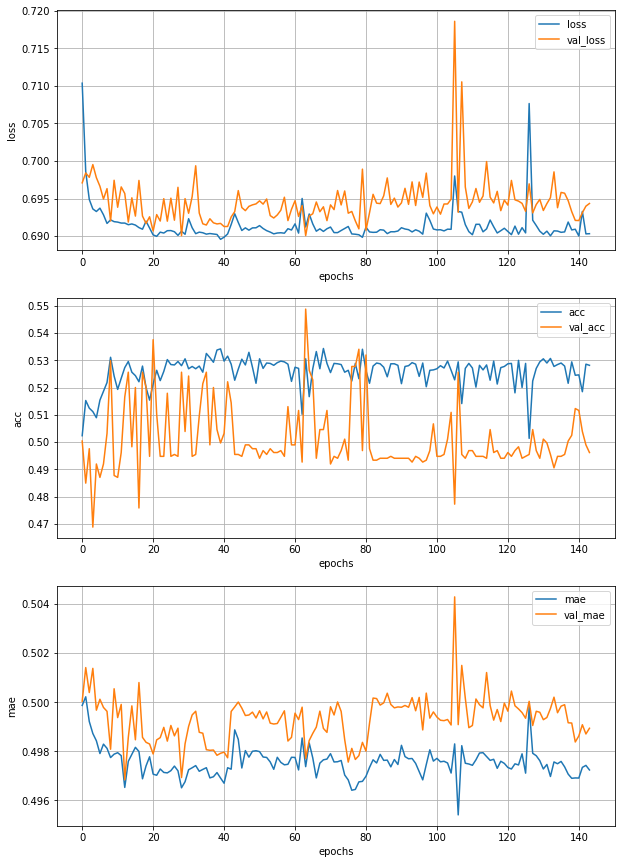

Epoch 145/150
223/223 [==============================] - 61s 275ms/step - loss: 0.6900 - acc: 0.5307 - mae: 0.4970 - val_loss: 0.6935 - val_acc: 0.4912 - val_mae: 0.4993


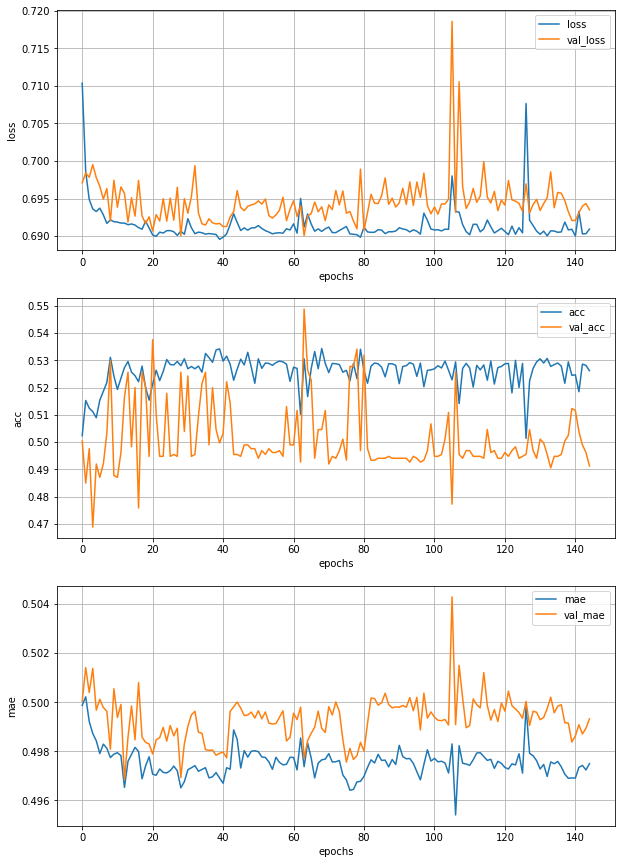

Epoch 146/150
223/223 [==============================] - 60s 271ms/step - loss: 0.6906 - acc: 0.5244 - mae: 0.4977 - val_loss: 0.6940 - val_acc: 0.5095 - val_mae: 0.4989


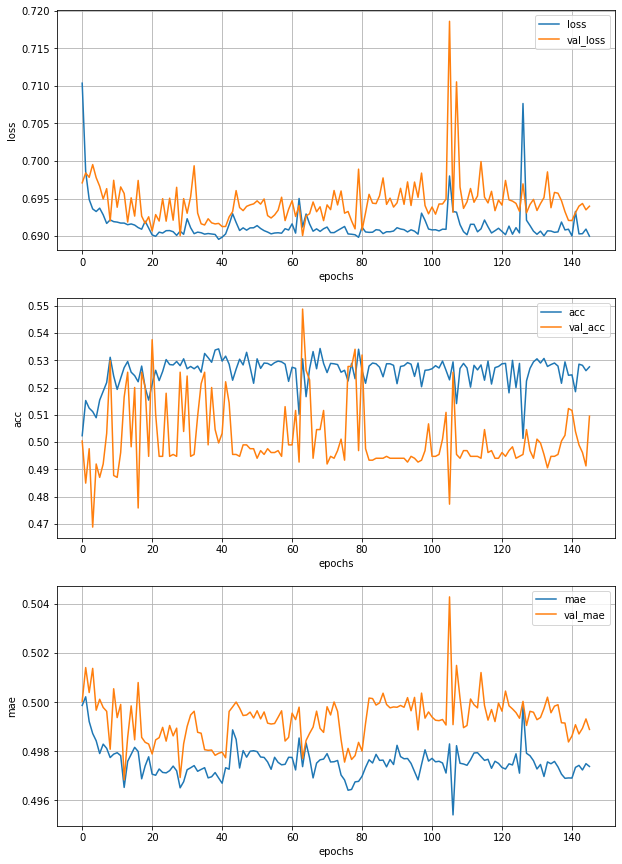

Epoch 147/150
223/223 [==============================] - 59s 264ms/step - loss: 0.6910 - acc: 0.5208 - mae: 0.4973 - val_loss: 0.6976 - val_acc: 0.4933 - val_mae: 0.5002


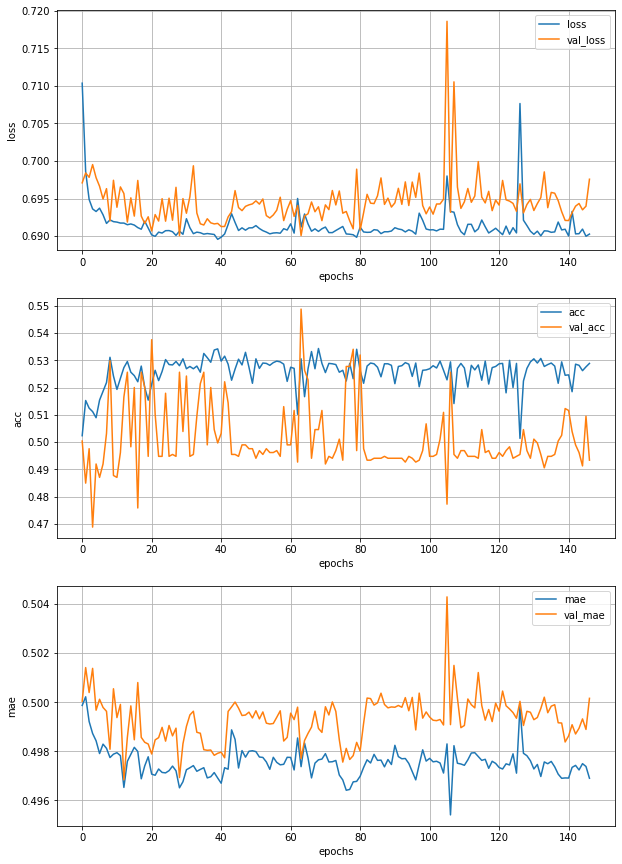

Epoch 148/150
223/223 [==============================] - 59s 266ms/step - loss: 0.6910 - acc: 0.5211 - mae: 0.4973 - val_loss: 0.6969 - val_acc: 0.4926 - val_mae: 0.5001


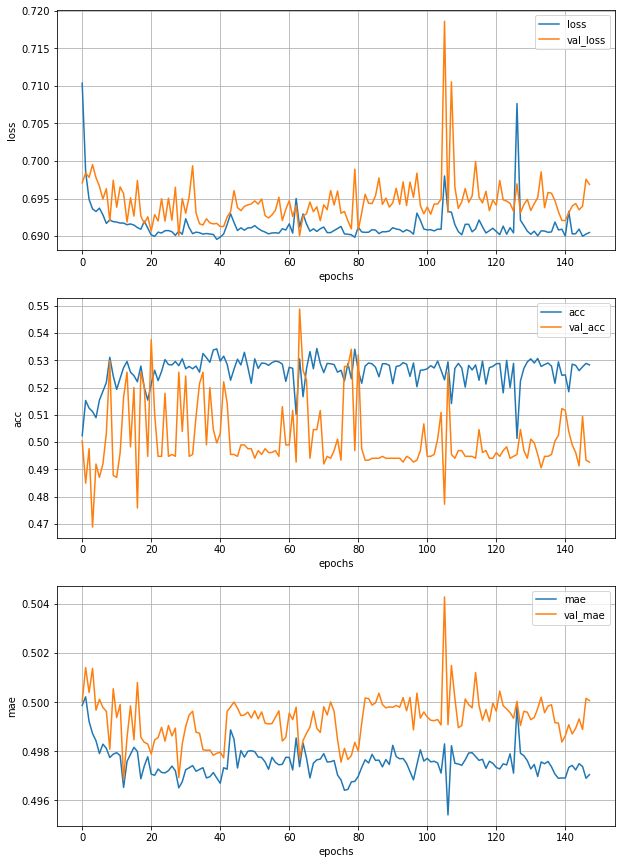

Epoch 149/150
223/223 [==============================] - 62s 276ms/step - loss: 0.6891 - acc: 0.5432 - mae: 0.4959 - val_loss: 0.6936 - val_acc: 0.4982 - val_mae: 0.4996


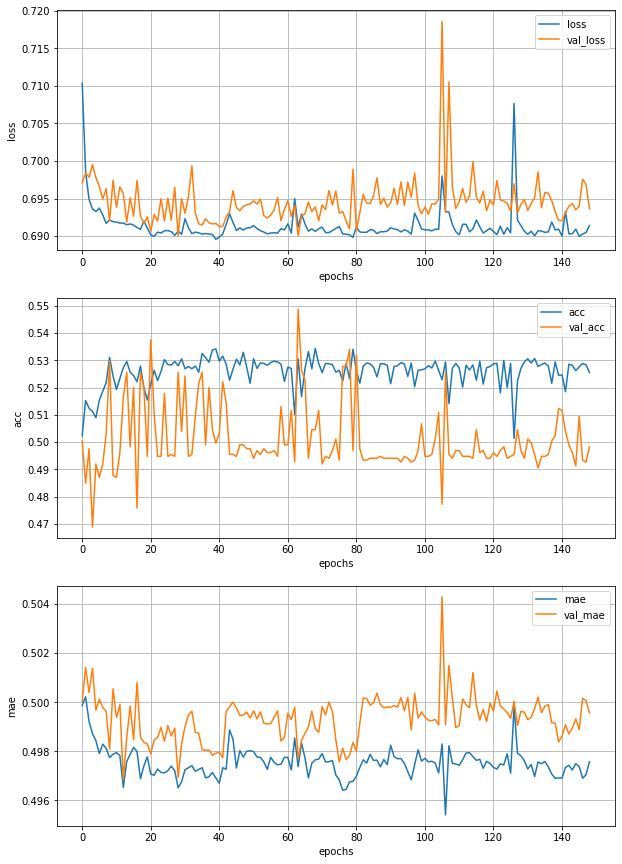

Epoch 150/150
223/223 [==============================] - 61s 272ms/step - loss: 0.6915 - acc: 0.5202 - mae: 0.4980 - val_loss: 0.6970 - val_acc: 0.4919 - val_mae: 0.5003


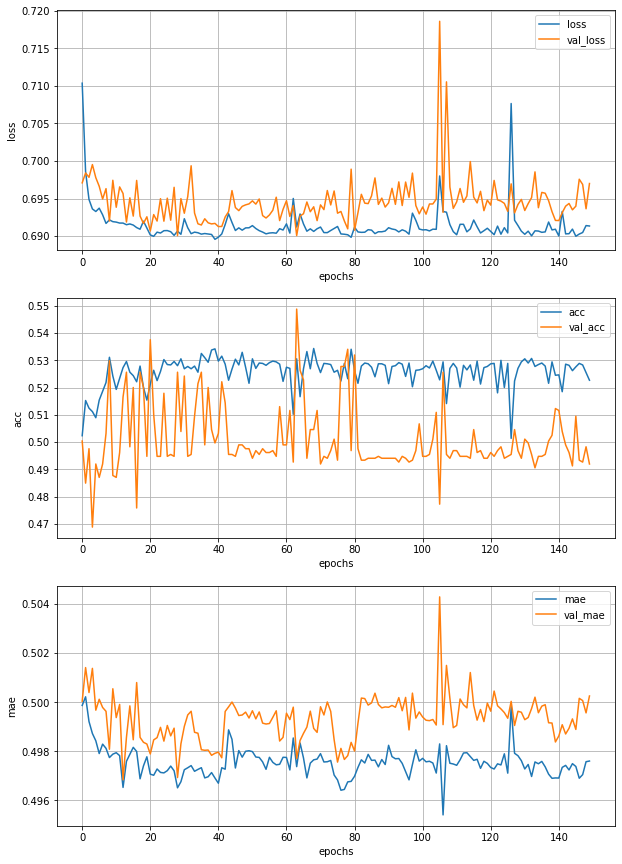

30/30 [==============================] - 1s 28ms/step - loss: 0.6891 - acc: 0.5368 - mae: 0.4964


[0.6890550851821899, 0.5368421077728271, 0.49638110399246216]

In [ ]:
hist = Record()
decision.fit(
    training_x, training_y,
    epochs=150,
    validation_data=(val_x, val_y),
    callbacks=[hist]
)
decision.evaluate(testing_x, testing_y)

In [ ]:
# decision.save_weights('./models/weight-sol3--bert-128-16-1--20%do--150epochs',overwrite=True)